INCLUDING LIBRARIES

In [1]:
import cv2 as cv
import numpy as np
import os
import pandas as pd
import random
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

READING TRAINING IMAGES

In [2]:
basePath = 'Data/Train/'
allClasses = [d for d in os.listdir(basePath) if os.path.isdir(os.path.join(basePath, d))]
selectedClasses = random.sample(allClasses, 7)
print(selectedClasses)

['5', '12', '26', '18', '20', '36', '9']


SEPARATING IMAGES BASED ON CLASS

In [3]:
imagesByClass = {}

for className in selectedClasses:
    classPath = os.path.join(basePath, className)
    
    imageFiles = [f for f in os.listdir(classPath) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    selectedFiles = random.sample(imageFiles, min(100, len(imageFiles)))
    
    images = []
    for imgFile in selectedFiles:
        imgPath = os.path.join(classPath, imgFile)
        img = cv.imread(imgPath)
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        images.append(img)

    imagesByClass[className] = images

FILTERS

In [4]:
def mean_filter(image):
    padded = np.pad(image, 1, mode='reflect')
    output = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            neighborhood = padded[i:i+3, j:j+3]
            output[i, j] = np.mean(neighborhood)

    return output

In [5]:
def gaussian_kernel(size=3, sigma=1.0):
    ax = np.arange(-size // 2 + 1., size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
    return kernel / np.sum(kernel)

def apply_gaussian_filter_rgb(image, kernel_size=3, sigma=1.0):
    kernel = gaussian_kernel(kernel_size, sigma)
    pad = kernel_size // 2
    output = np.zeros_like(image, dtype=np.float32)
    
    for c in range(3):  # R, G, B
        padded = np.pad(image[:, :, c], pad, mode='reflect')
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                region = padded[i:i+kernel_size, j:j+kernel_size]
                output[i, j, c] = np.sum(region * kernel)
    
    return np.clip(output, 0, 255).astype(np.uint8)

In [6]:
def median_filter(image):
    padded = np.pad(image, 1, mode='reflect')
    output = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            neighborhood = padded[i:i+3, j:j+3]
            output[i, j] = np.median(neighborhood)

    return output

In [7]:
def adaptive_median_filter(image, max_window_size=7):
    padded = np.pad(image, max_window_size//2, mode='reflect')
    output = np.copy(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            window_size = 3
            while window_size <= max_window_size:
                r = window_size // 2
                neighborhood = padded[i:i+window_size, j:j+window_size]
                Z_min = neighborhood.min()
                Z_max = neighborhood.max()
                Z_med = np.median(neighborhood)
                Z_xy = padded[i + r, j + r]

                A1 = Z_med - Z_min
                A2 = Z_med - Z_max

                if A1 > 0 and A2 < 0:
                    B1 = Z_xy - Z_min
                    B2 = int(Z_xy) - int(Z_max)

                    if B1 > 0 and B2 < 0:
                        output[i, j] = Z_xy
                    else:
                        output[i, j] = Z_med
                    break
                else:
                    window_size += 2
            else:
                output[i, j] = Z_med

    return output


In [8]:
def highboost_filter_rgb(image, kernel_size=3, sigma=1.0, k=1.5):
    blurred = apply_gaussian_filter_rgb(image, kernel_size, sigma)
    mask = image.astype(np.int32) - blurred.astype(np.int32)
    boosted = image.astype(np.int32) + k * mask
    return np.clip(boosted, 0, 255).astype(np.uint8)


In [9]:
def apply_filter_to_rgb(image, filter_func):
    filtered = np.zeros_like(image)
    for c in range(3):  # R, G, B
        filtered[..., c] = filter_func(image[..., c])
    return filtered

In [10]:
filteredByClass = {}
for key, value in imagesByClass.items():
    classImgs = []
    for i in value:
        temp = highboost_filter_rgb(i)
        classImgs.append(temp)
    filteredByClass[key] = classImgs    

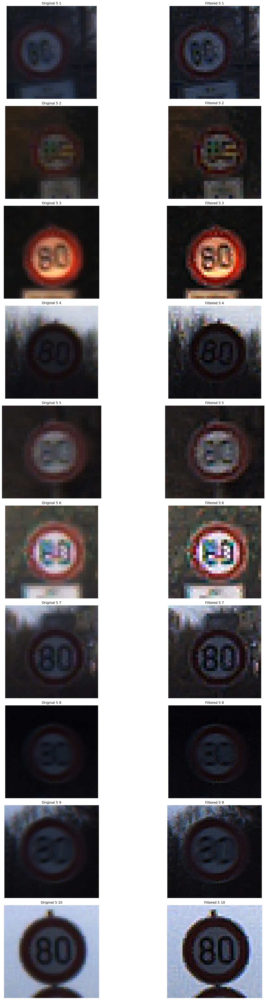

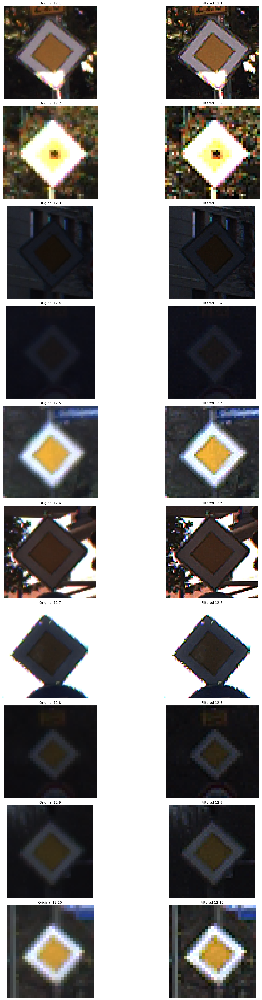

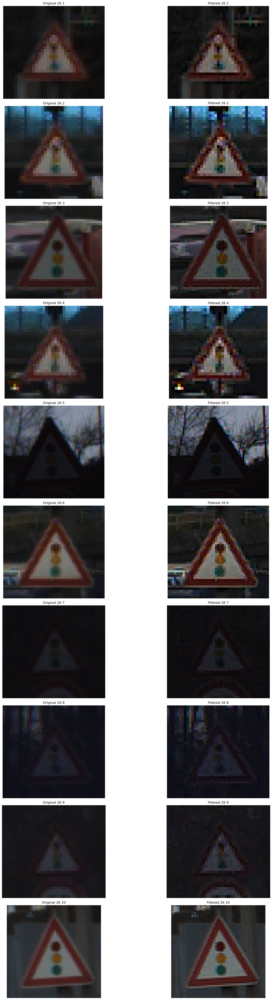

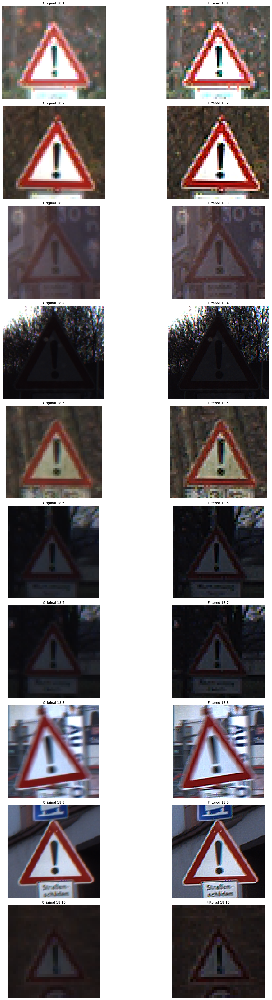

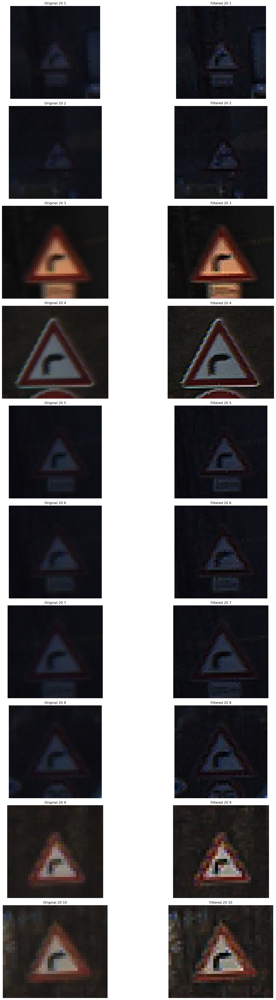

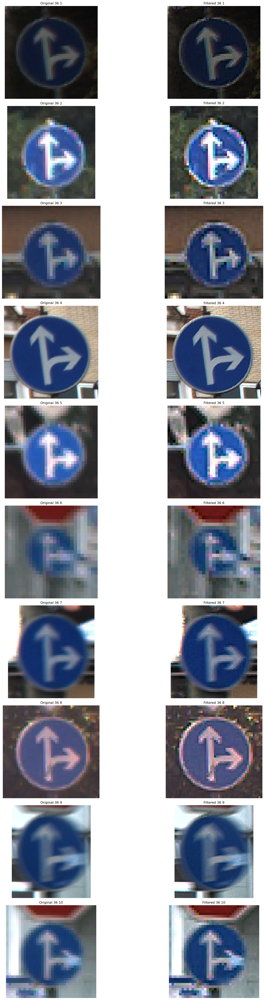

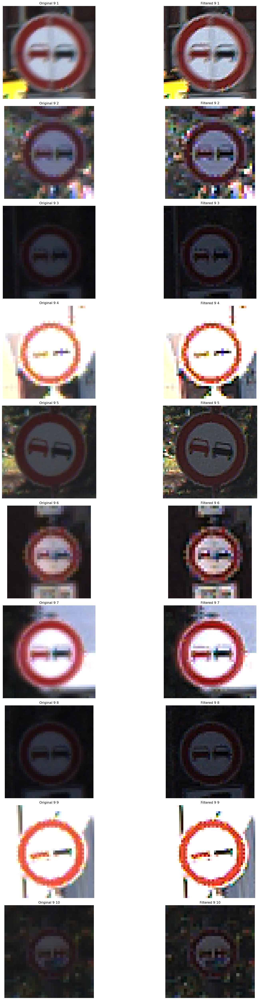

In [11]:
for class_name, original_images in imagesByClass.items():
    filtered_images = filteredByClass[class_name]    
    fig, axes = plt.subplots(10, 2, figsize=(20, 50))

    for i in range(10):
        axes[i, 0].imshow(original_images[i])
        axes[i, 0].set_title(f"Original {class_name} {i+1}")
        axes[i, 0].axis('off') 

        axes[i, 1].imshow(filtered_images[i])
        axes[i, 1].set_title(f"Filtered {class_name} {i+1}")
        axes[i, 1].axis('off') 
    
    plt.tight_layout()
    plt.show()

In [12]:
def rgb_to_hsv_simple(rgb):
    rgb = rgb.astype('float')
    maxv = np.amax(rgb, axis=2)
    maxc = np.argmax(rgb, axis=2)
    minv = np.amin(rgb, axis=2)
    minc = np.argmin(rgb, axis=2)

    hsv = np.zeros(rgb.shape, dtype='float')
    hsv[maxc == minc, 0] = np.zeros(hsv[maxc == minc, 0].shape)
    hsv[maxc == 0, 0] = (((rgb[..., 1] - rgb[..., 2]) * 60.0 / (maxv - minv + np.spacing(1))) % 360.0)[maxc == 0]
    hsv[maxc == 1, 0] = (((rgb[..., 2] - rgb[..., 0]) * 60.0 / (maxv - minv + np.spacing(1))) + 120.0)[maxc == 1]
    hsv[maxc == 2, 0] = (((rgb[..., 0] - rgb[..., 1]) * 60.0 / (maxv - minv + np.spacing(1))) + 240.0)[maxc == 2]
    hsv[maxv == 0, 1] = np.zeros(hsv[maxv == 0, 1].shape)
    hsv[maxv != 0, 1] = (1 - minv / (maxv + np.spacing(1)))[maxv != 0]
    hsv[..., 2] = maxv

    return hsv


In [13]:
def segment_red_blue(image_hsv):
    

    H = image_hsv[..., 0]
    S = image_hsv[..., 1]
    V = image_hsv[..., 2]

    H = H / 2  

    S_thresh = 100 / 255.0
    V_thresh = 80 / 255.0

    red_mask = (
        (((H >= 0) & (H <= 15)) | ((H >= 165) & (H <= 180))) &
        (S >= S_thresh) &
        (V >= V_thresh)
    )

    blue_mask = (
        (H >= 100) & (H <= 130) &
        (S >= S_thresh) &
        (V >= V_thresh)
    )

    return red_mask.astype(np.uint8), blue_mask.astype(np.uint8)


In [14]:
redBlueMasksByClass = {}

for class_name, images in imagesByClass.items():
    red_masks = []
    blue_masks = []
    
    for img in images:
        hsv_img = rgb_to_hsv_simple(img)
        red_mask, blue_mask = segment_red_blue(hsv_img)
        red_masks.append(red_mask)
        blue_masks.append(blue_mask)
    
    redBlueMasksByClass[class_name] = {
        'original': images,
        'red': red_masks,
        'blue': blue_masks
    }


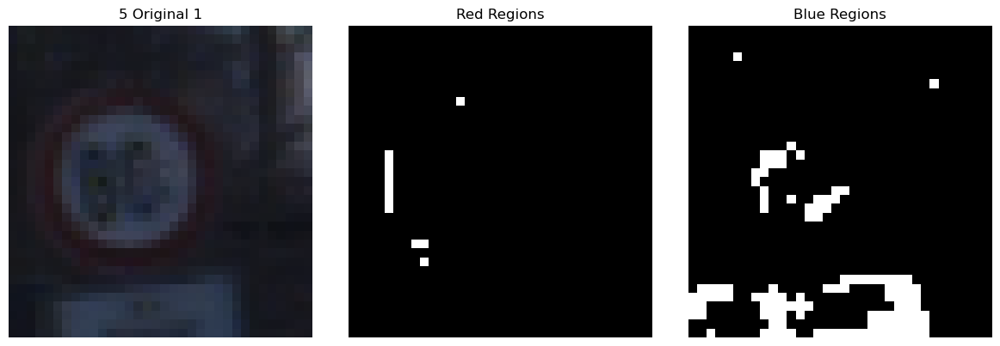

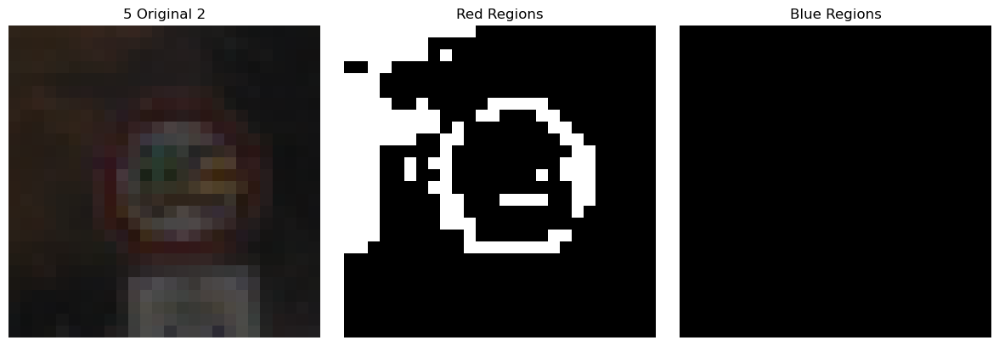

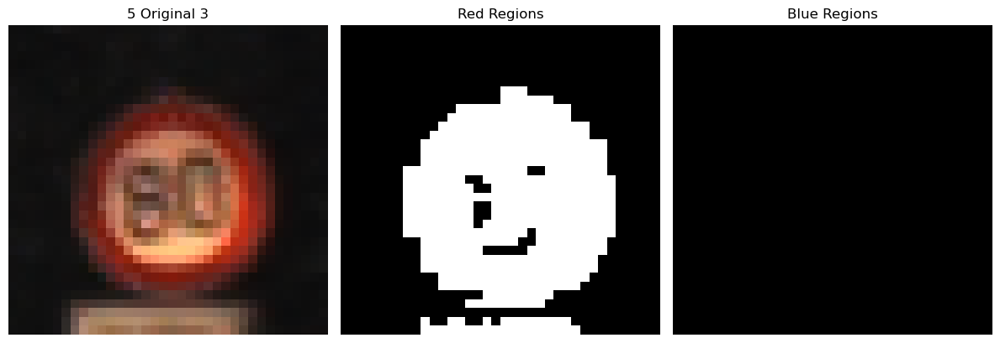

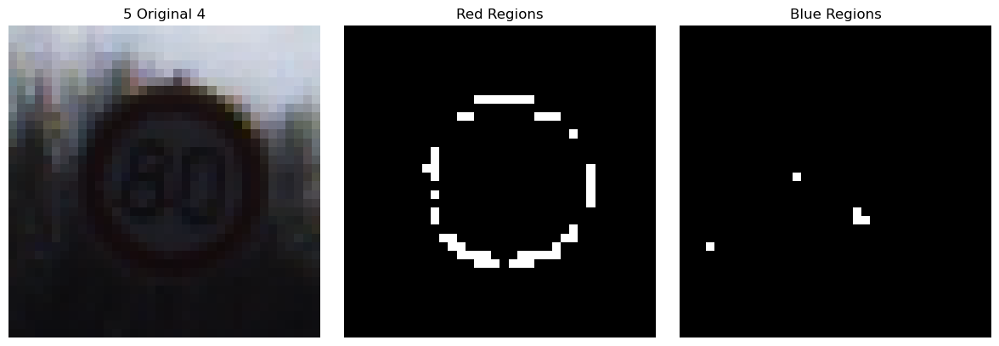

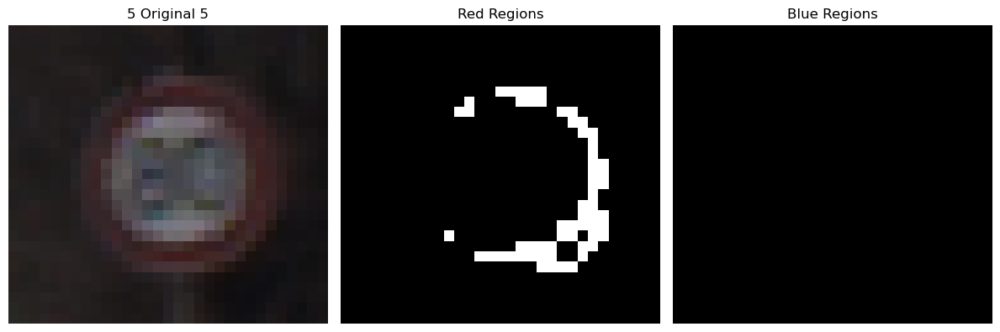

...

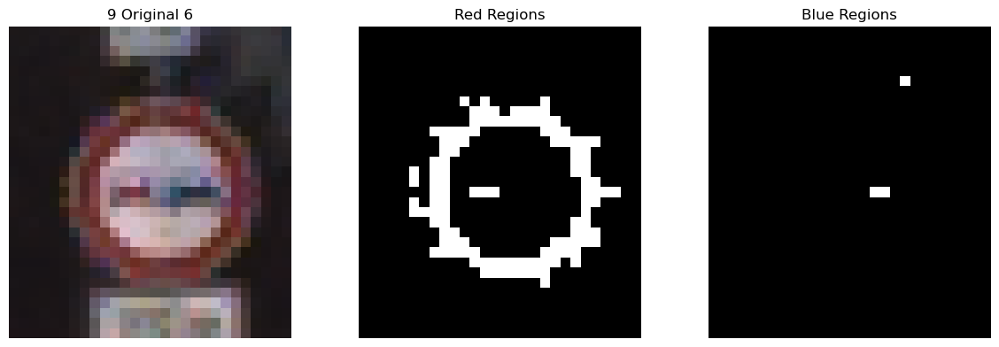

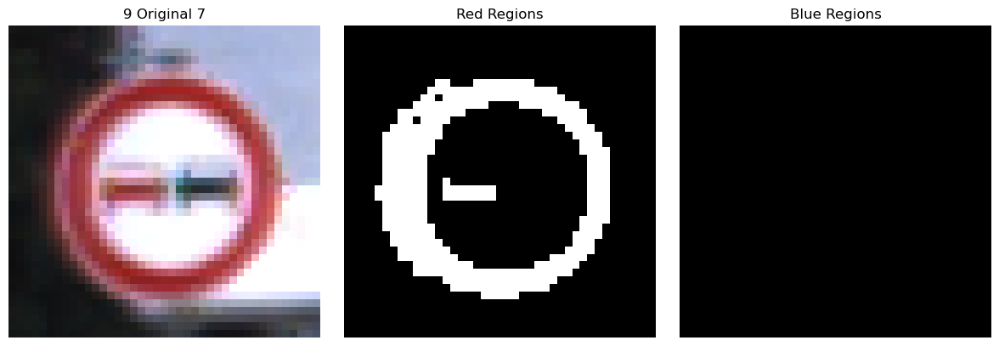

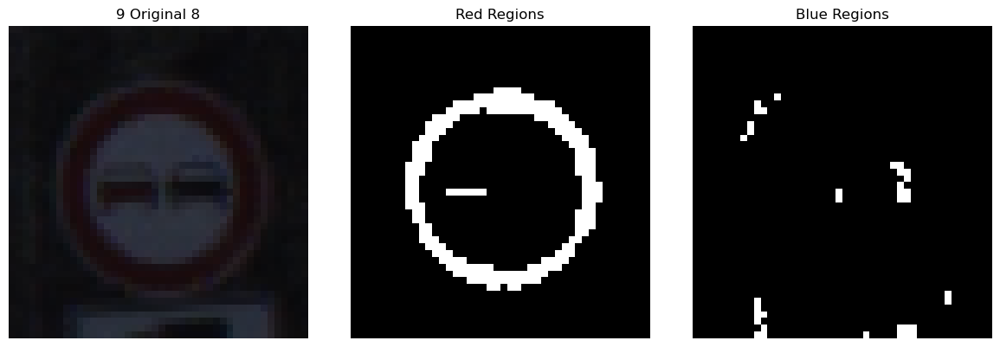

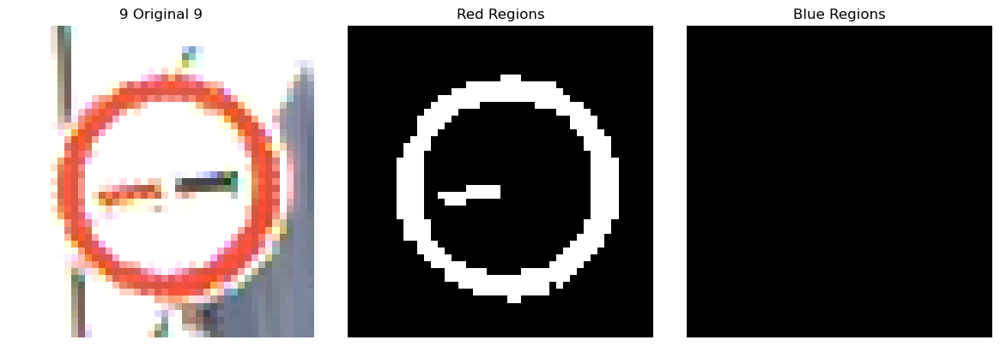

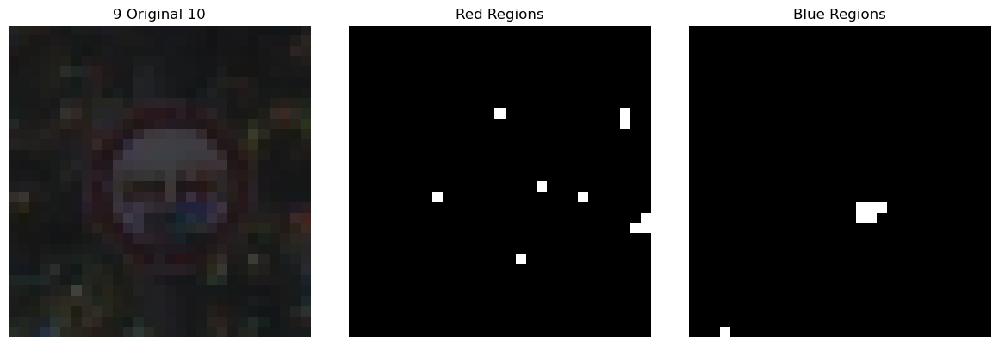

In [15]:
for class_name, data in redBlueMasksByClass.items():
    original_images = data['original']
    red_masks = data['red']
    blue_masks = data['blue']

    num_to_show = min(10, len(original_images))

    for i in range(num_to_show):
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))

        axes[0].imshow(original_images[i])
        axes[0].set_title(f"{class_name} Original {i+1}")
        axes[0].axis('off')

        axes[1].imshow(red_masks[i] * 255, cmap='gray')
        axes[1].set_title("Red Regions")
        axes[1].axis('off')

        axes[2].imshow(blue_masks[i] * 255, cmap='gray')
        axes[2].set_title("Blue Regions")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()


In [16]:
def threshold_mask(mask, thresh=0.5):
    return (mask > thresh).astype(np.uint8)

In [17]:
def erode(mask):
    padded = np.pad(mask, 1, mode='constant', constant_values=0)
    output = np.zeros_like(mask)

    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            region = padded[i:i+3, j:j+3]
            if np.all(region == 1):
                output[i, j] = 1
    return output


In [18]:
def dilate(mask):
    padded = np.pad(mask, 1, mode='constant', constant_values=0)
    output = np.zeros_like(mask)

    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            region = padded[i:i+3, j:j+3]
            if np.any(region == 1):
                output[i, j] = 1
    return output


In [19]:
def opening(mask):
    return dilate(erode(mask))


In [20]:
def erode(img1, kernel_size=3):
    SE = np.ones((kernel_size, kernel_size), dtype=np.uint8)
    constant = kernel_size // 2
    m, n = img1.shape
    imgErode = np.zeros_like(img1)

    for i in range(constant, m - constant):
        for j in range(constant, n - constant):
            temp = img1[i - constant:i + constant + 1, j - constant:j + constant + 1]
            product = temp * SE
            if np.array_equal(product, SE):
                imgErode[i, j] = 1
            else:
                imgErode[i, j] = 0

    return imgErode

def dilate(img2, kernel_type='cross', kernel_size=3):
    p, q = img2.shape
    imgDilate = np.zeros_like(img2)

    if kernel_type == 'square':
        SED = np.ones((kernel_size, kernel_size), dtype=np.uint8)
        constant = kernel_size // 2
    elif kernel_type == 'cross':
        SED = np.array([[0,1,0], [1,1,1], [0,1,0]], dtype=np.uint8)
        constant = 1
    else:
        raise ValueError("kernel_type must be 'square' or 'cross'.")

    for i in range(constant, p - constant):
        for j in range(constant, q - constant):
            temp = img2[i - constant:i + constant + 1, j - constant:j + constant + 1]
            product = temp * SED
            imgDilate[i, j] = np.max(product)

    return imgDilate

def opening(mask, k=3):
    return dilate(erode(mask, k), kernel_size=k)


In [21]:
def connected_components(mask):
    visited = np.zeros_like(mask, dtype=bool)
    labeled = np.zeros_like(mask, dtype=int)
    label = 1
    h, w = mask.shape

    def dfs(x, y):
        stack = [(x, y)]
        component = []
        while stack:
            cx, cy = stack.pop()
            if (0 <= cx < h) and (0 <= cy < w):
                if mask[cx, cy] == 1 and not visited[cx, cy]:
                    visited[cx, cy] = True
                    labeled[cx, cy] = label
                    component.append((cx, cy))
                    for dx in [-1, 0, 1]:
                        for dy in [-1, 0, 1]:
                            if dx != 0 or dy != 0:
                                stack.append((cx + dx, cy + dy))
        return component

    components = []
    for i in range(h):
        for j in range(w):
            if mask[i, j] == 1 and not visited[i, j]:
                comp = dfs(i, j)
                if comp:
                    components.append(comp)
                    label += 1
    return labeled, components


In [22]:
def remove_small_components(mask, min_area=100):
    labeled, components = connected_components(mask)
    output = np.zeros_like(mask)
    for comp in components:
        if len(comp) >= min_area:
            for x, y in comp:
                output[x, y] = 1
    return output


In [23]:
def fill_holes(mask, max_hole_area=100):
    h, w = mask.shape
    filled = mask.copy()
    visited = np.zeros_like(mask, dtype=bool)
    hole_id = 2 
    holes = []

    def flood_fill(x, y, label):
        stack = [(x, y)]
        region = []
        border_touch = False

        while stack:
            cx, cy = stack.pop()
            if (0 <= cx < h) and (0 <= cy < w):
                if not visited[cx, cy] and filled[cx, cy] == 0:
                    visited[cx, cy] = True
                    filled[cx, cy] = label
                    region.append((cx, cy))

                    if cx == 0 or cx == h - 1 or cy == 0 or cy == w - 1:
                        border_touch = True

                    for dx in [-1, 0, 1]:
                        for dy in [-1, 0, 1]:
                            if dx != 0 or dy != 0:
                                stack.append((cx + dx, cy + dy))

        return region, border_touch

    for i in range(h):
        for j in range(w):
            if filled[i, j] == 0 and not visited[i, j]:
                region, touches_border = flood_fill(i, j, hole_id)
                if not touches_border and len(region) <= max_hole_area:
                    for x, y in region:
                        filled[x, y] = 1
                else:
                    for x, y in region:
                        filled[x, y] = 0
                hole_id += 1

    return filled


In [24]:
def visualize_postprocessing_steps(original_mask, area_thresh=100):
    step1 = threshold_mask(original_mask)
    step2 = opening(step1)
    step3 = remove_small_components(step2, min_area=area_thresh)
    step4 = fill_holes(step3)

    return step4


In [25]:
postprocessedMasksByClass = {}

for class_name, data in redBlueMasksByClass.items():
    red_post = []
    blue_post = []

    red_masks = data['red']
    blue_masks = data['blue']

    for red, blue in zip(red_masks, blue_masks):
        red_postprocessed = visualize_postprocessing_steps(red, area_thresh=30)
        blue_postprocessed = visualize_postprocessing_steps(blue, area_thresh=30)
        red_post.append(red_postprocessed)
        blue_post.append(blue_postprocessed)
    
    postprocessedMasksByClass[class_name] = {
        'original': data['original'],
        'red': red_post,
        'blue': blue_post
    }


In [26]:
def to_v_channel(img_rgb):
    hsv = cv.cvtColor(img_rgb, cv.COLOR_RGB2HSV)
    return hsv[:, :, 2].astype(np.float32)

def sobel_gradients(img):
    Kx = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

    Gx = cv.filter2D(img, -1, Kx)
    Gy = cv.filter2D(img, -1, Ky)

    magnitude = np.hypot(Gx, Gy)
    angle = np.arctan2(Gy, Gx) * (180.0 / np.pi)
    angle[angle < 0] += 180

    return magnitude, angle

def non_max_suppression(magnitude, angle):
    H, W = magnitude.shape
    suppressed = np.zeros((H, W), dtype=np.float32)

    angle = angle % 180

    for i in range(1, H-1):
        for j in range(1, W-1):
            direction = angle[i, j]

            q = 255
            r = 255

            if (0 <= direction < 22.5) or (157.5 <= direction <= 180):
                q = magnitude[i, j+1]
                r = magnitude[i, j-1]
            elif (22.5 <= direction < 67.5):
                q = magnitude[i+1, j-1]
                r = magnitude[i-1, j+1]
            elif (67.5 <= direction < 112.5):
                q = magnitude[i+1, j]
                r = magnitude[i-1, j]
            elif (112.5 <= direction < 157.5):
                q = magnitude[i-1, j-1]
                r = magnitude[i+1, j+1]

            if (magnitude[i, j] >= q) and (magnitude[i, j] >= r):
                suppressed[i, j] = magnitude[i, j]
            else:
                suppressed[i, j] = 0

    return suppressed

def double_threshold_and_tracking(img, low_thresh, high_thresh):
    strong = 255
    weak = 75

    res = np.zeros_like(img, dtype=np.uint8)

    strong_i, strong_j = np.where(img >= high_thresh)
    weak_i, weak_j = np.where((img >= low_thresh) & (img < high_thresh))

    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak

    H, W = img.shape
    for i in range(1, H-1):
        for j in range(1, W-1):
            if res[i, j] == weak:
                if np.any(res[i-1:i+2, j-1:j+2] == strong):
                    res[i, j] = strong
                else:
                    res[i, j] = 0
    return res

def manual_canny_edge_detector(img_rgb, low_thresh=50, high_thresh=100):
    v_channel = to_v_channel(img_rgb)
    mag, angle = sobel_gradients(v_channel)
    suppressed = non_max_suppression(mag, angle)
    edges = double_threshold_and_tracking(suppressed, low_thresh, high_thresh)
    return edges


In [27]:
cannyEdgesByClass = {}

for class_name, image_list in imagesByClass.items():
    edge_list = []
    for img in image_list:
        edges = manual_canny_edge_detector(img, low_thresh=50, high_thresh=100)
        edge_list.append(edges)
    cannyEdgesByClass[class_name] = edge_list


Class: 5


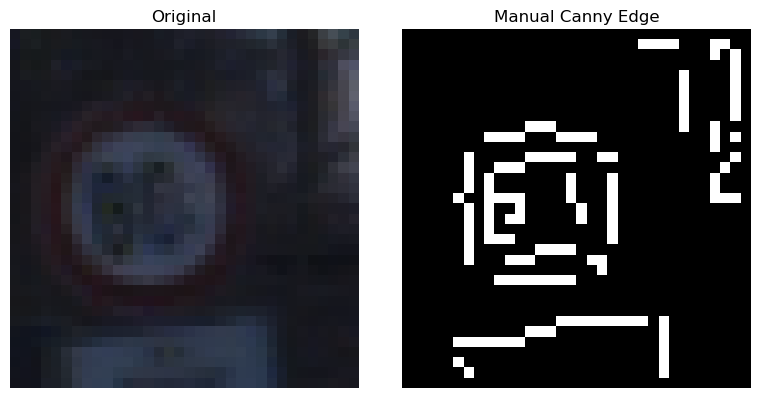

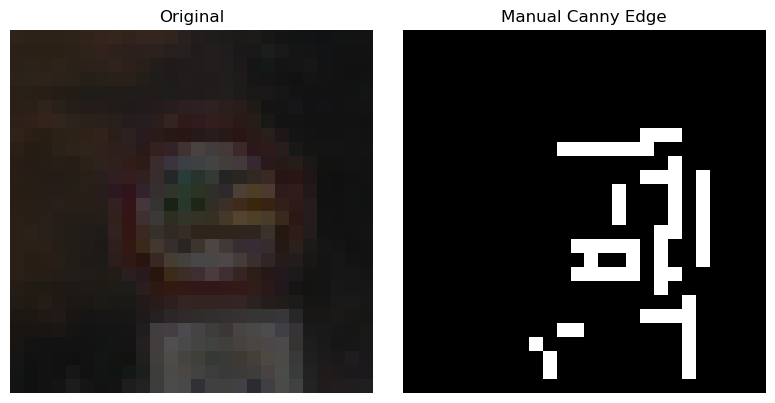

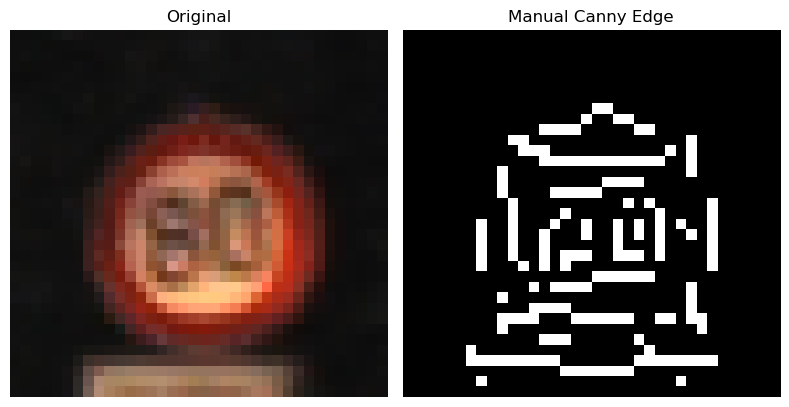

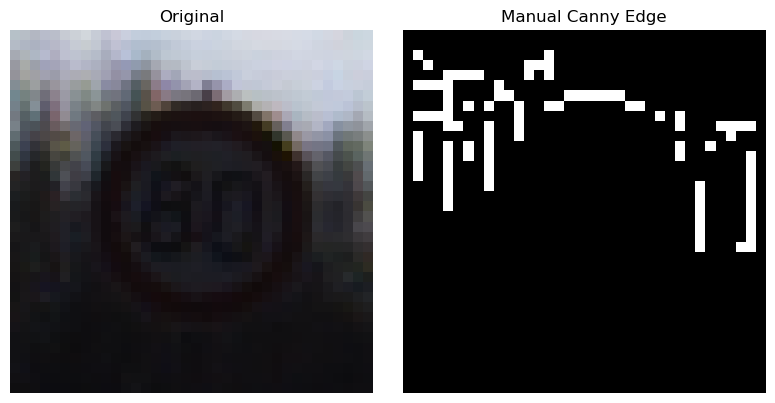

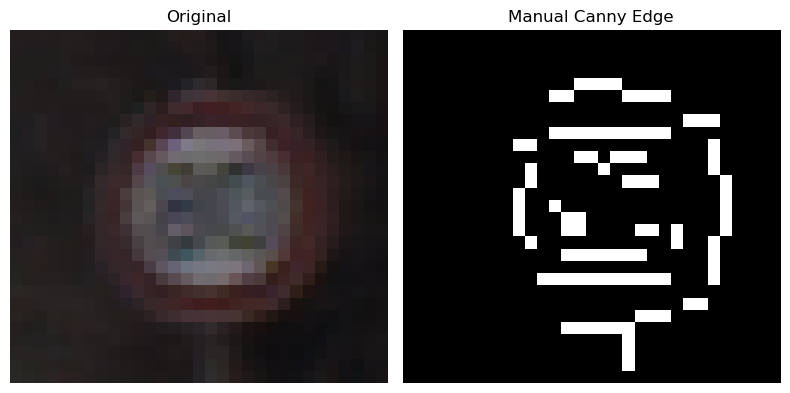

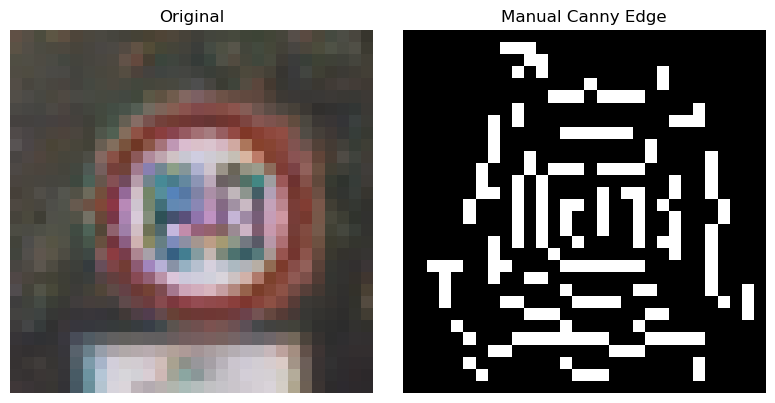

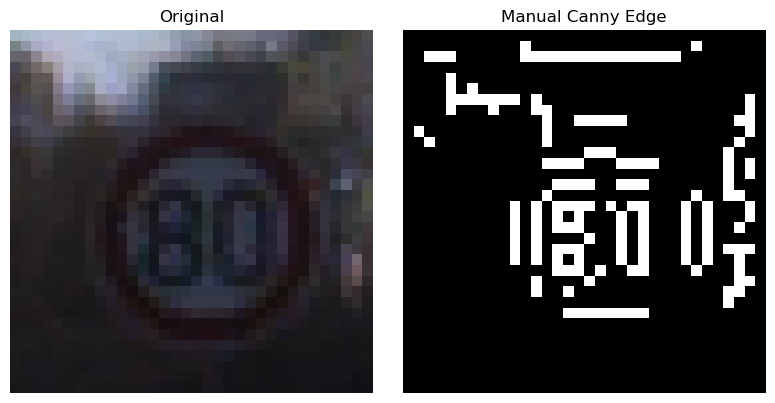

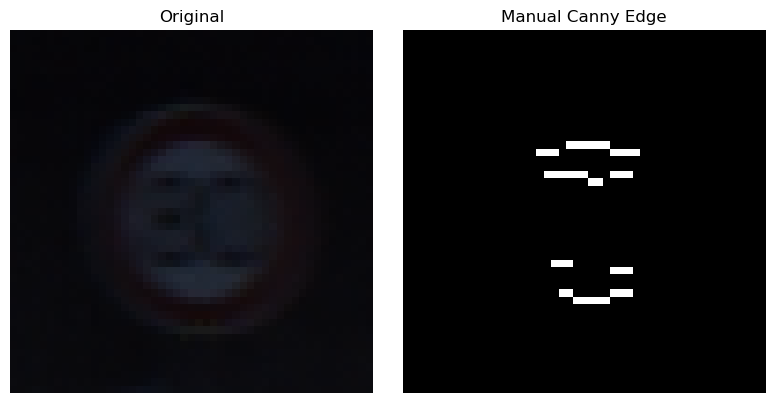

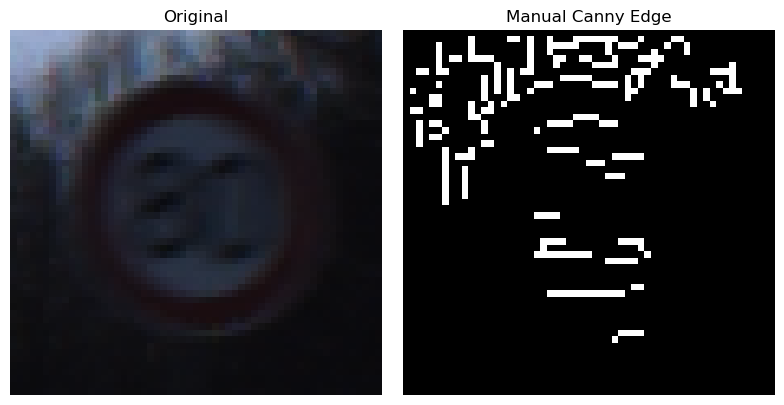

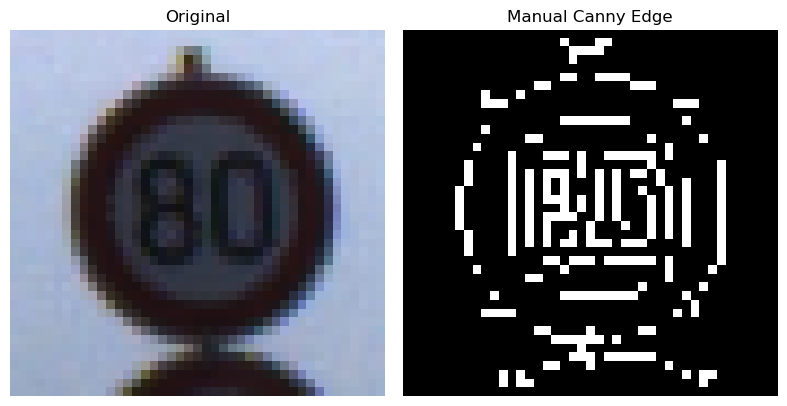

Class: 12


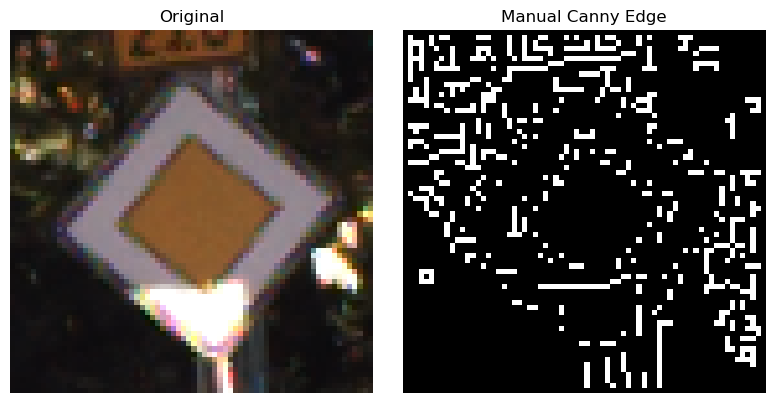

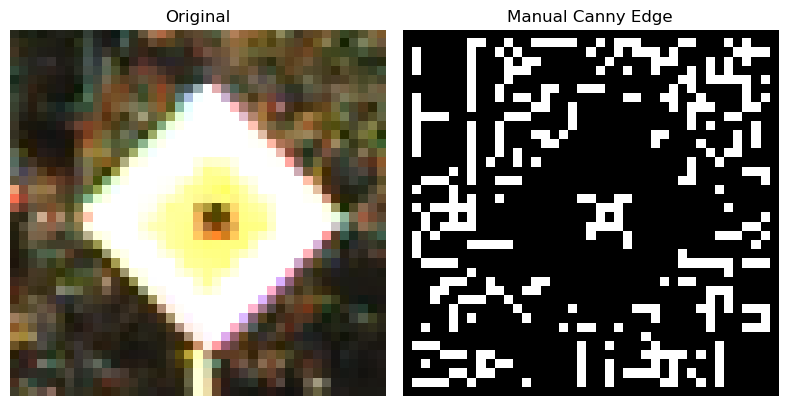

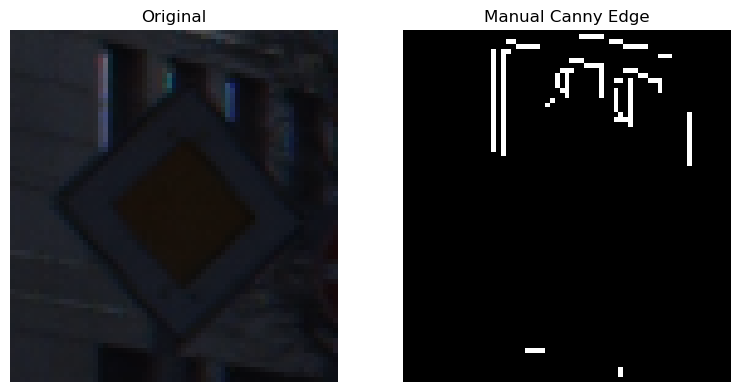

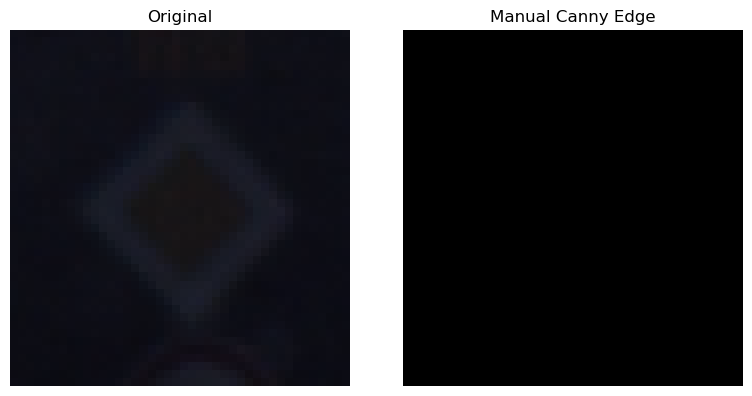

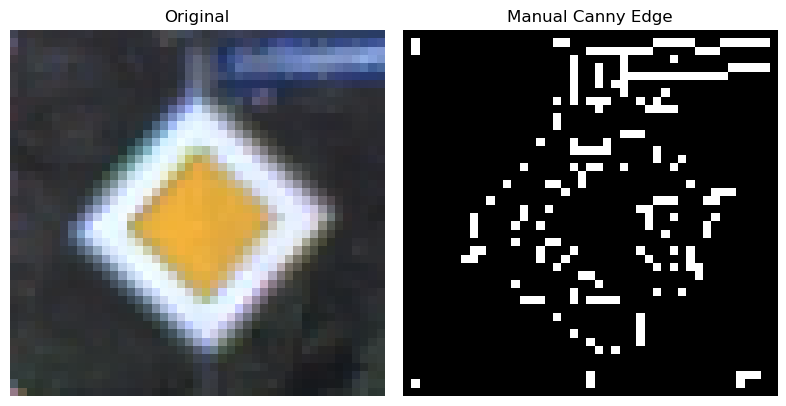

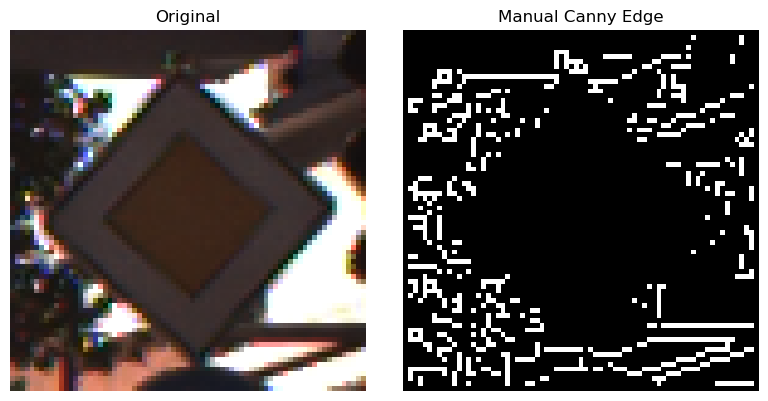

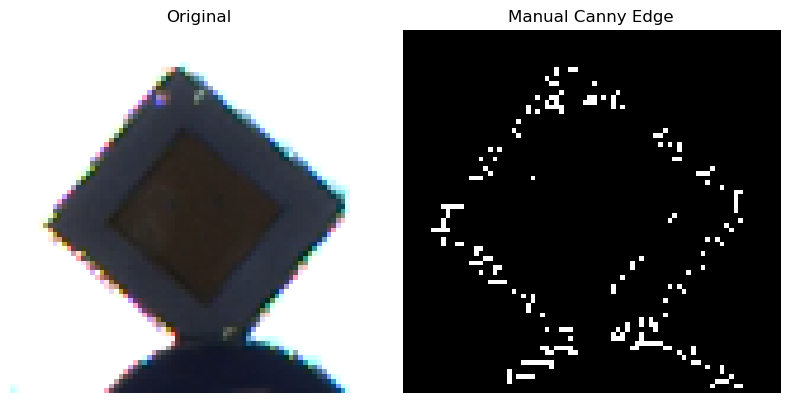

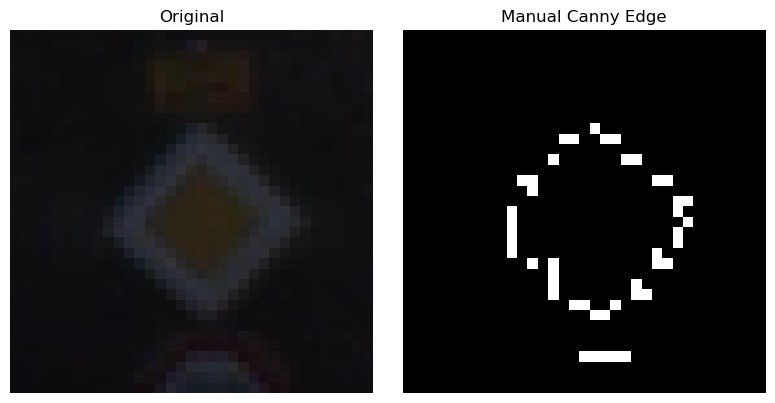

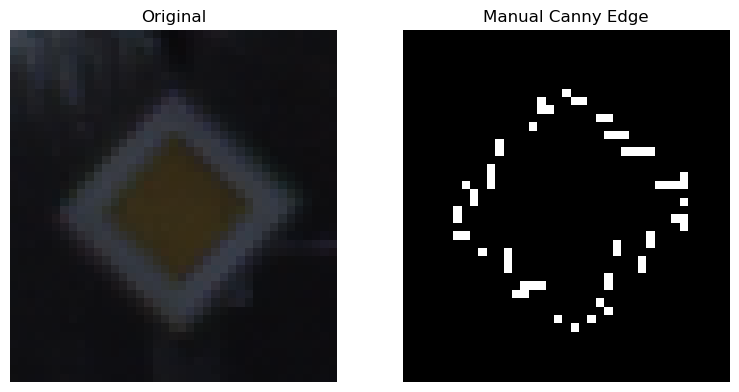

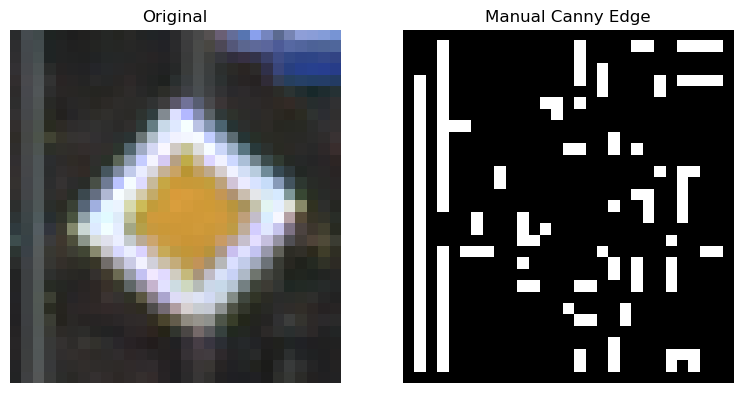

Class: 26


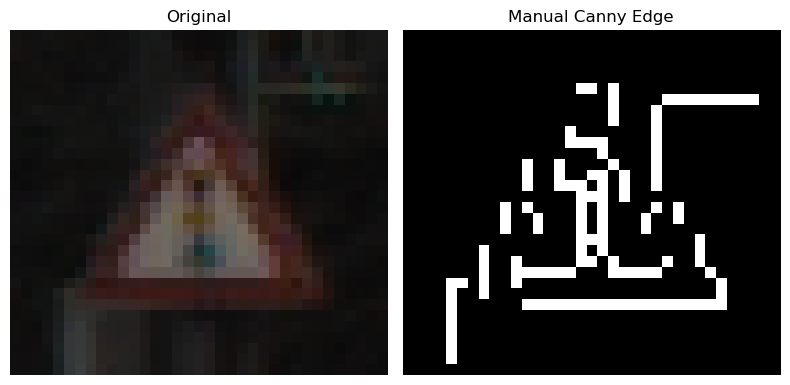

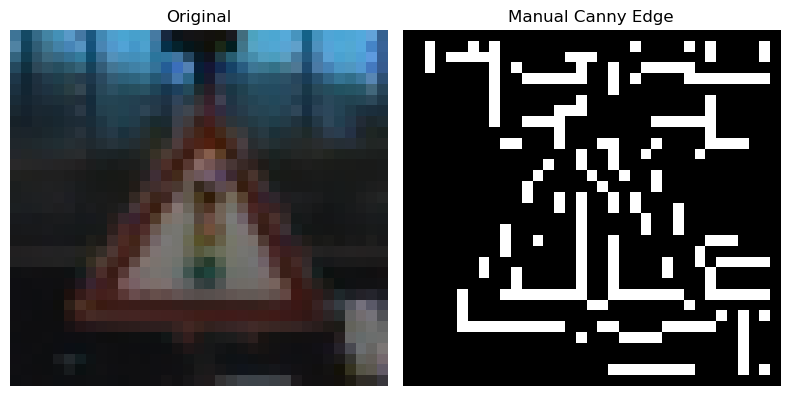

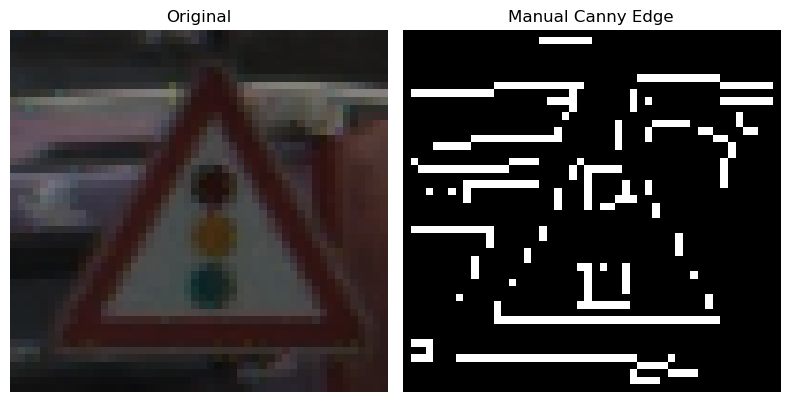

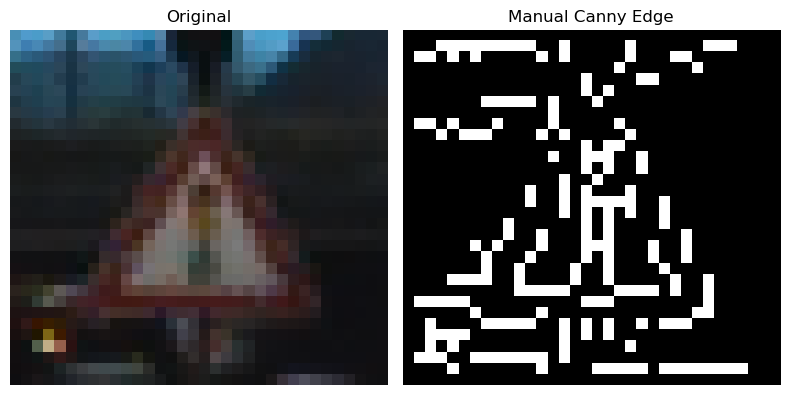

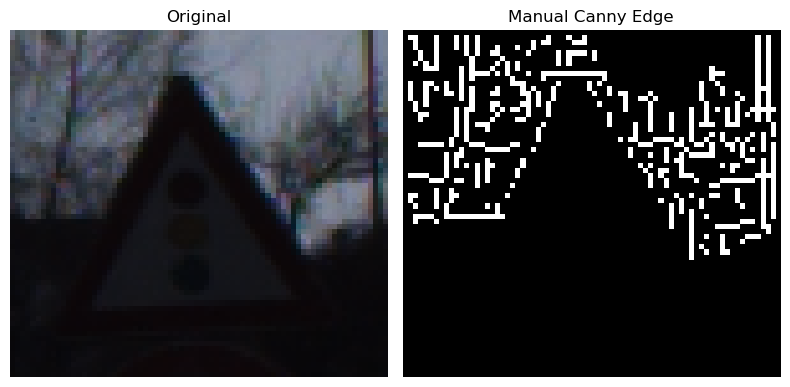

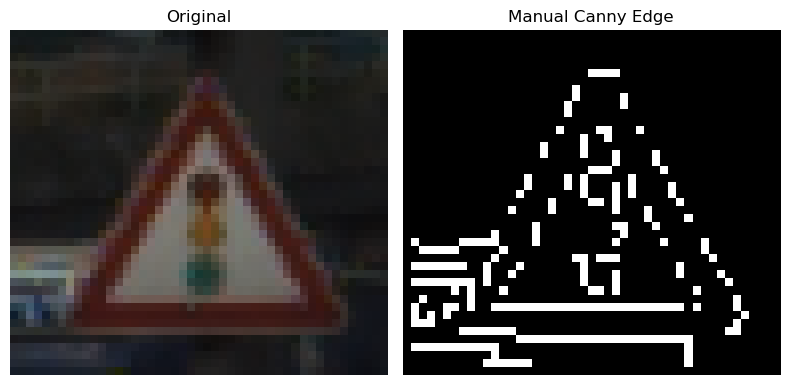

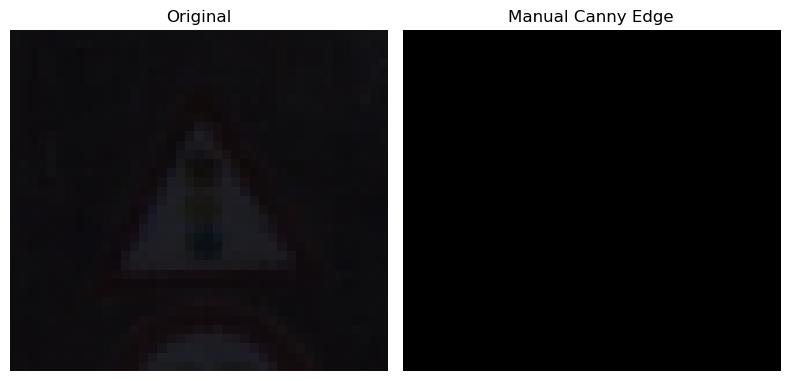

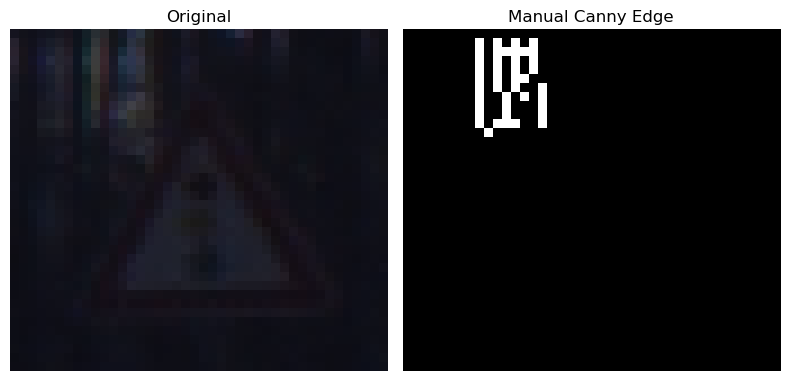

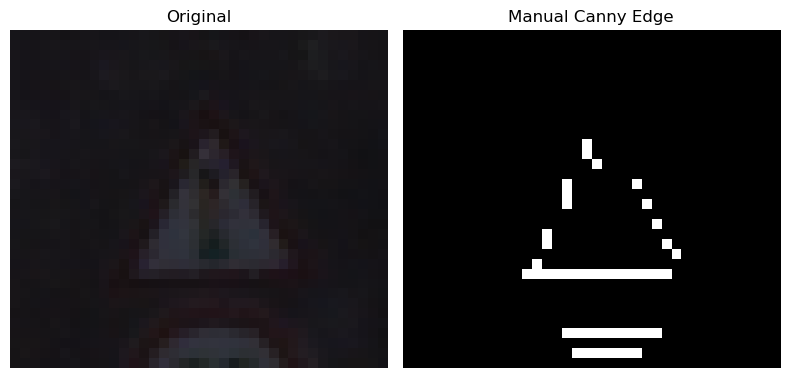

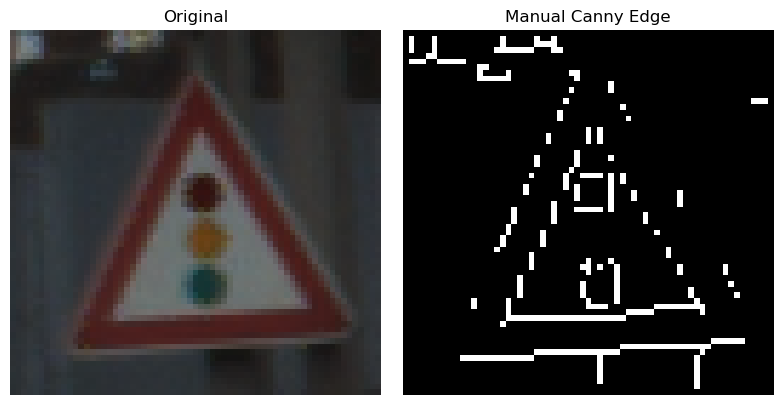

Class: 18


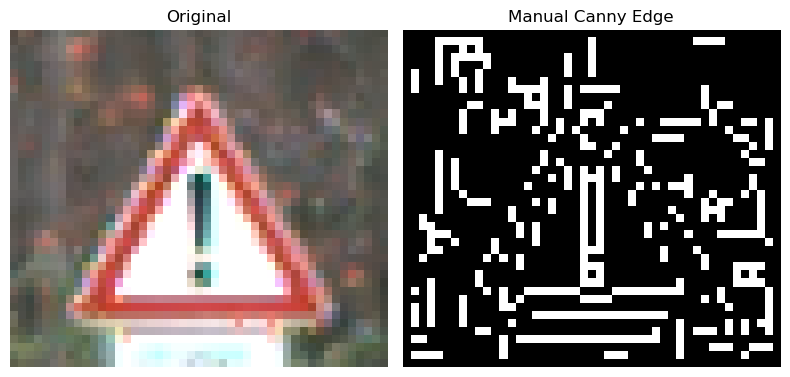

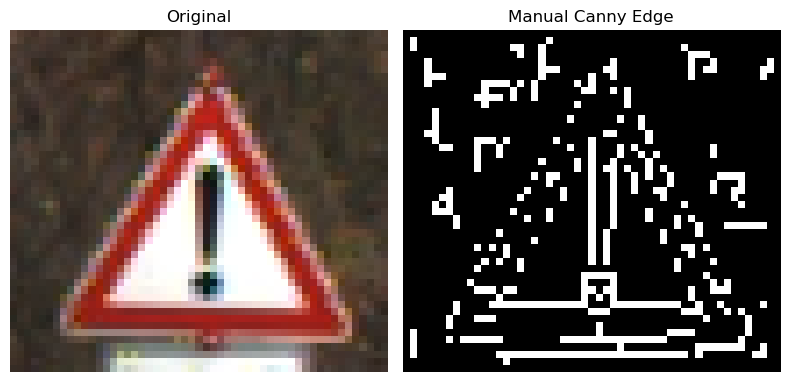

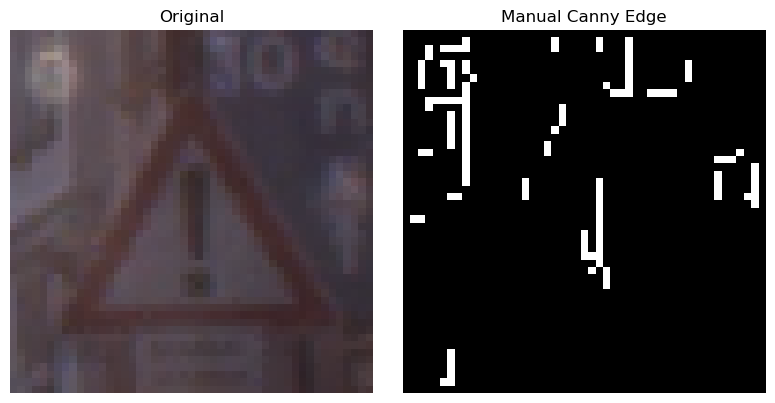

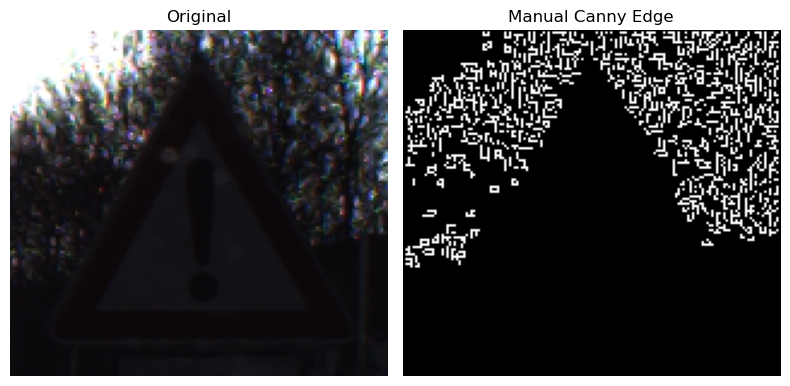

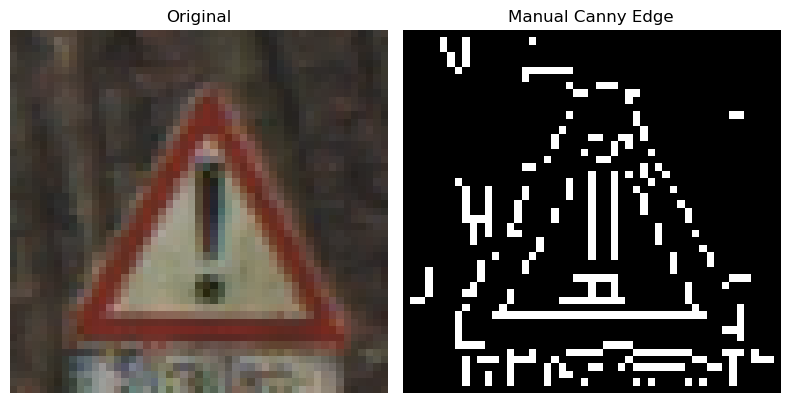

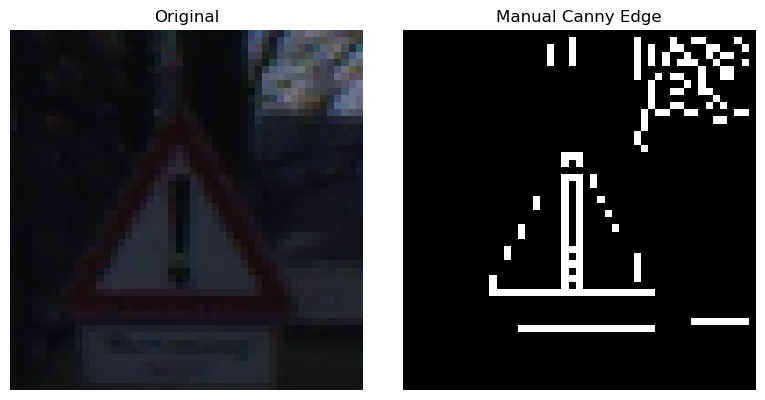

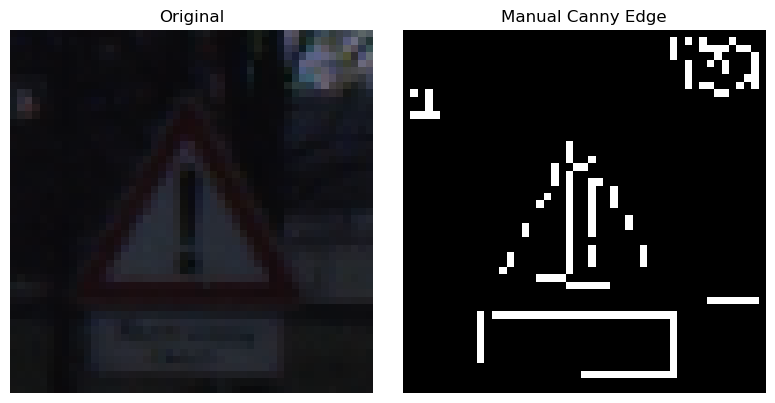

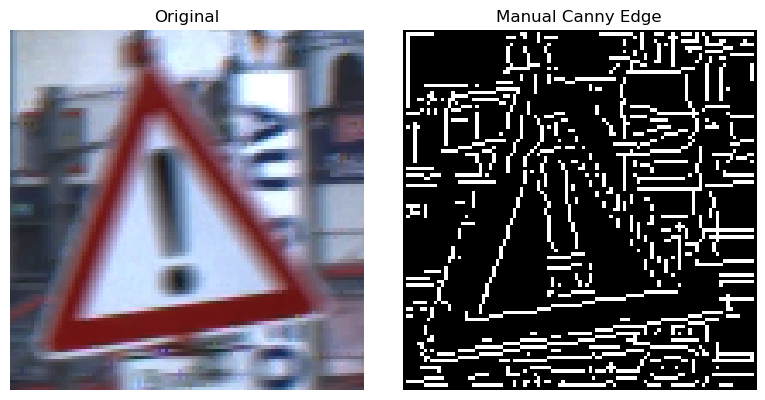

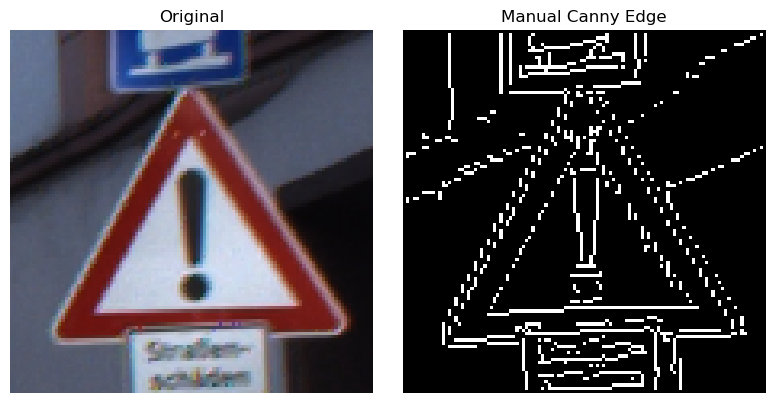

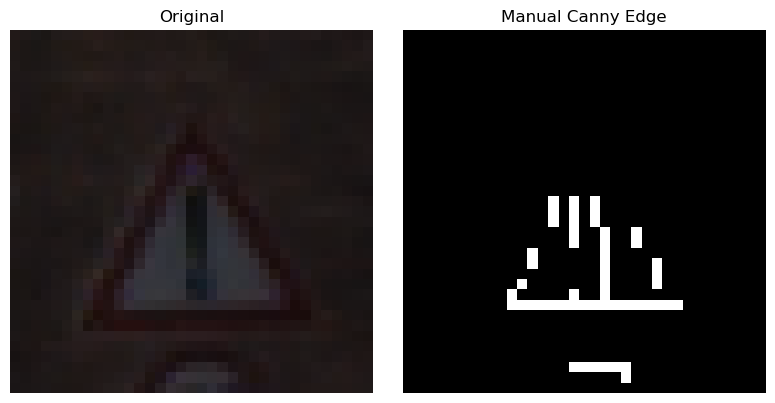

Class: 20


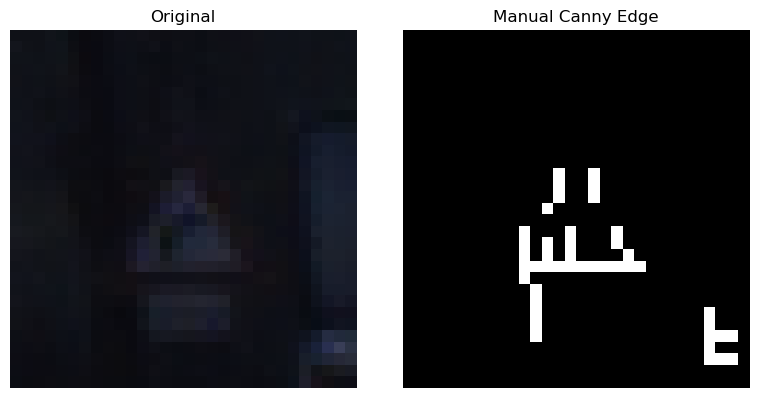

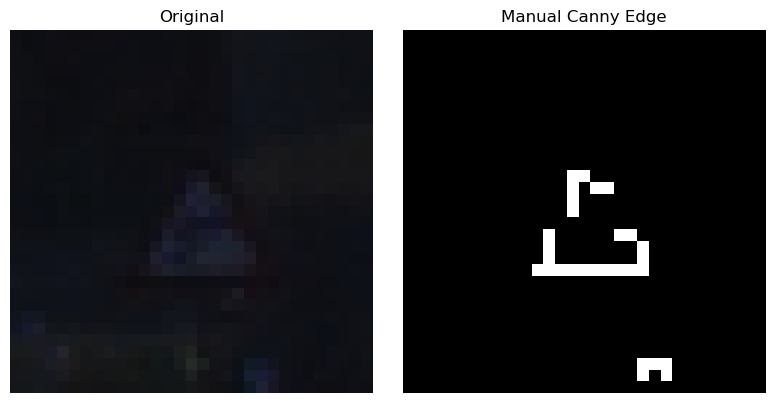

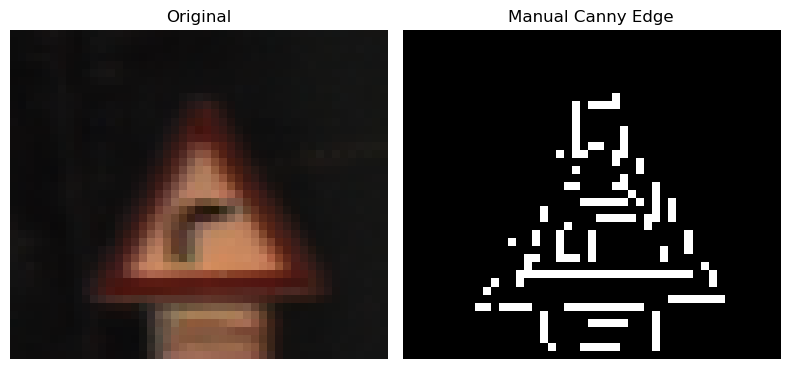

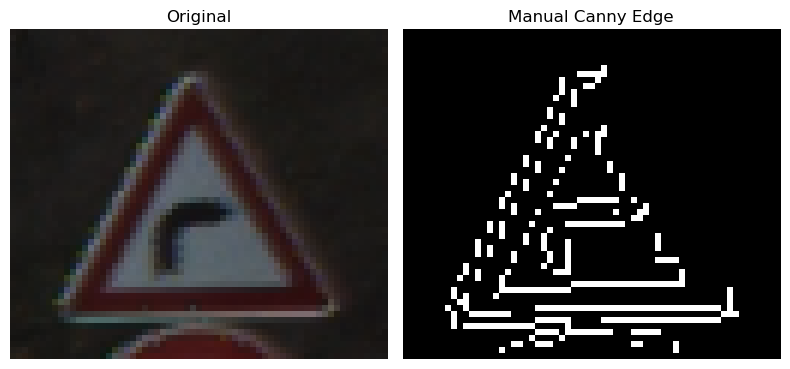

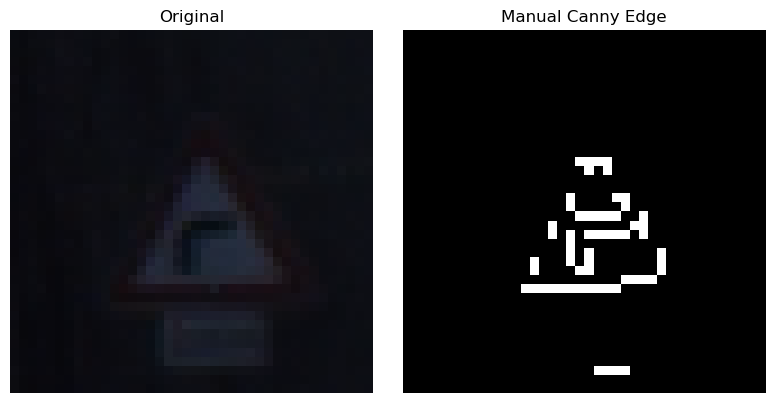

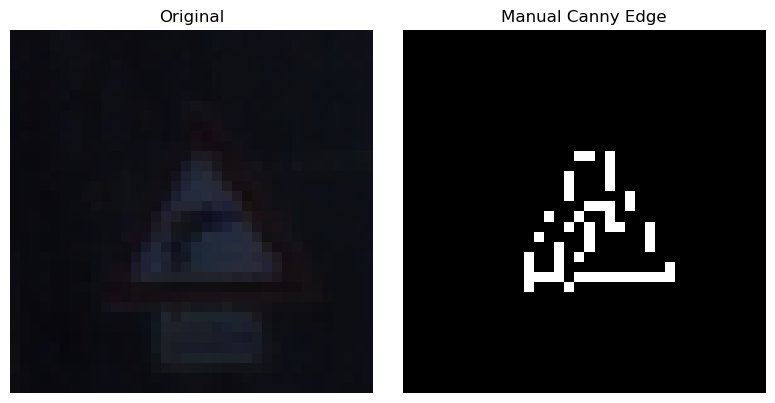

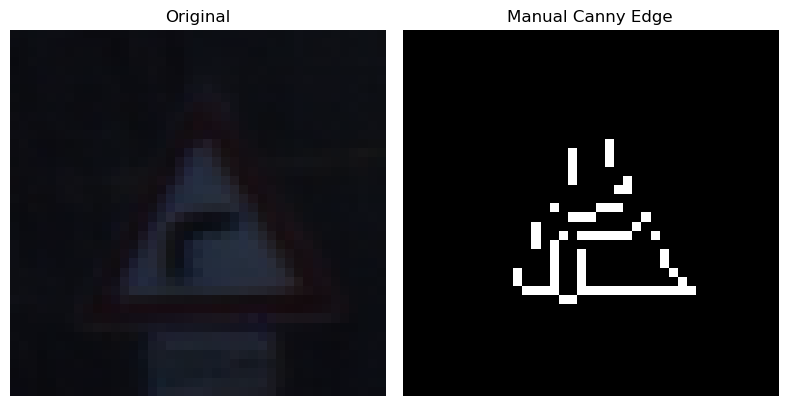

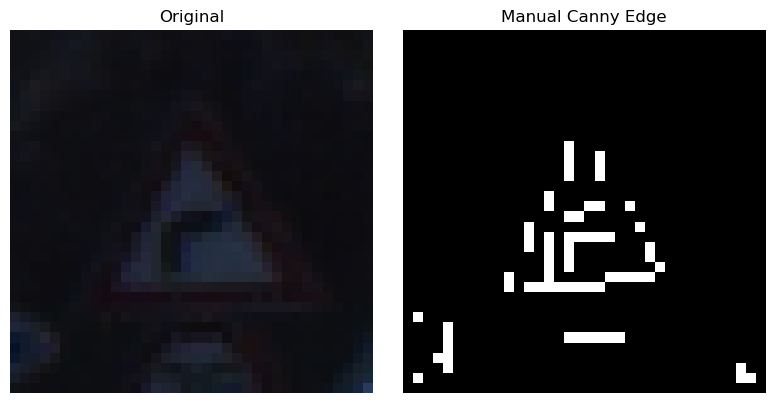

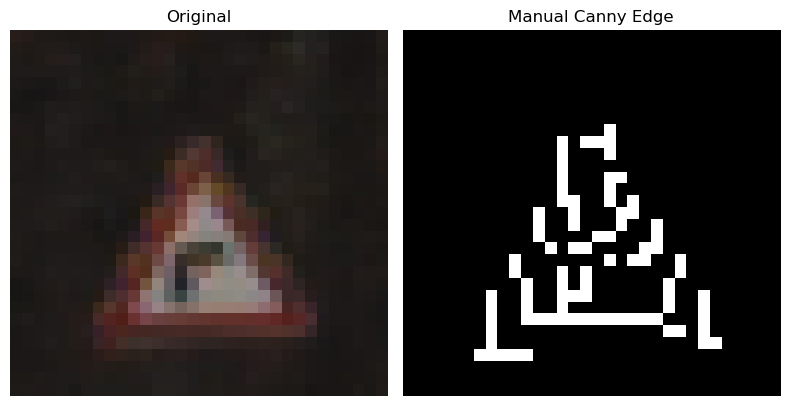

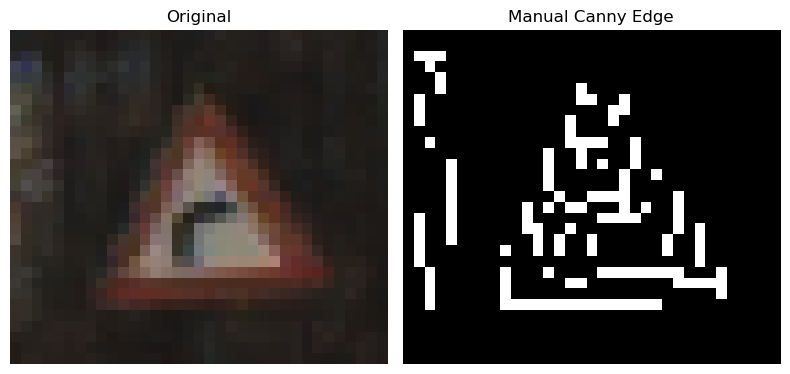

Class: 36


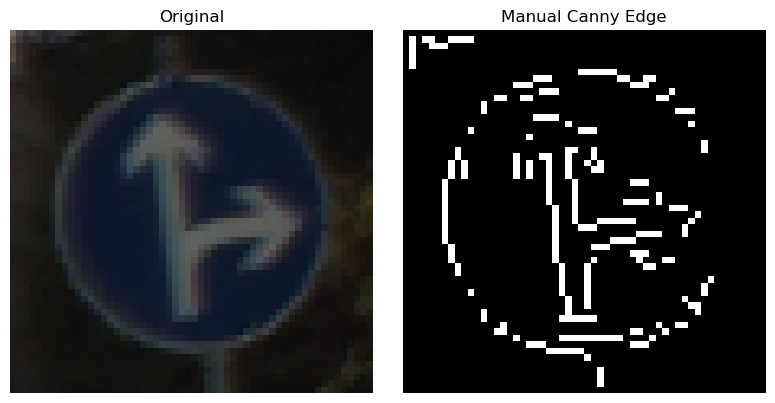

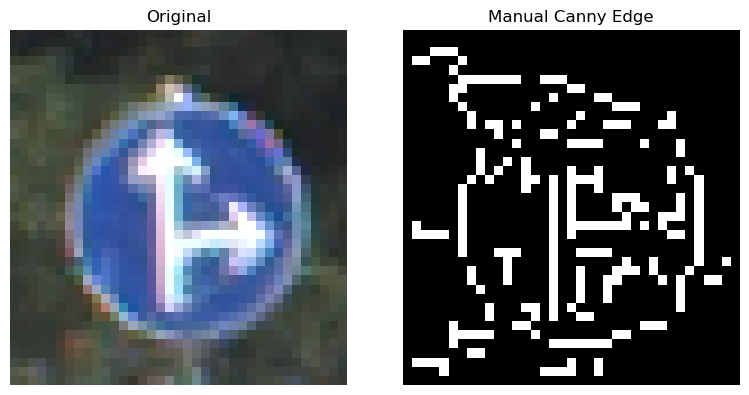

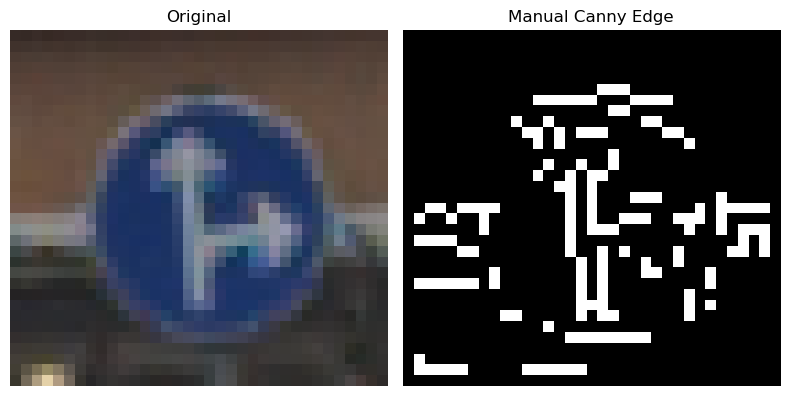

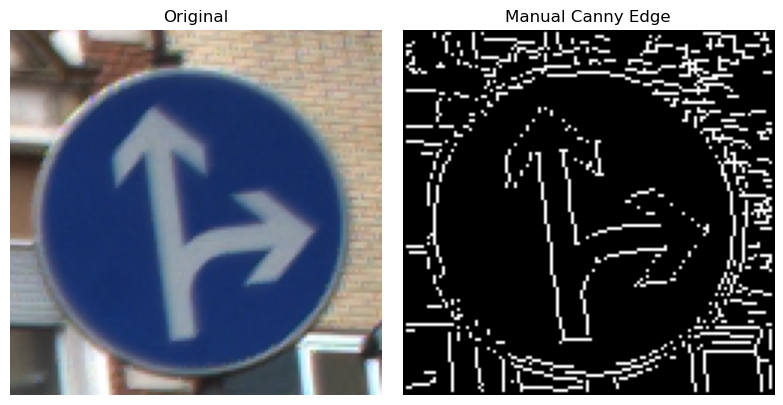

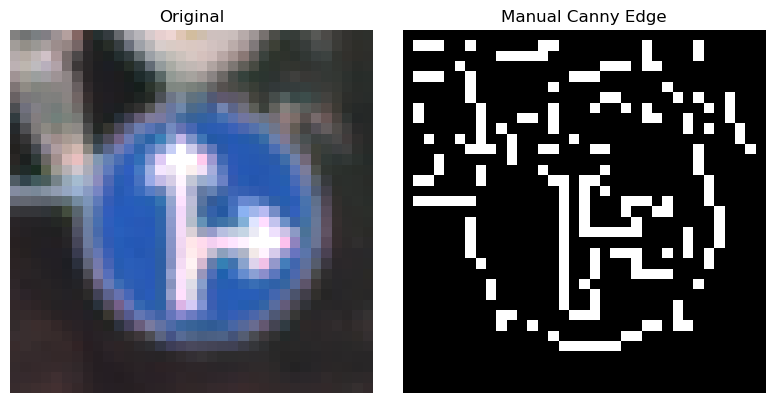

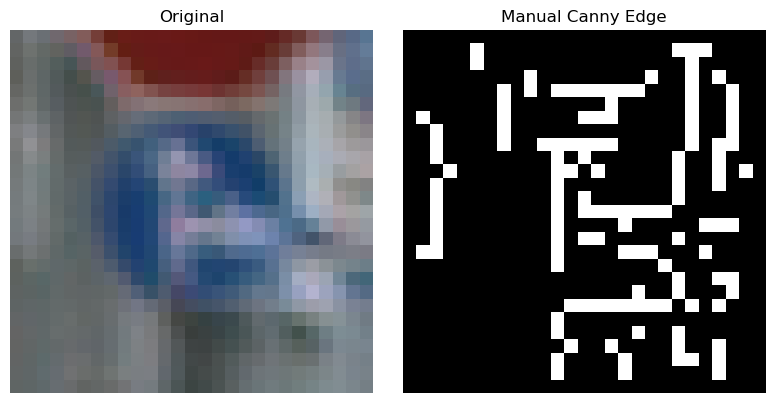

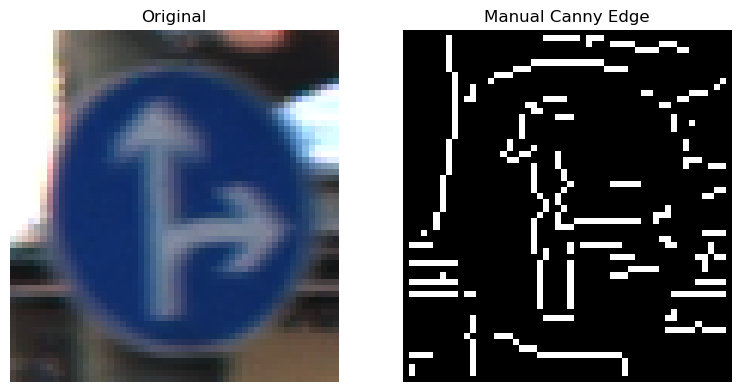

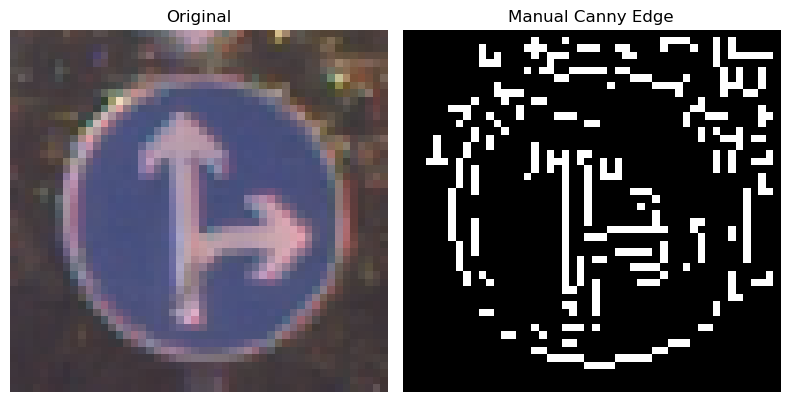

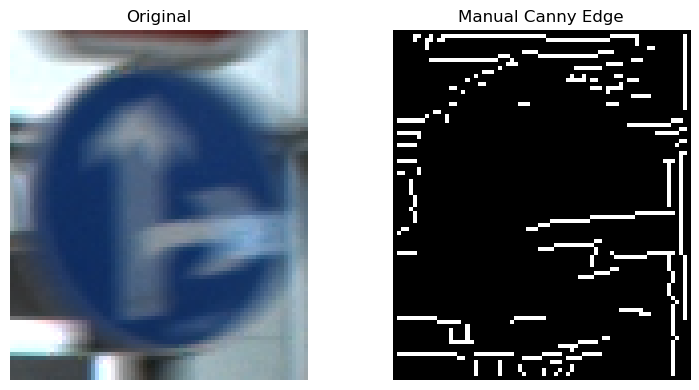

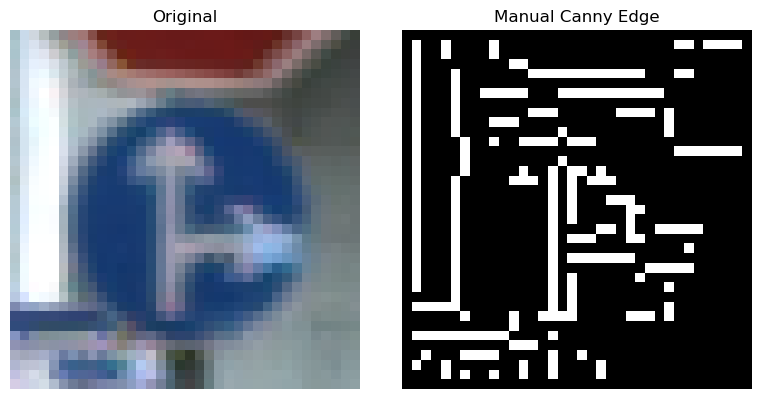

Class: 9


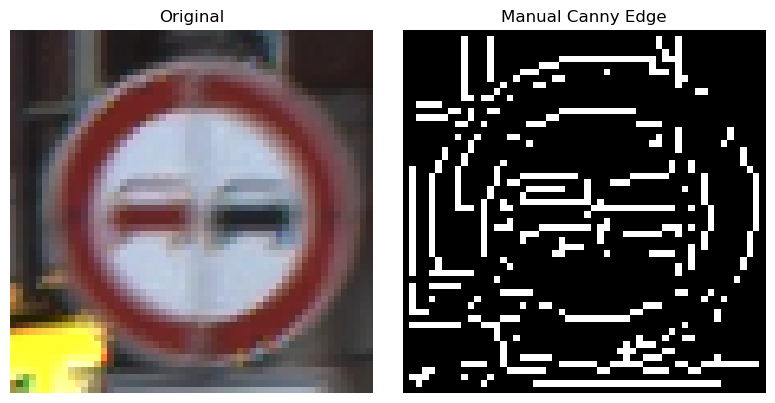

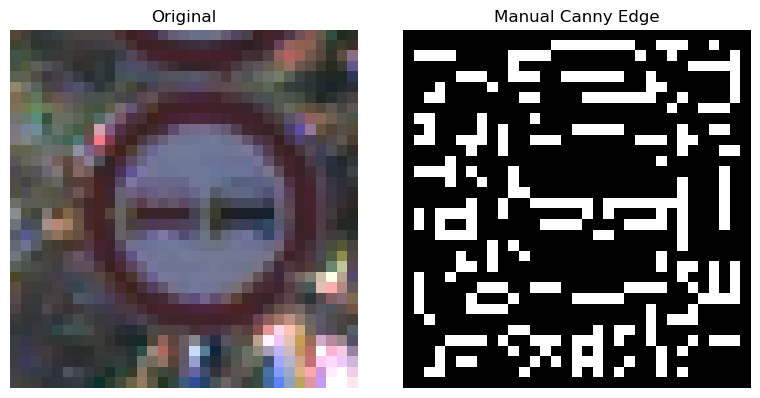

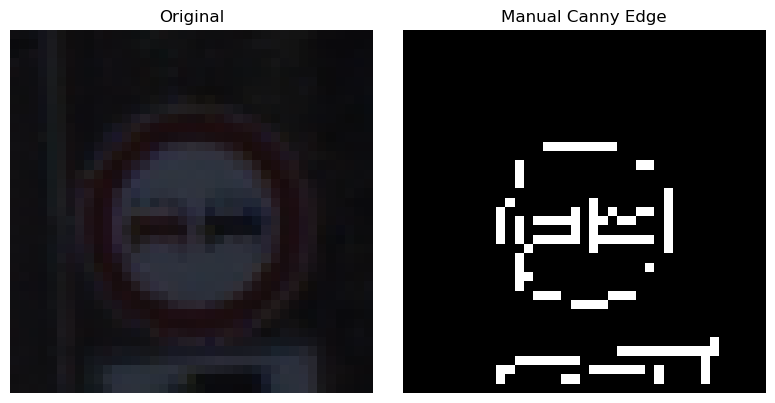

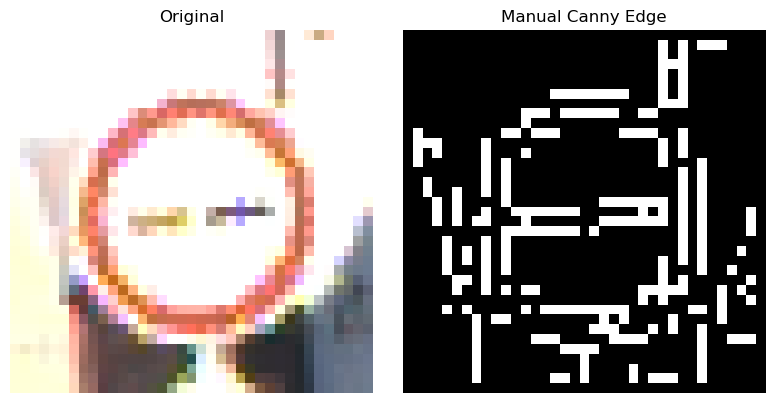

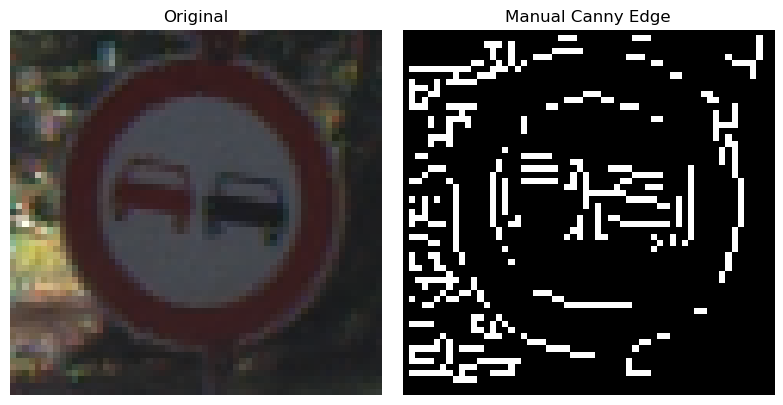

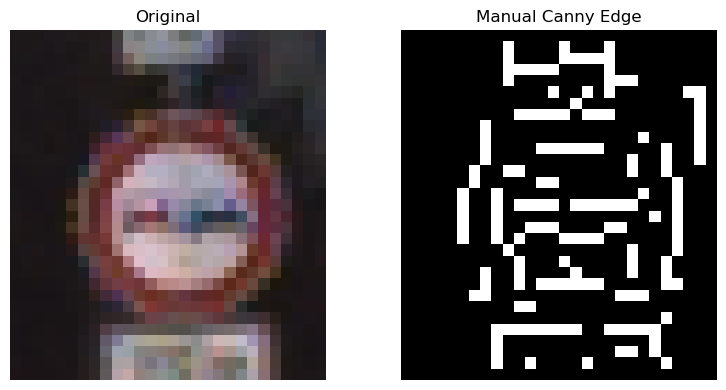

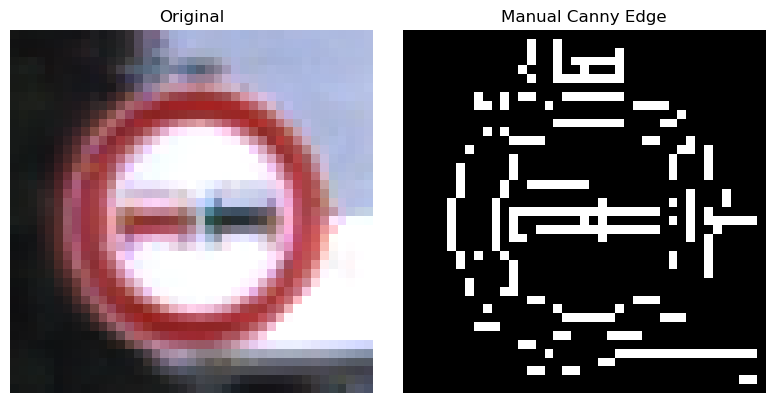

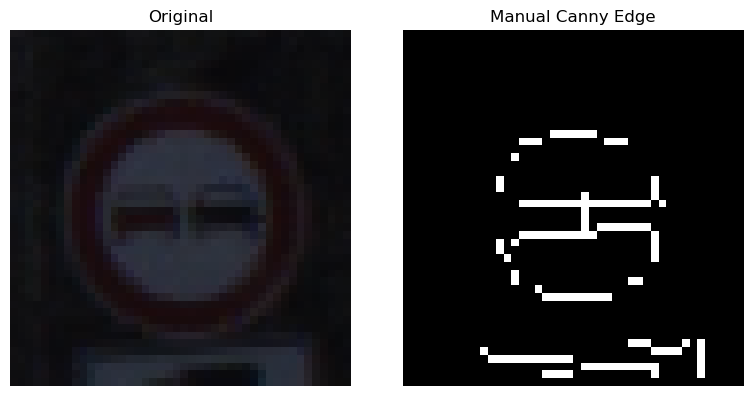

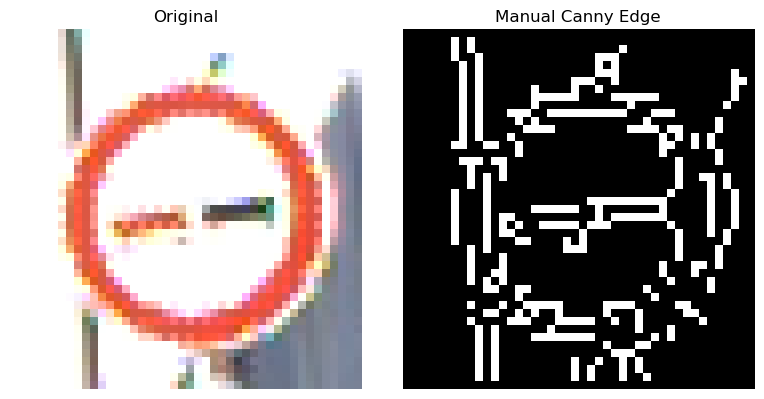

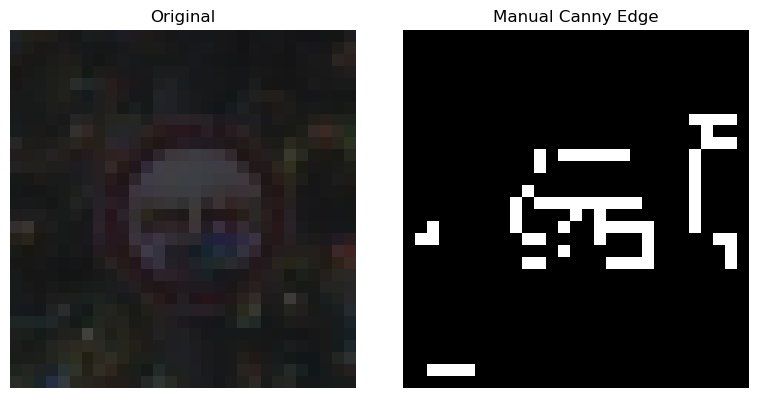

In [28]:
for class_name in cannyEdgesByClass:
    print(f"Class: {class_name}")
    original_images = imagesByClass[class_name]
    edge_images = cannyEdgesByClass[class_name]

    for i in range(10):
        plt.figure(figsize=(8, 4))

        plt.subplot(1, 2, 1)
        plt.imshow(original_images[i])
        plt.title("Original")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(edge_images[i], cmap='gray')
        plt.title("Manual Canny Edge")
        plt.axis("off")

        plt.tight_layout()
        plt.show()


In [29]:
def affine_rotate_scale(img, angle_deg, output_size=(200, 200)):
    angle_rad = np.deg2rad(angle_deg)
    cos_a, sin_a = np.cos(angle_rad), np.sin(angle_rad)

    H, W = img.shape[:2]
    cx, cy = W // 2, H // 2

    T1 = np.array([[1, 0, -cx],
                   [0, 1, -cy],
                   [0, 0, 1]])

    R = np.array([[cos_a, -sin_a, 0],
                  [sin_a, cos_a, 0],
                  [0, 0, 1]])

    T2 = np.array([[1, 0, output_size[0] // 2],
                   [0, 1, output_size[1] // 2],
                   [0, 0, 1]])

    A = T2 @ R @ T1

    return apply_affine(img, A, output_size)


In [30]:
def apply_affine(img, matrix, output_size):
    out_h, out_w = output_size
    inv_matrix = np.linalg.inv(matrix)

    result = np.zeros((out_h, out_w, img.shape[2]), dtype=img.dtype)

    for y in range(out_h):
        for x in range(out_w):
            src_pt = inv_matrix @ [x, y, 1]
            sx, sy = int(src_pt[0]), int(src_pt[1])
            if 0 <= sx < img.shape[1] and 0 <= sy < img.shape[0]:
                result[y, x] = img[sy, sx]
    return result


In [31]:
def estimate_rotation_angle(binary_mask):
    y, x = np.nonzero(binary_mask)
    coords = np.column_stack((x, y))

    mean = np.mean(coords, axis=0)
    centered = coords - mean

    _, _, vt = np.linalg.svd(centered)
    direction = vt[0] 

    angle_rad = np.arctan2(direction[1], direction[0])
    angle_deg = np.degrees(angle_rad)

    return -angle_deg 

def normalize_sign_image(img_rgb, binary_mask):
    angle = estimate_rotation_angle(binary_mask)
    rotated_scaled = affine_rotate_scale(img_rgb, angle_deg=angle, output_size=(200, 200))
    return rotated_scaled, angle


In [32]:
normalizedByClass = {}

for cls, imgs in imagesByClass.items():
    print(cls)
    normalizedImgs = []
    for img in imgs:
        gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
        _, binary_mask = cv.threshold(gray, 100, 255, cv.THRESH_BINARY)

        normalized_img, angle = normalize_sign_image(img, binary_mask)
        normalizedImgs.append((img, normalized_img, angle))  
    normalizedByClass[cls] = normalizedImgs


5


c:\Users\abdul\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\abdul\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


12
26
18
20
36
9


Class: 5


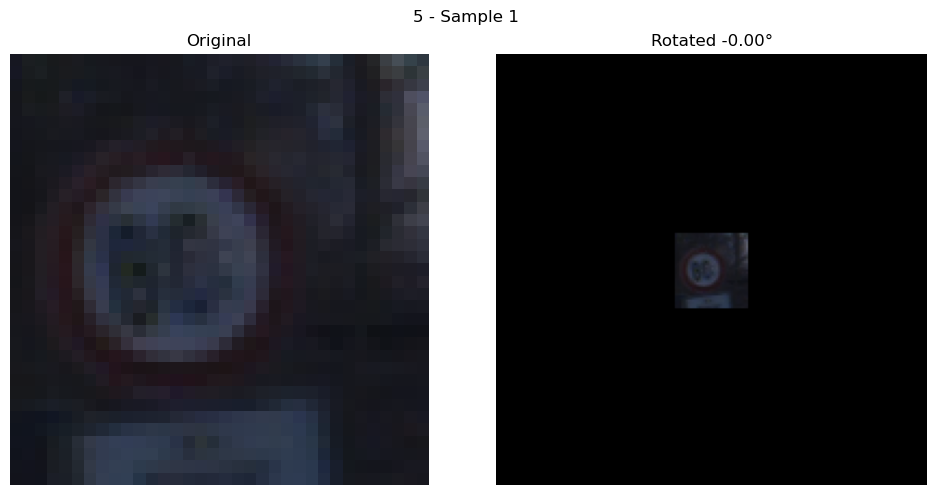

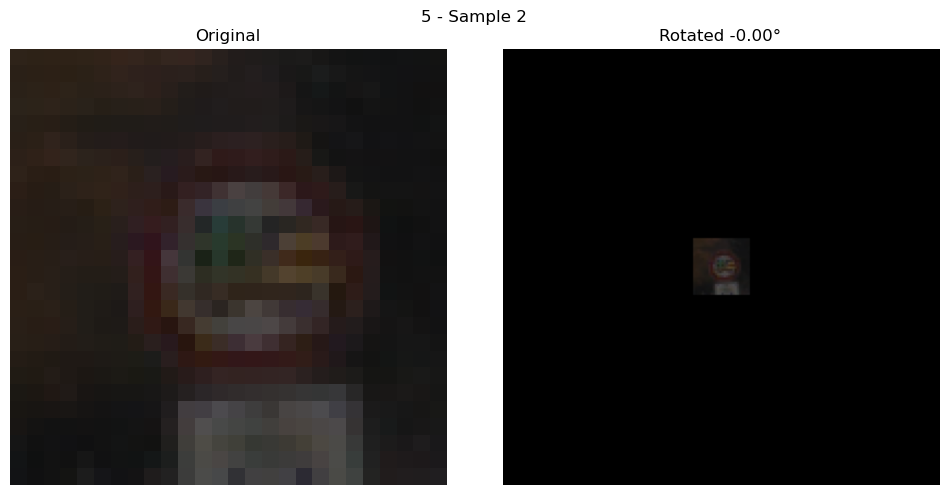

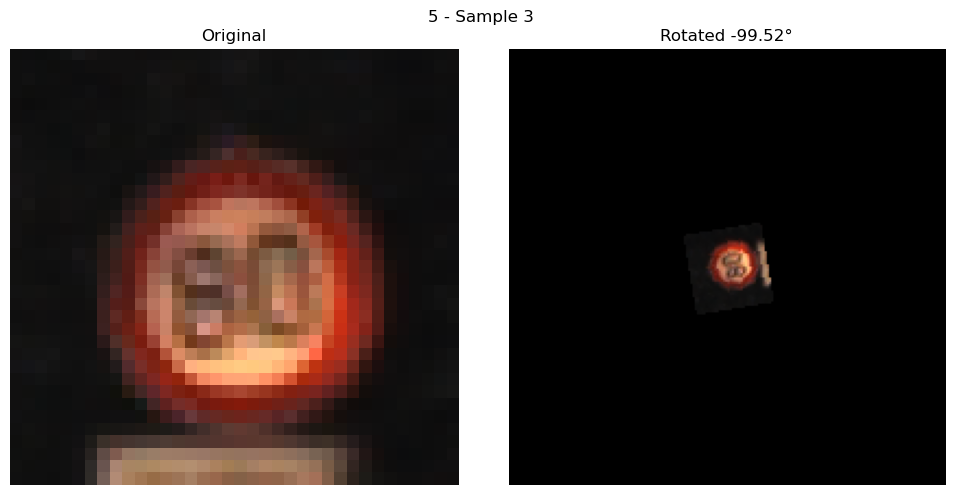

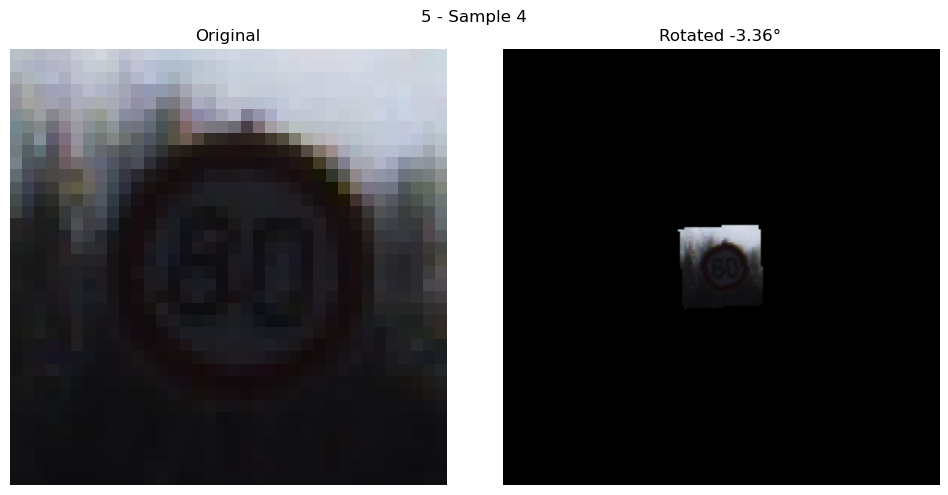

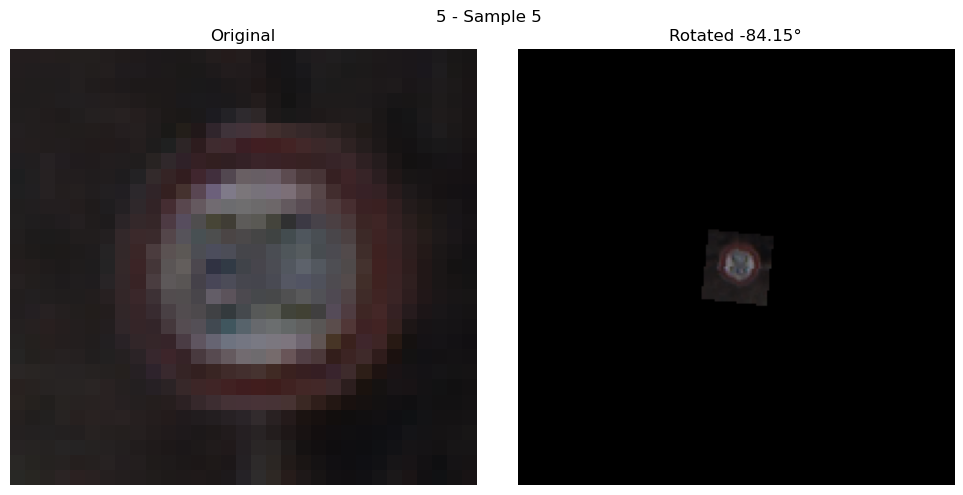

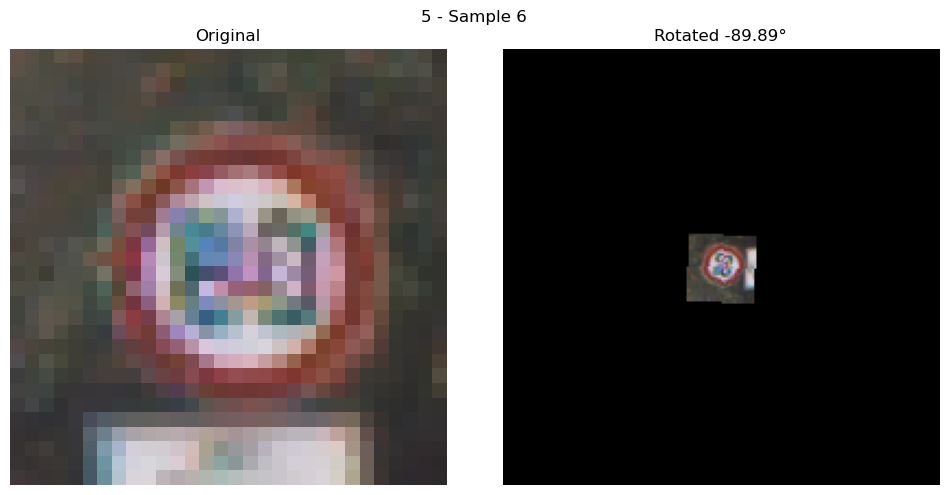

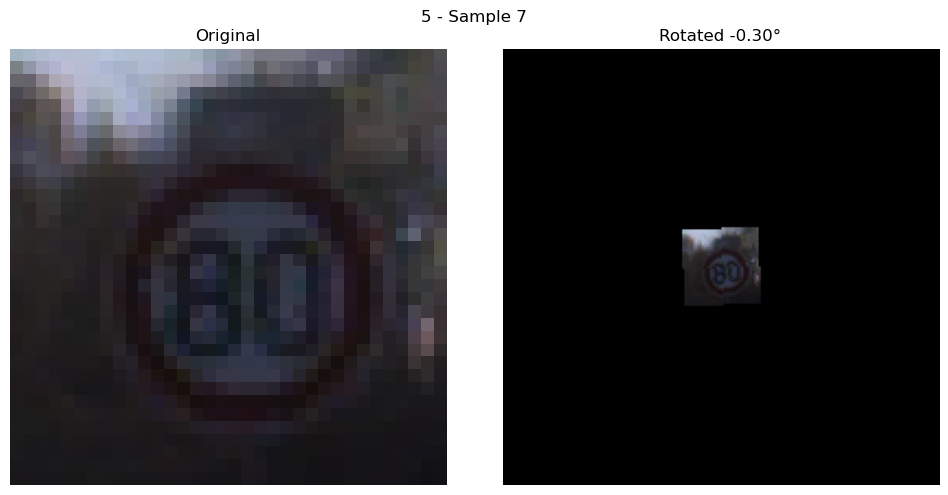

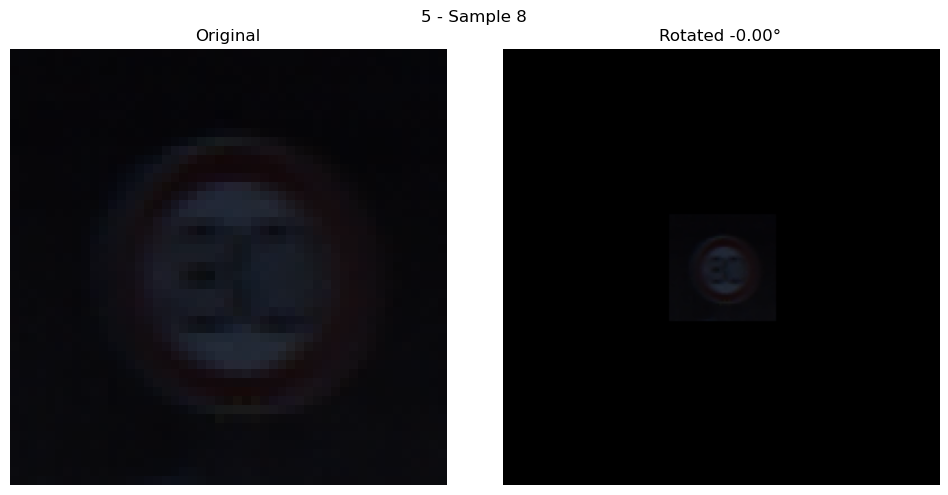

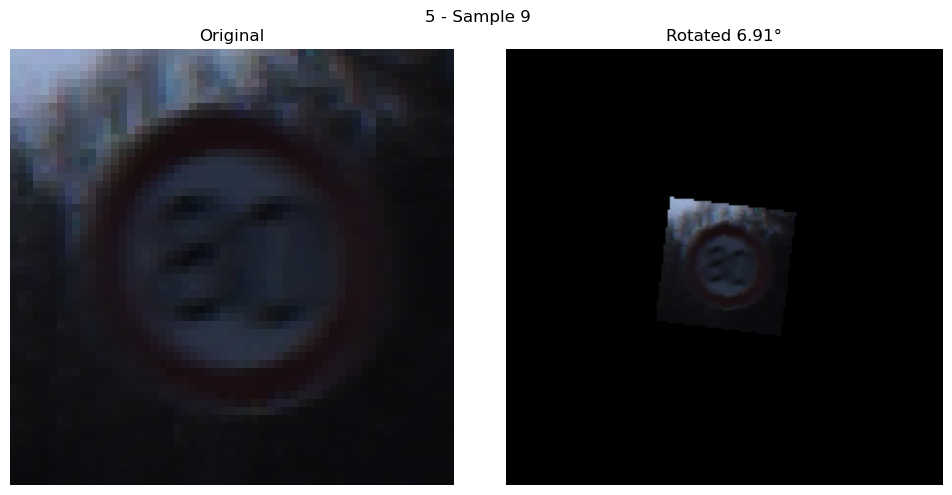

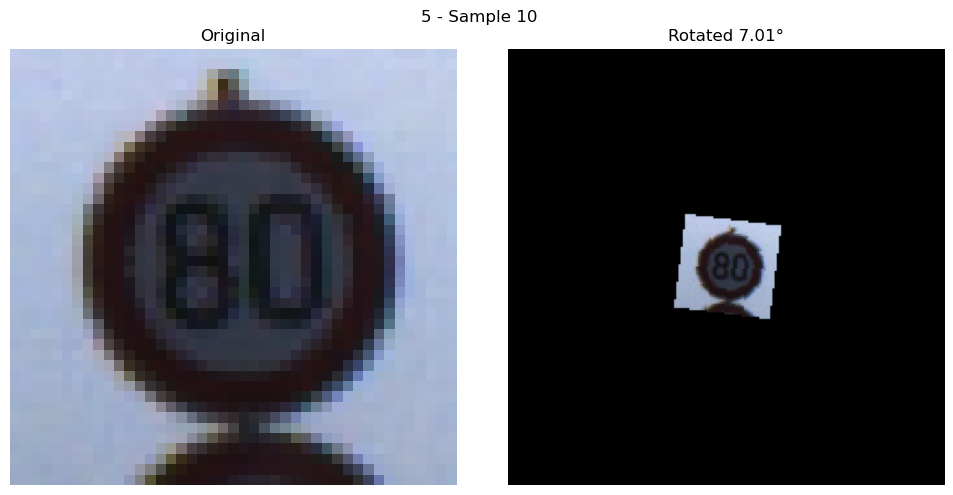

Class: 12


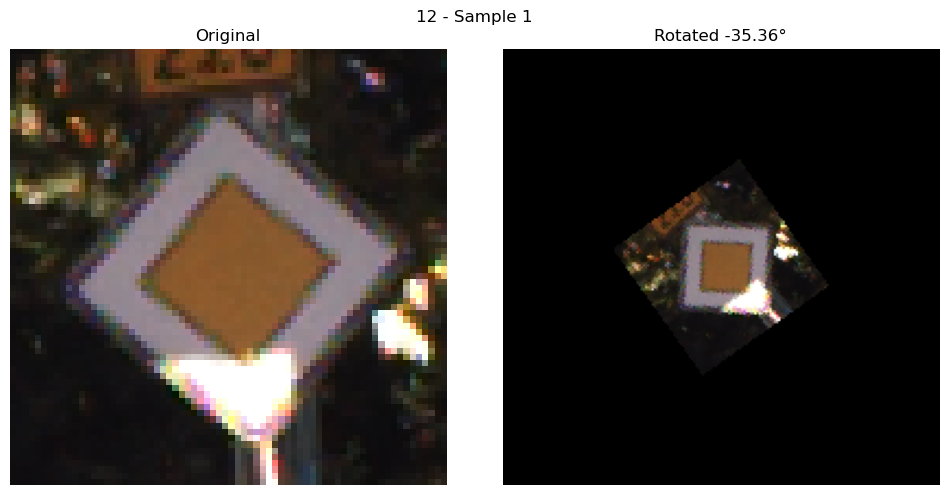

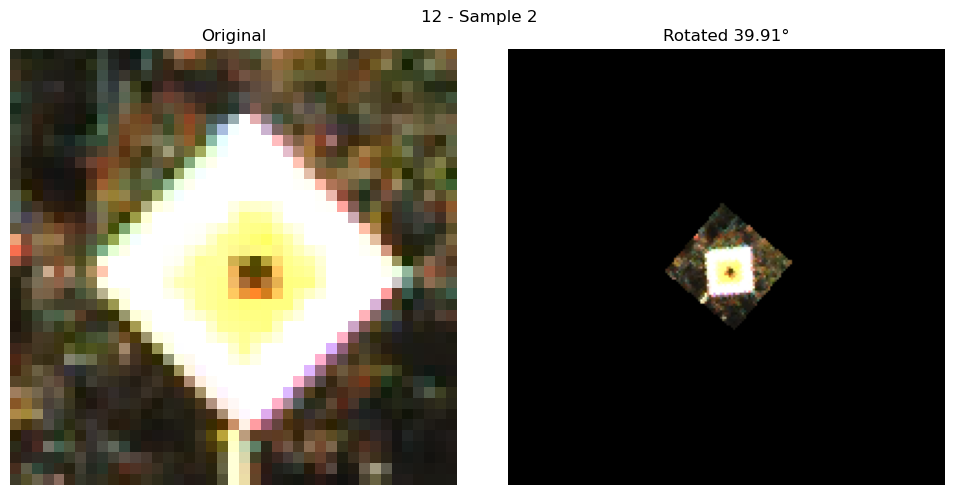

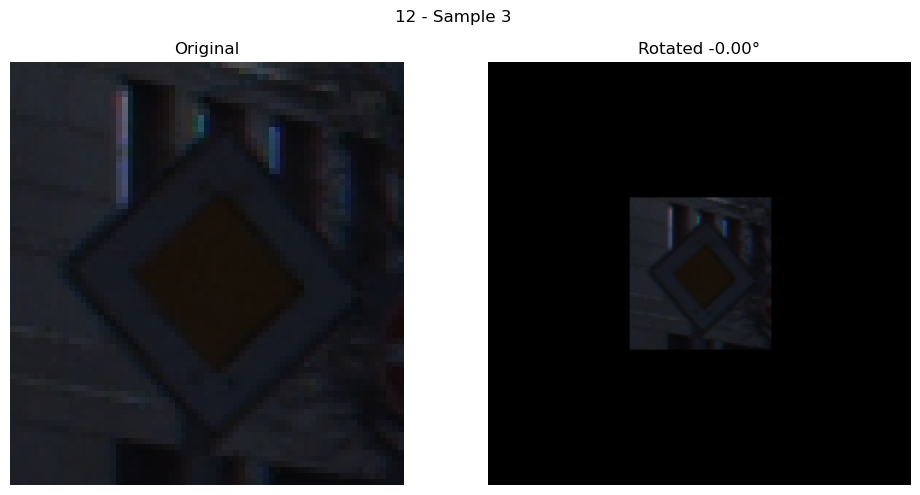

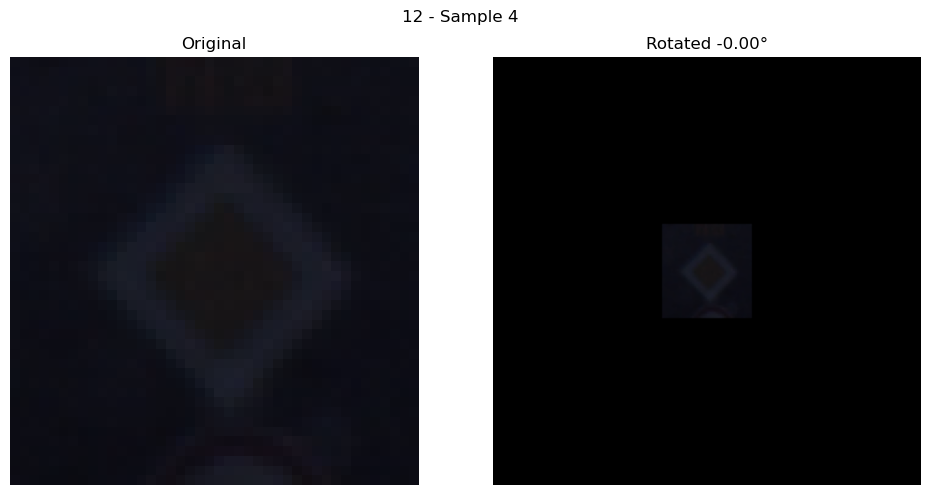

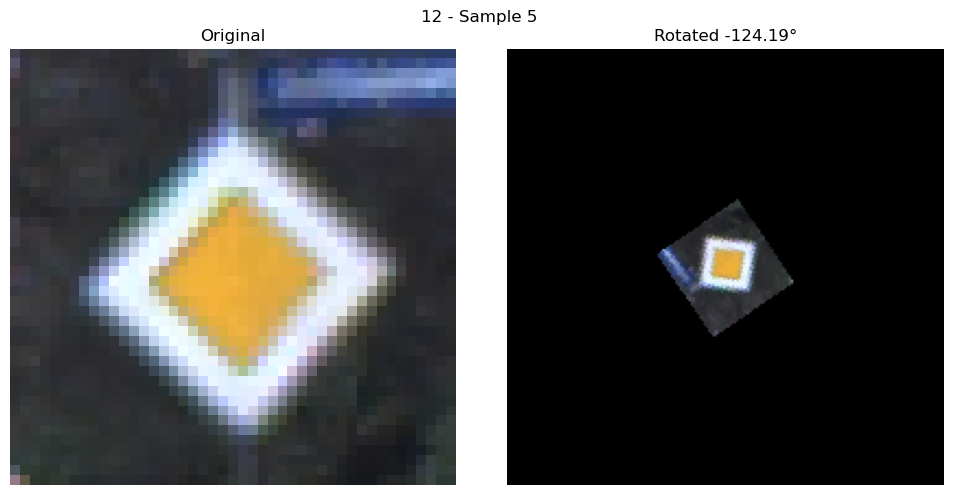

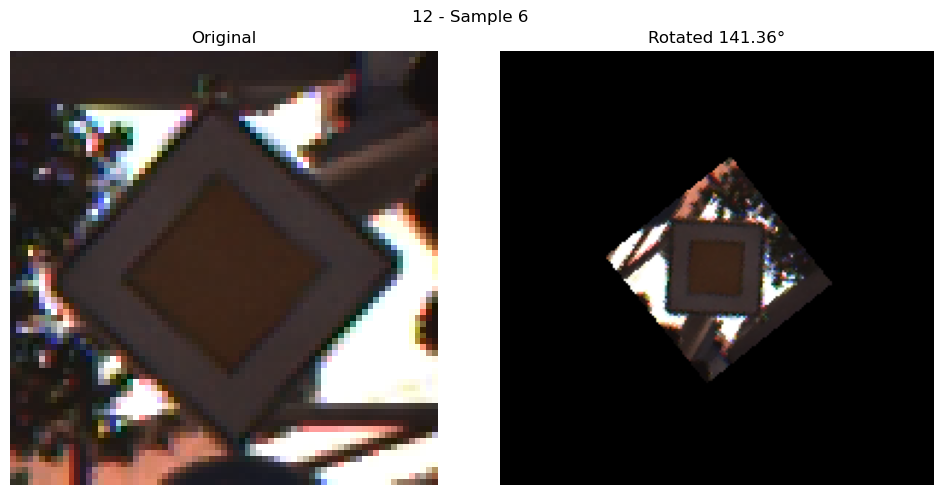

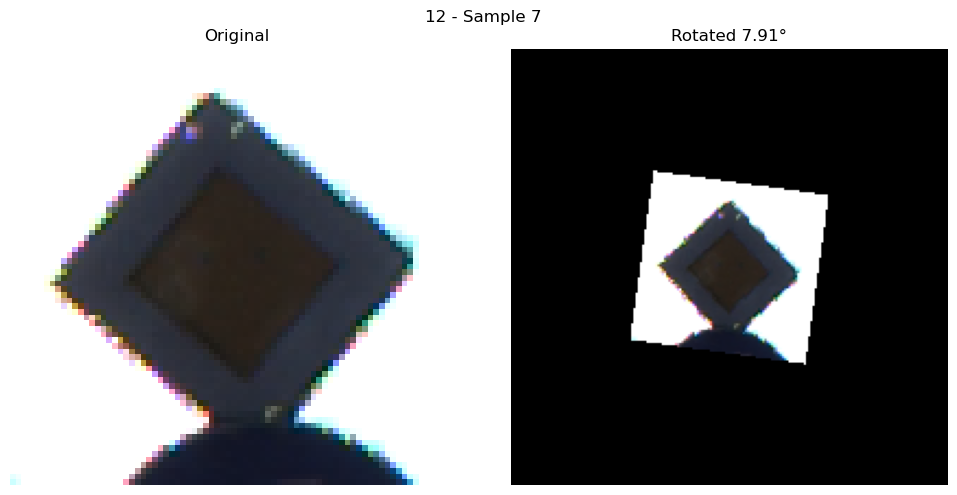

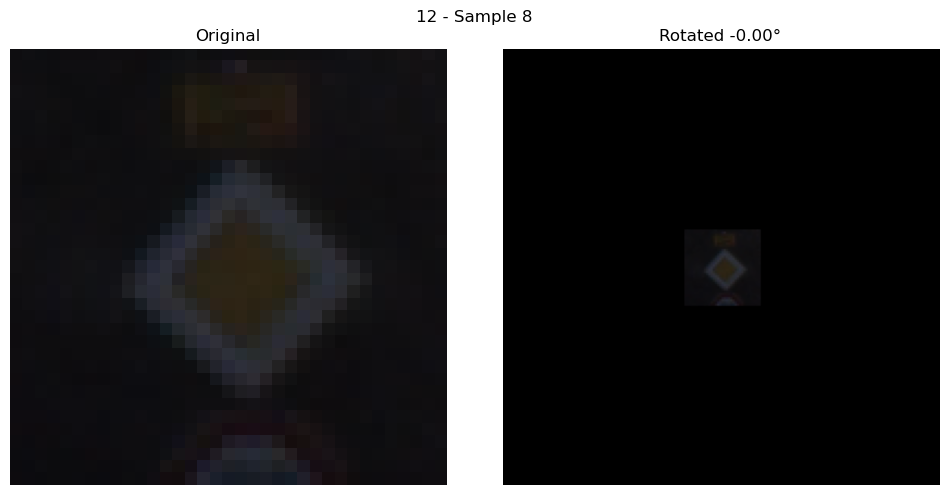

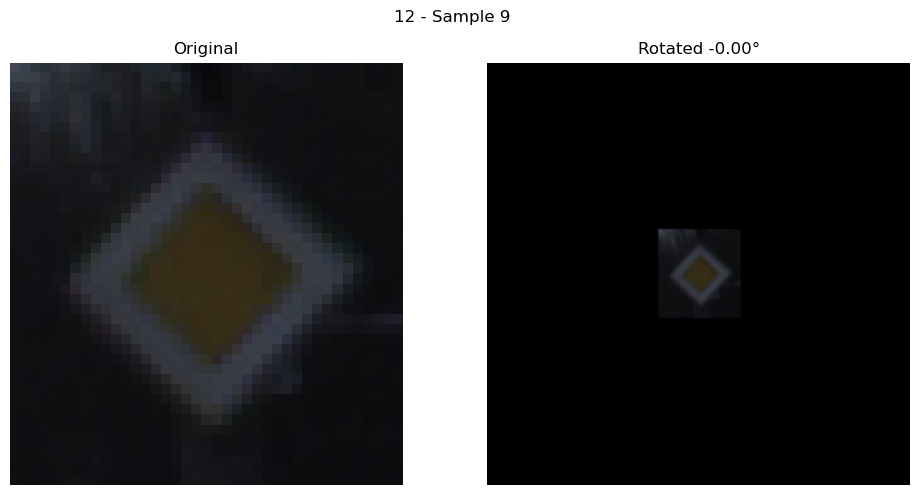

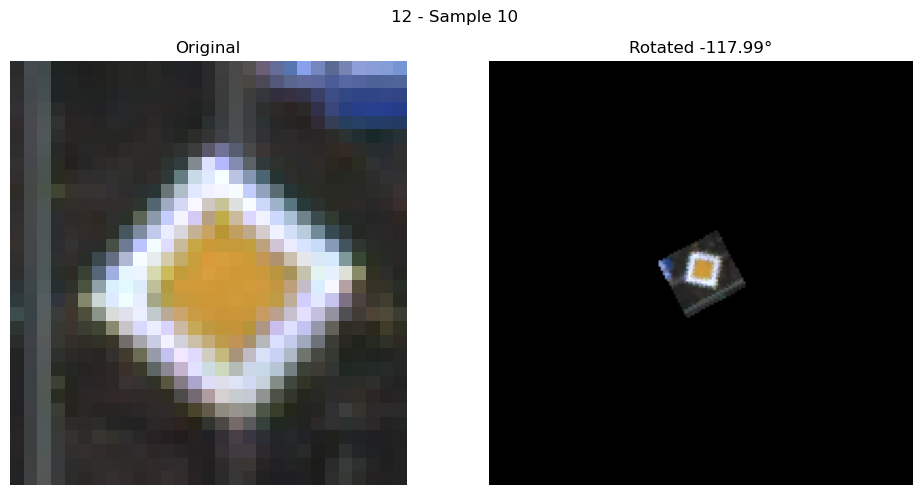

Class: 26


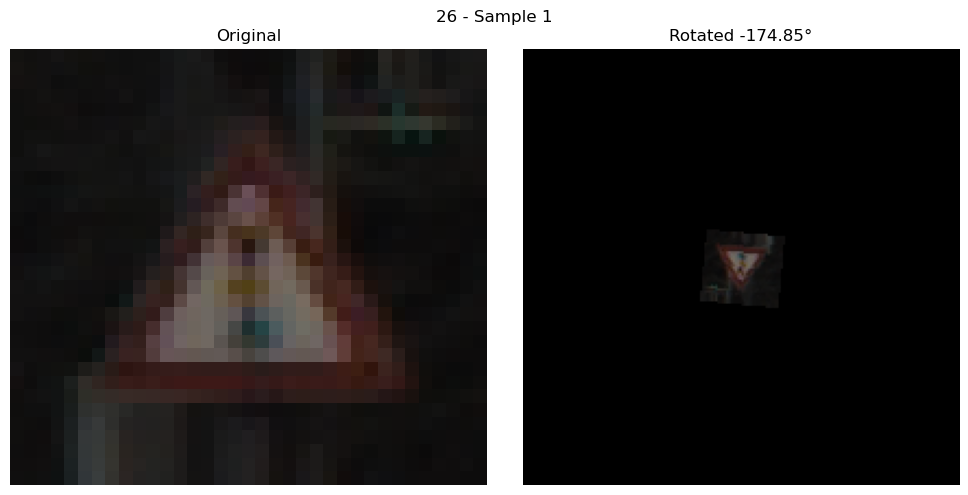

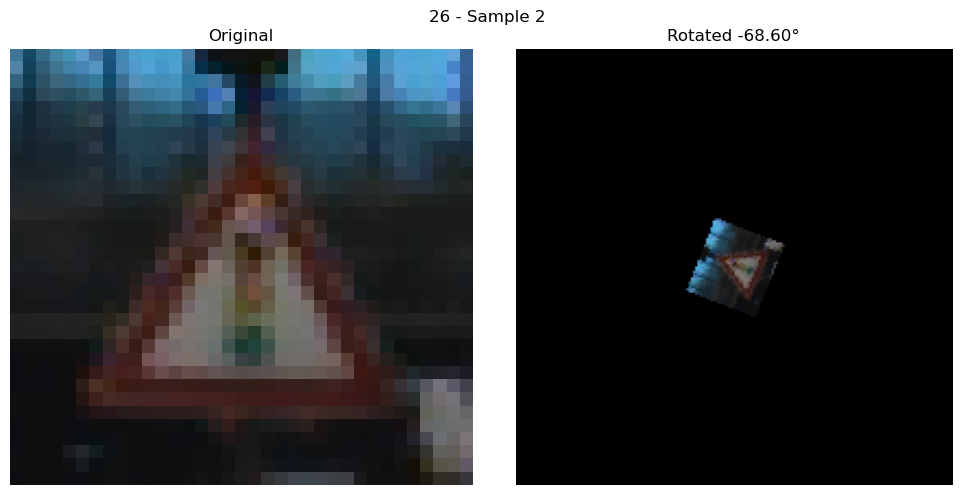

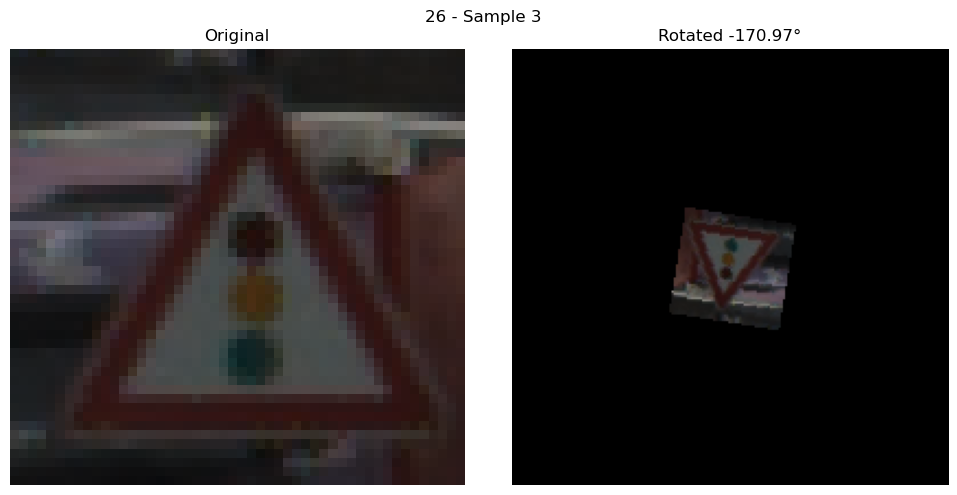

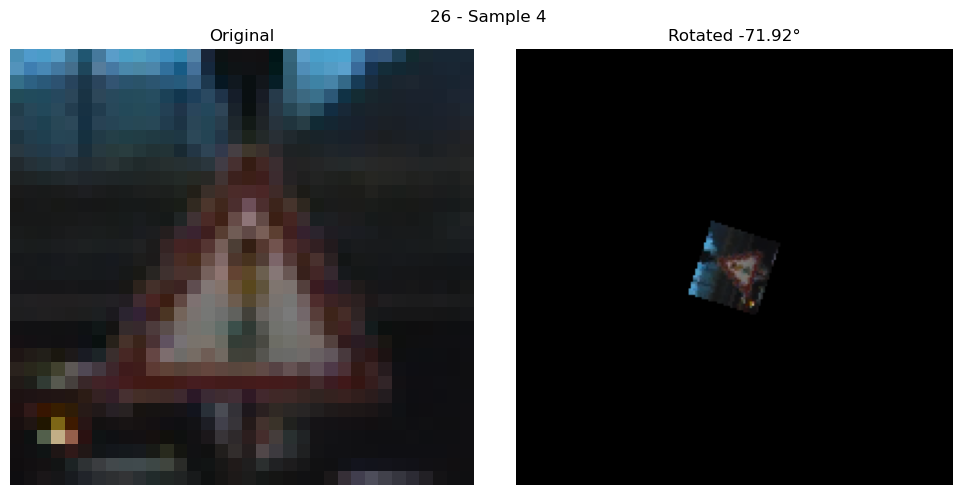

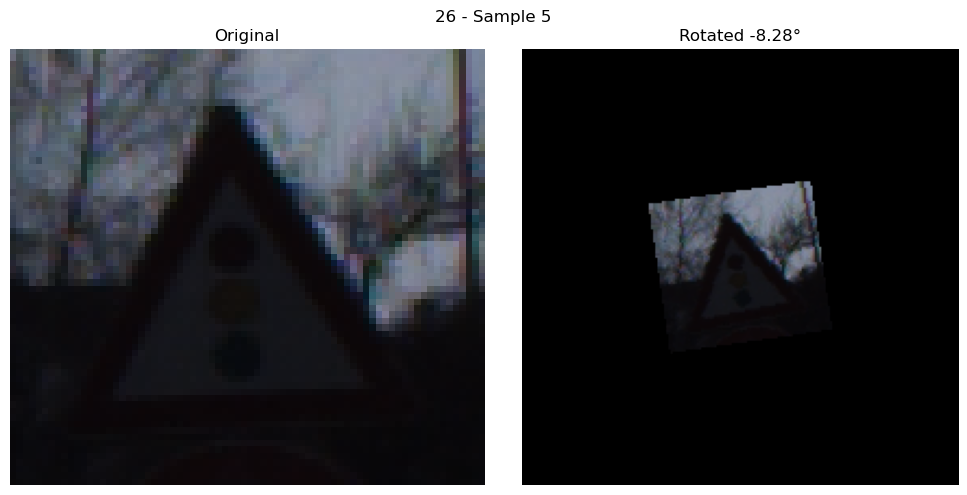

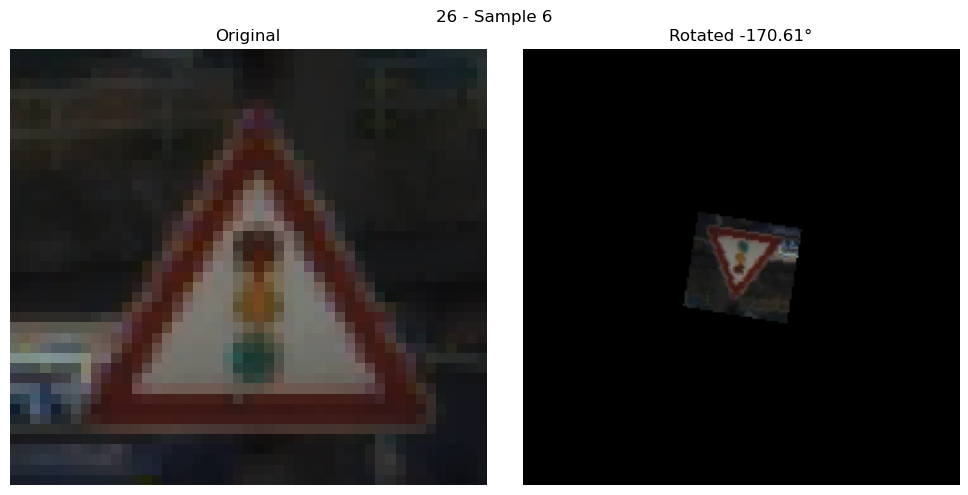

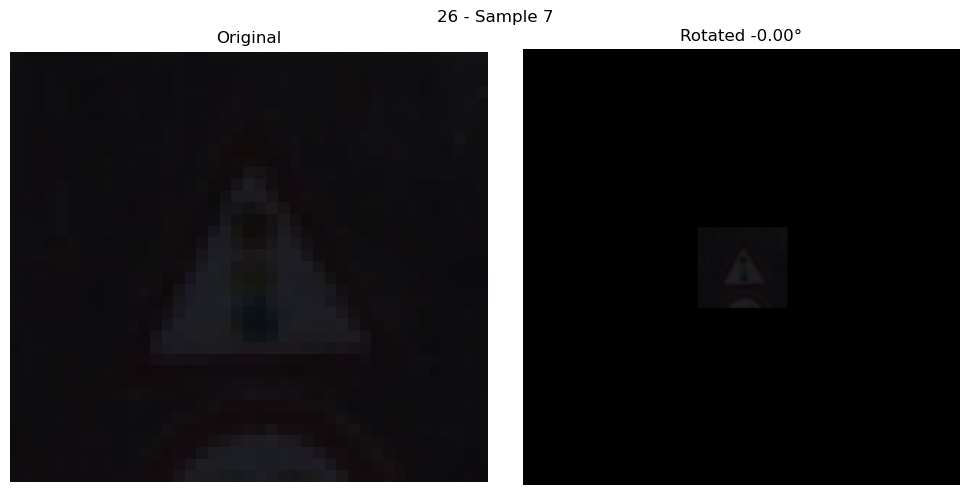

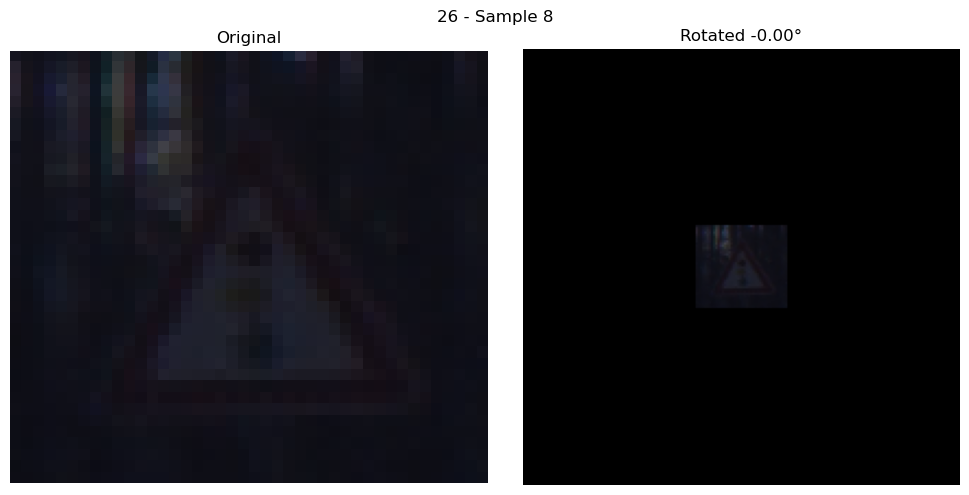

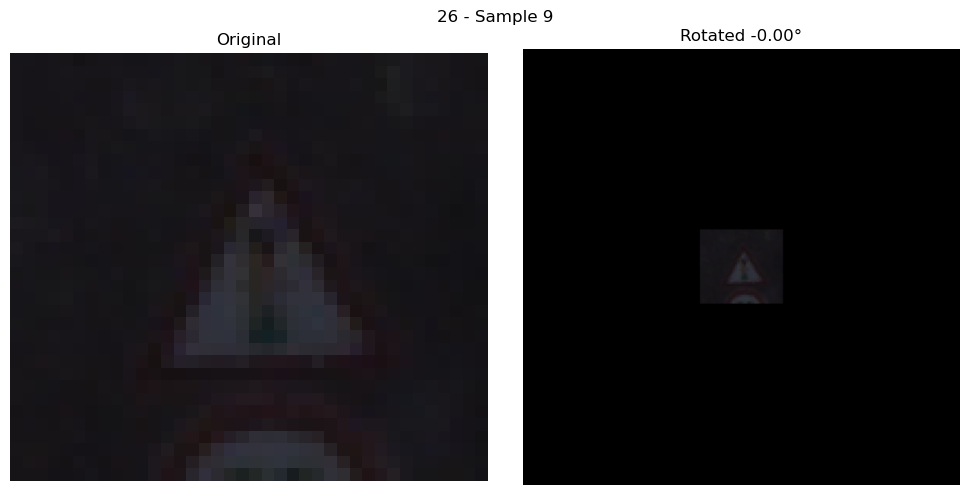

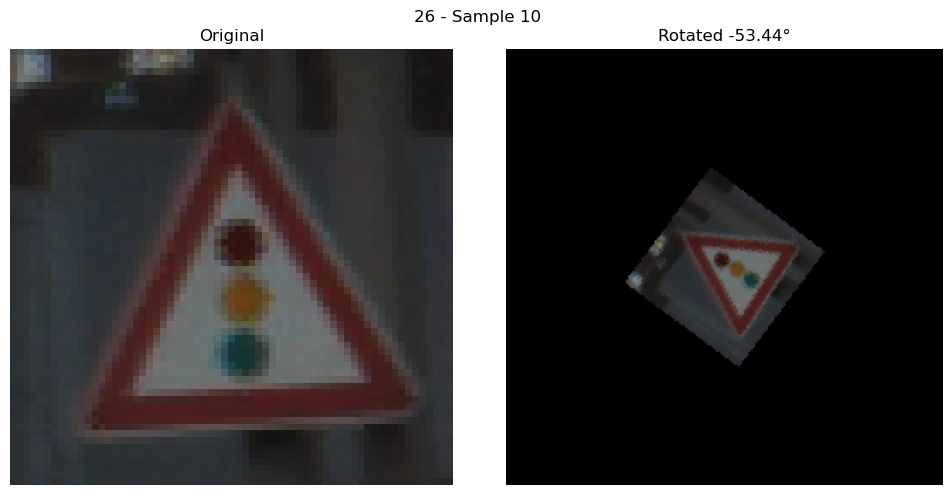

Class: 18


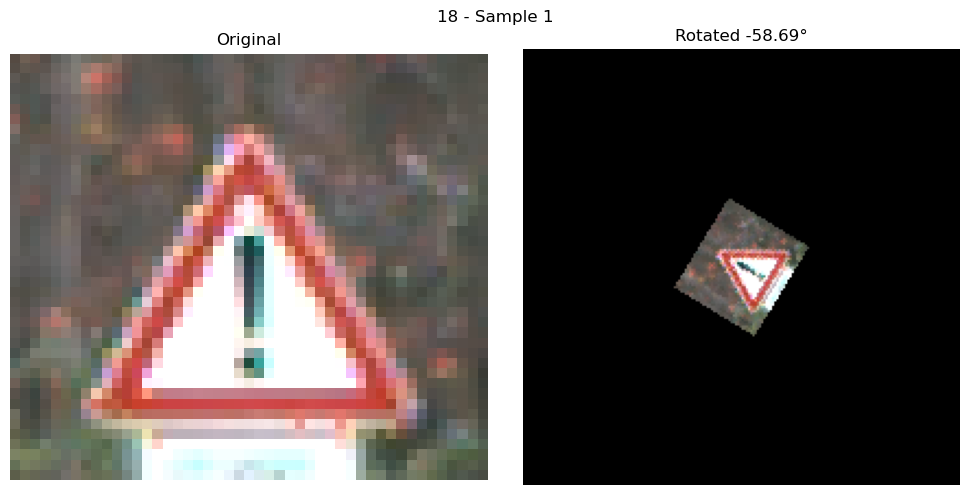

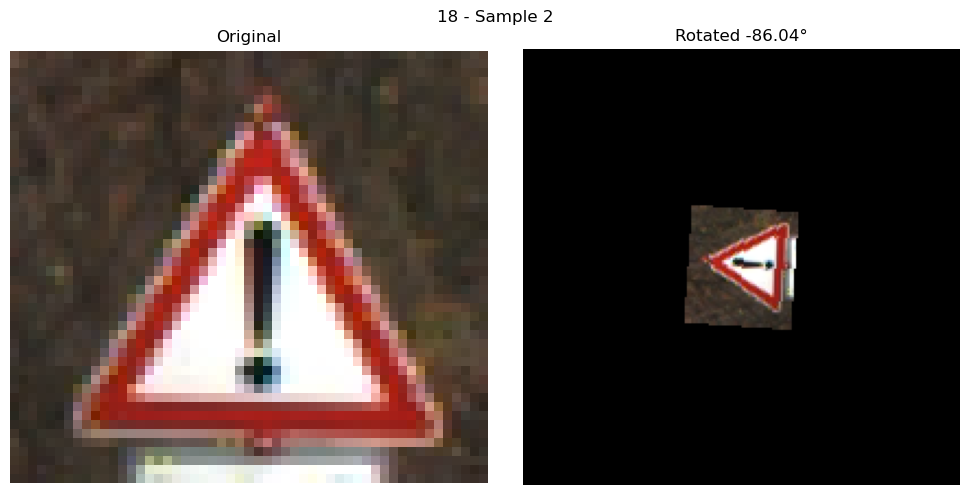

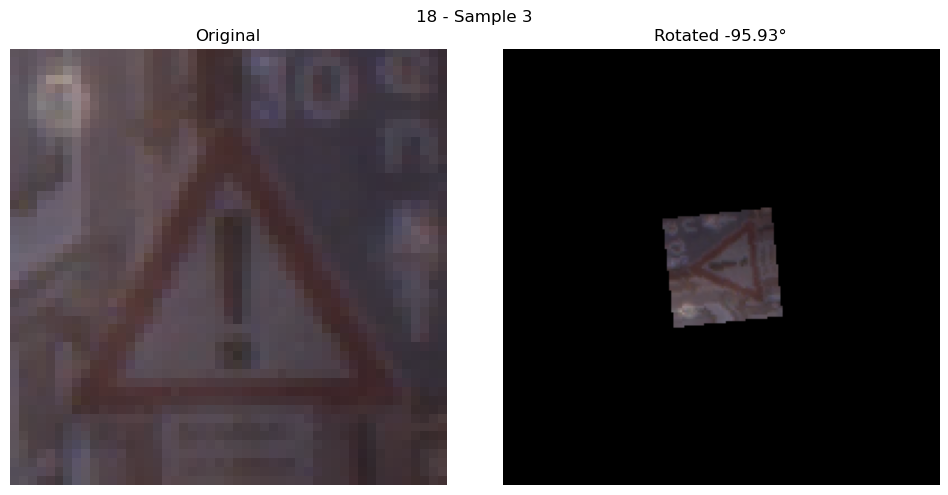

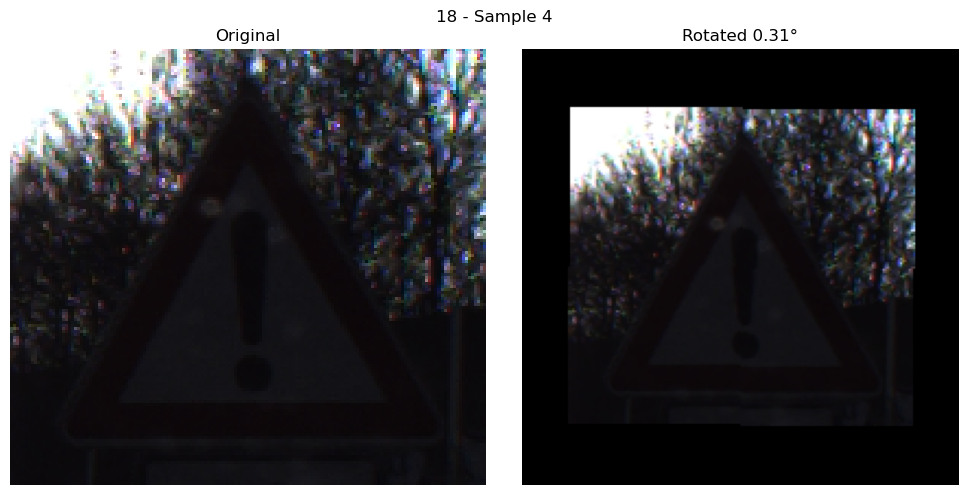

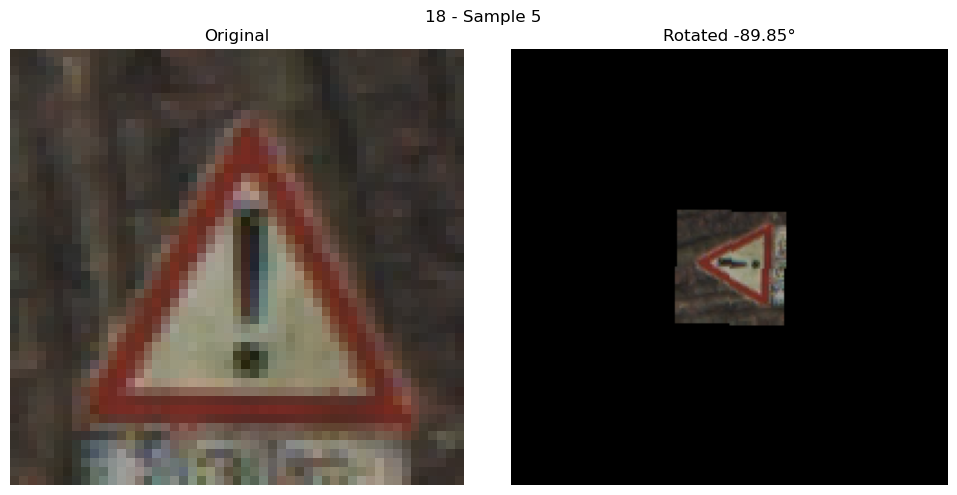

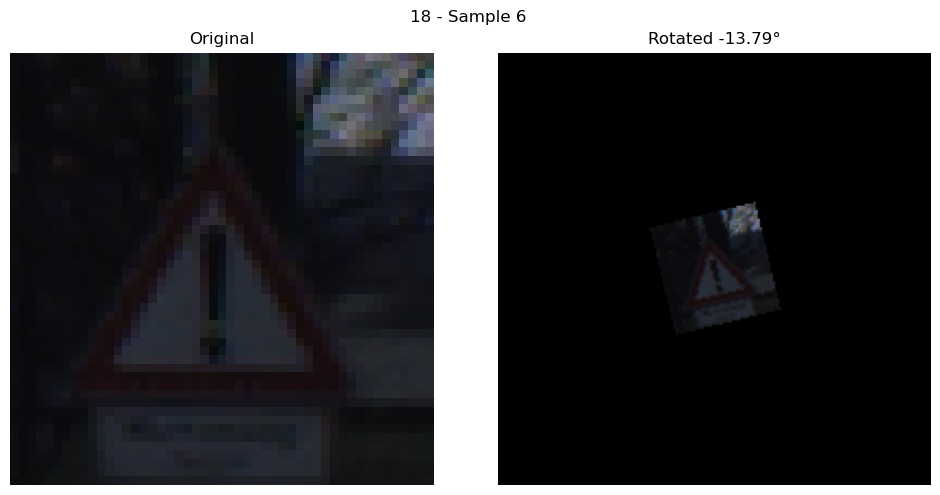

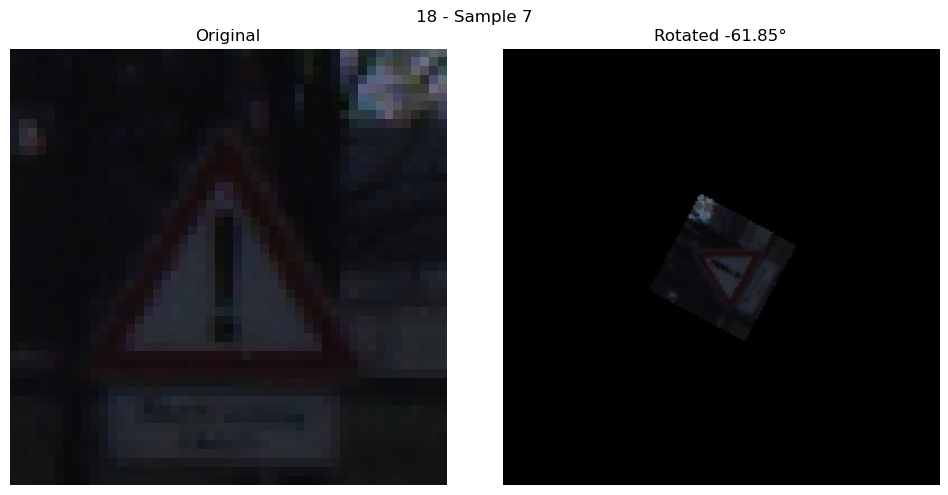

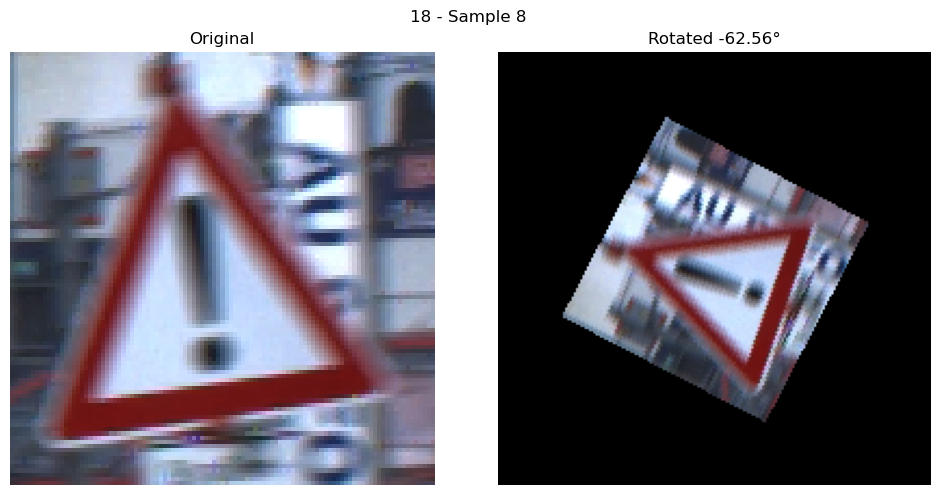

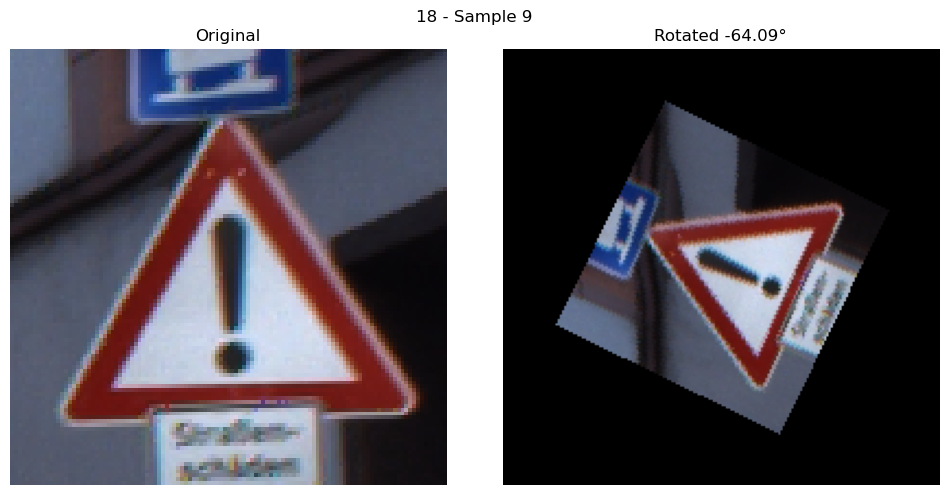

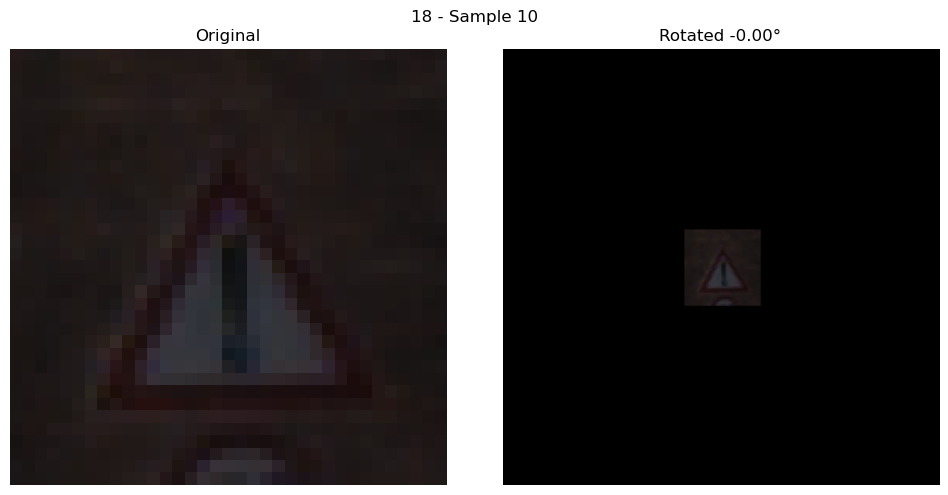

Class: 20


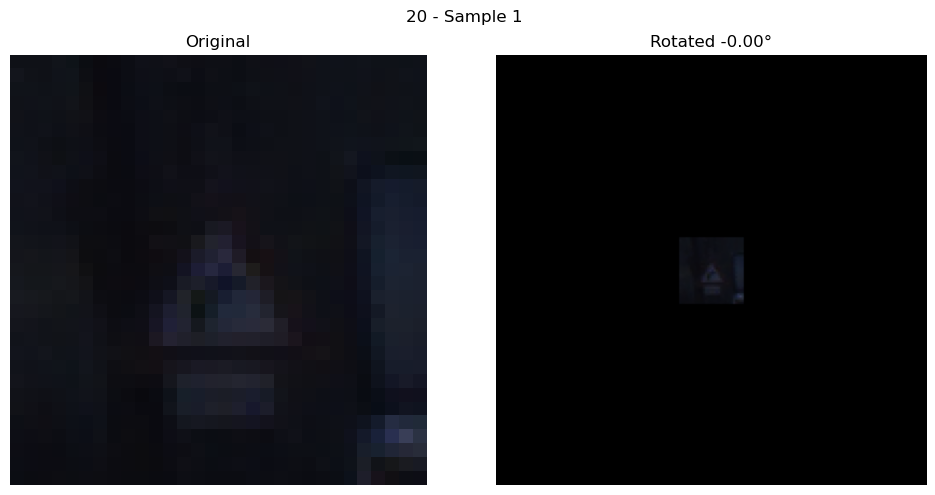

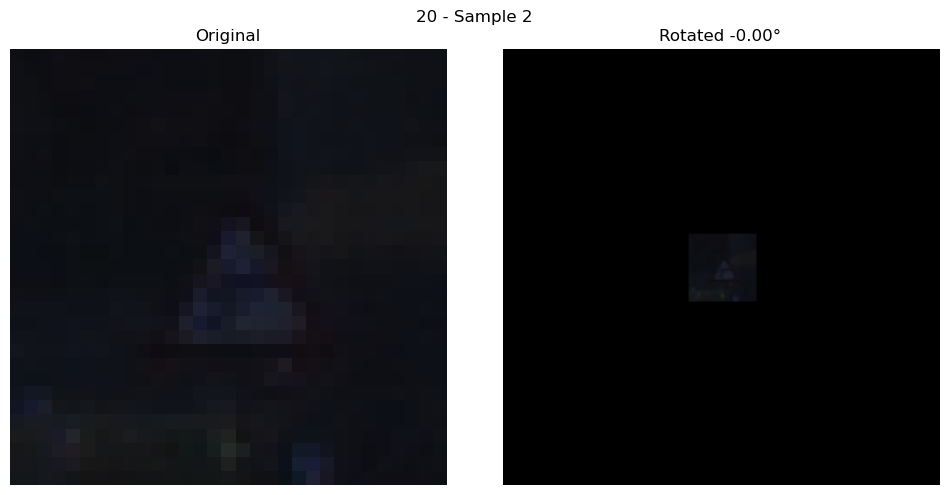

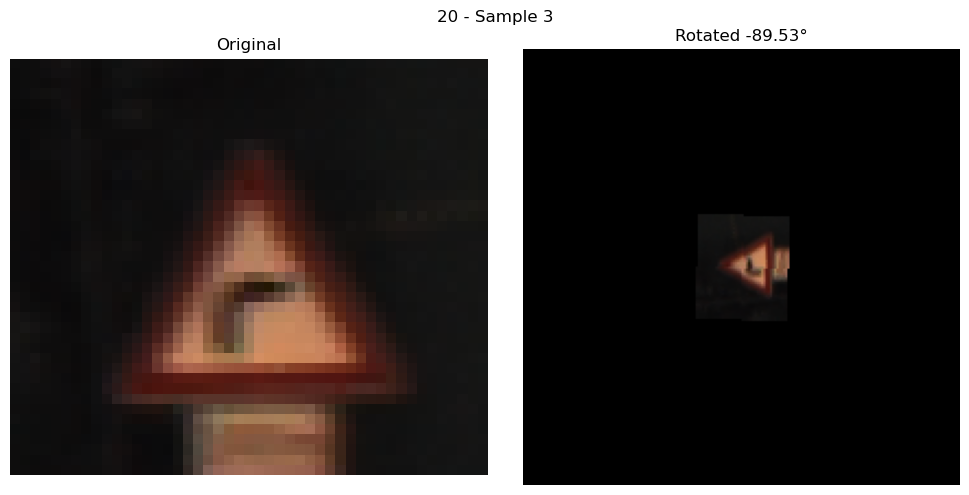

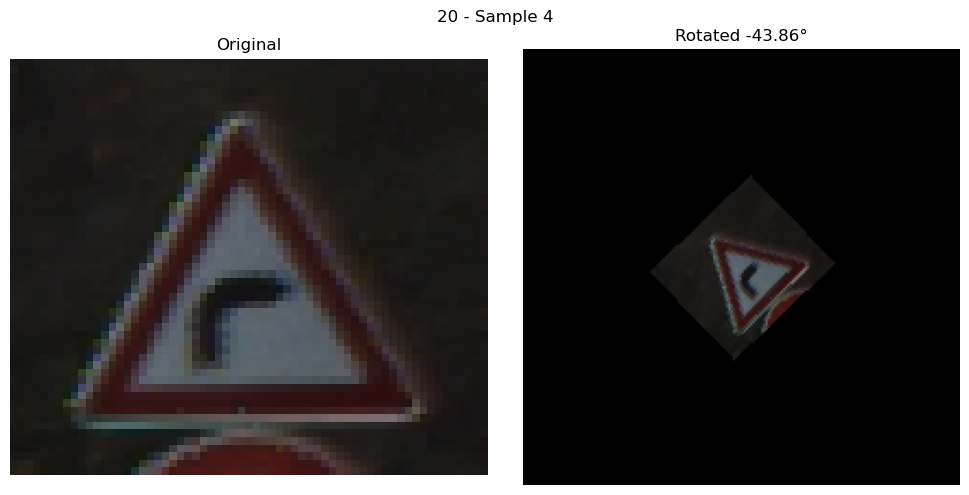

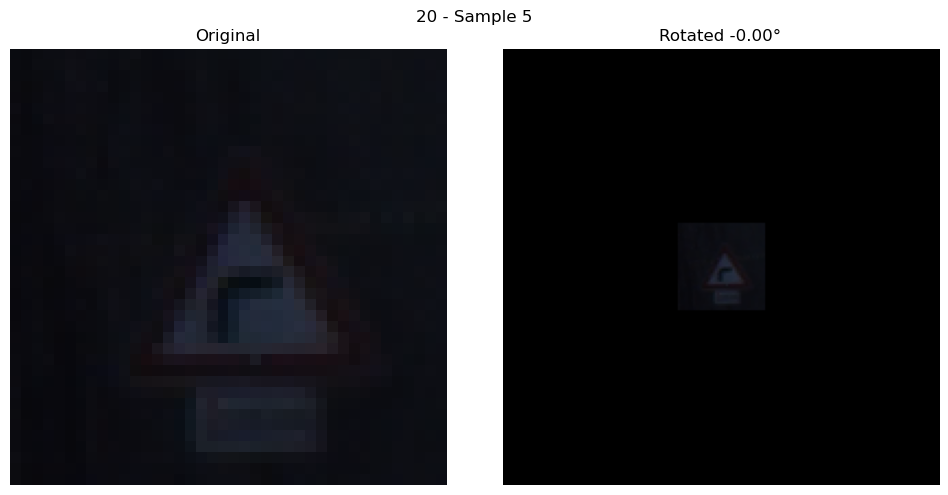

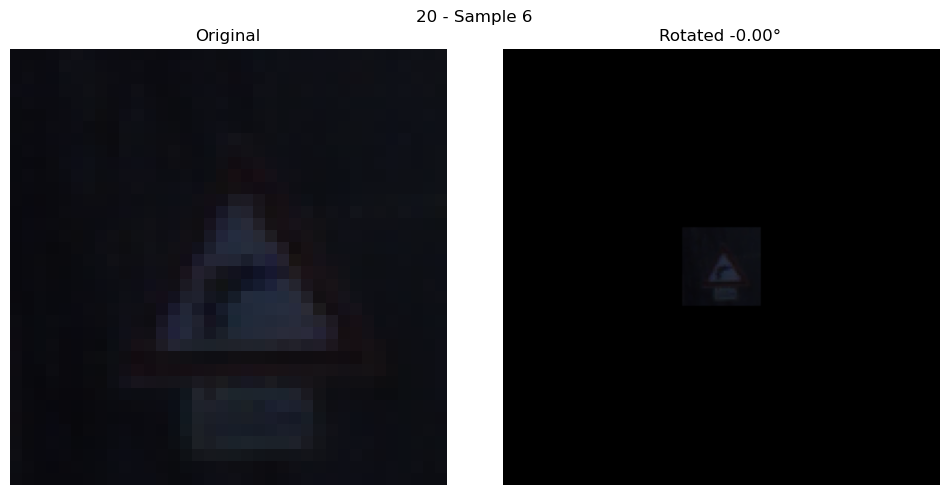

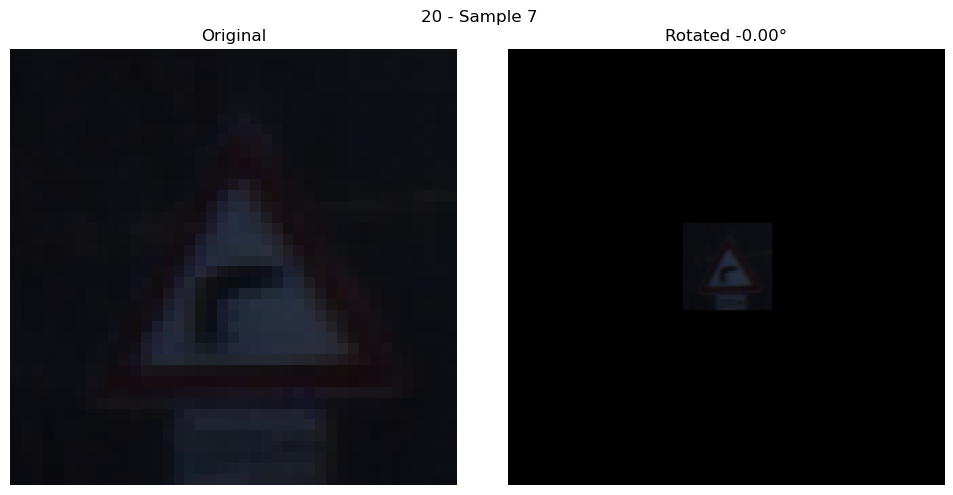

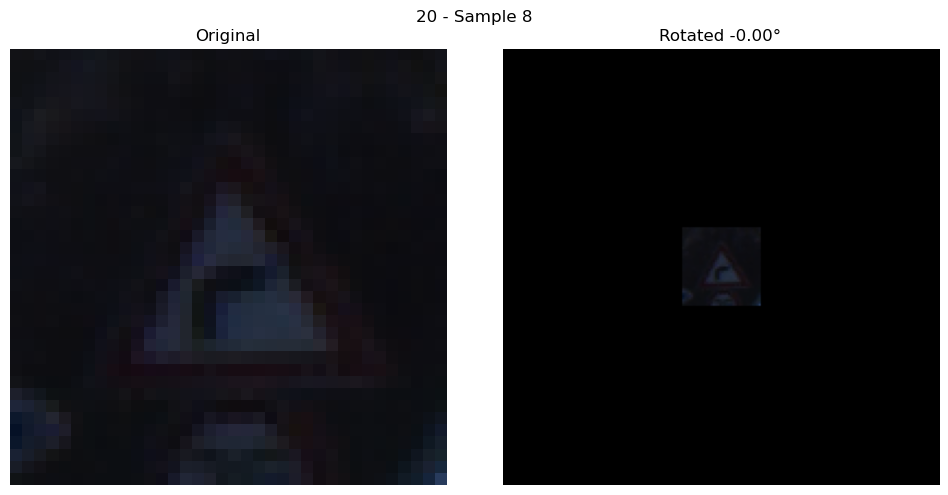

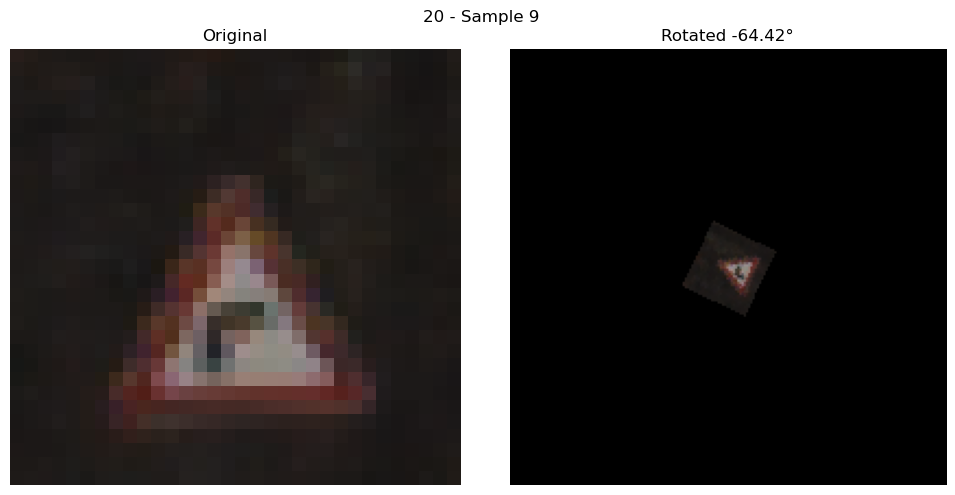

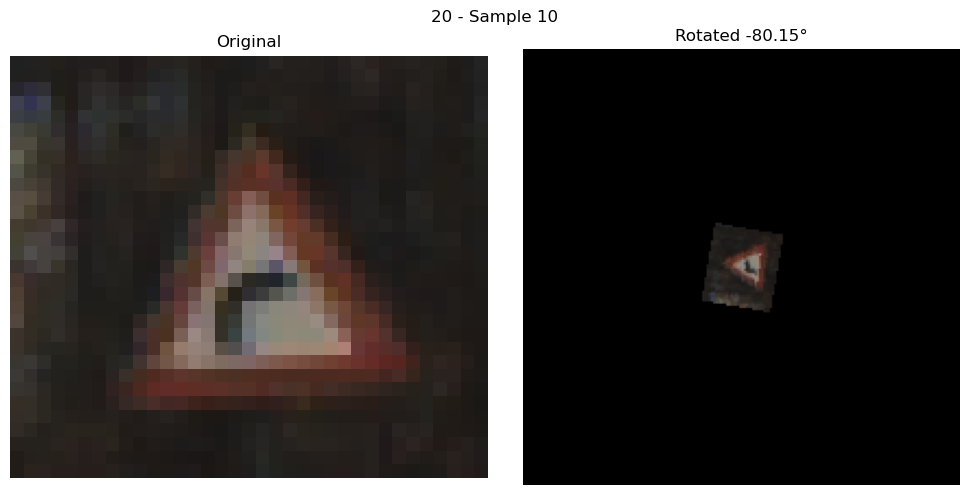

Class: 36


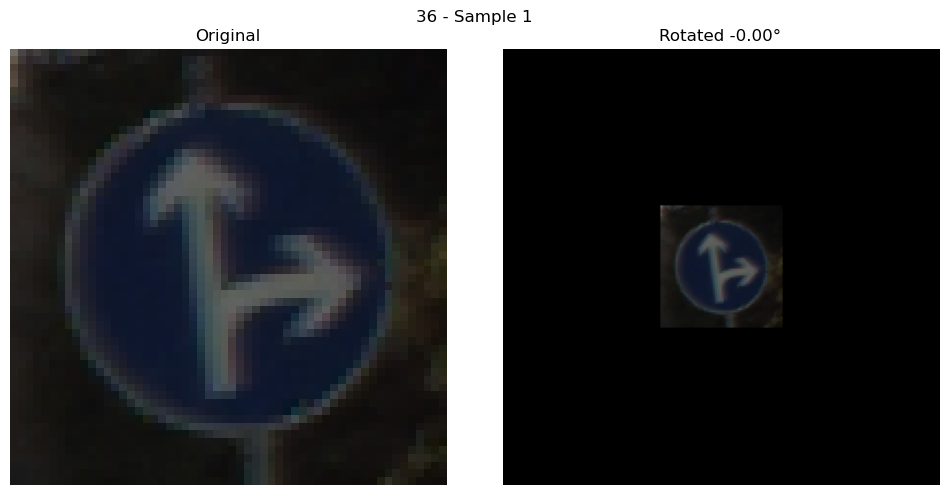

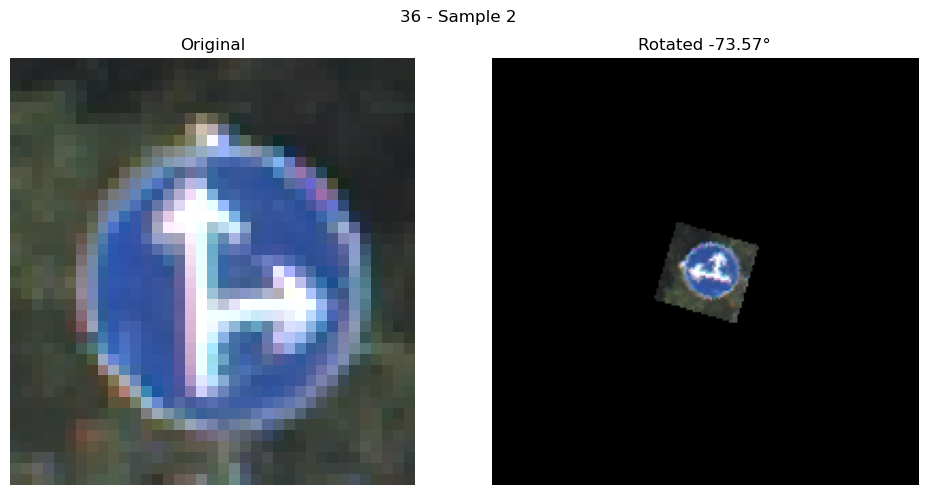

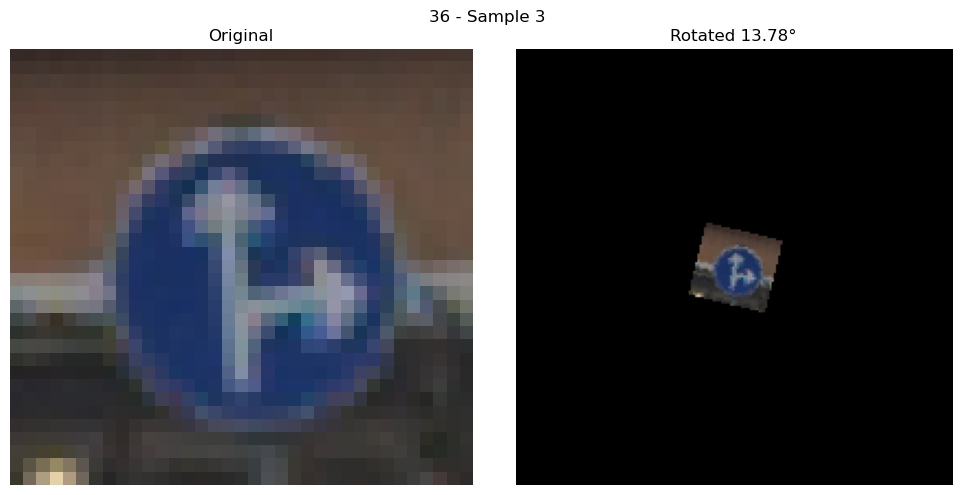

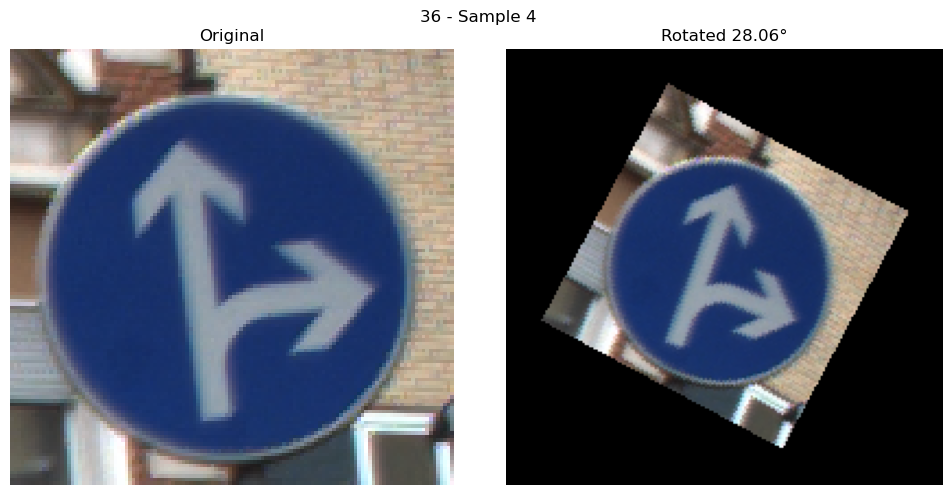

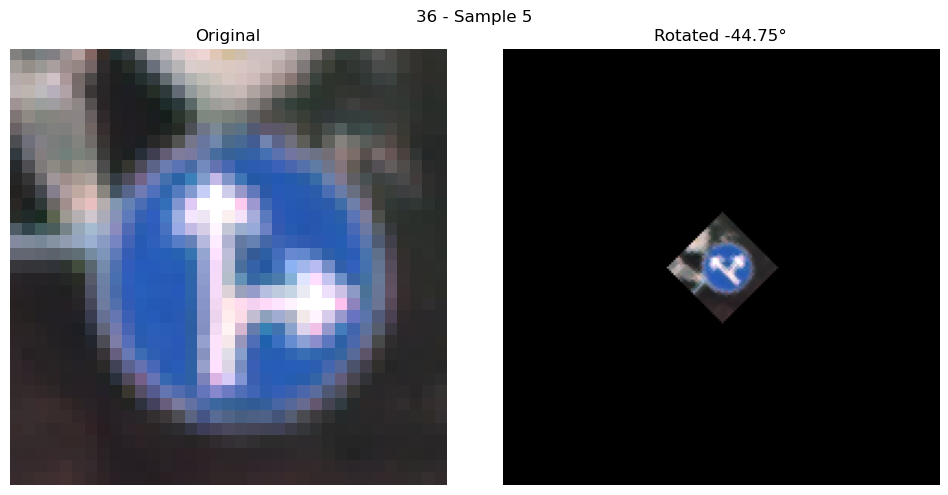

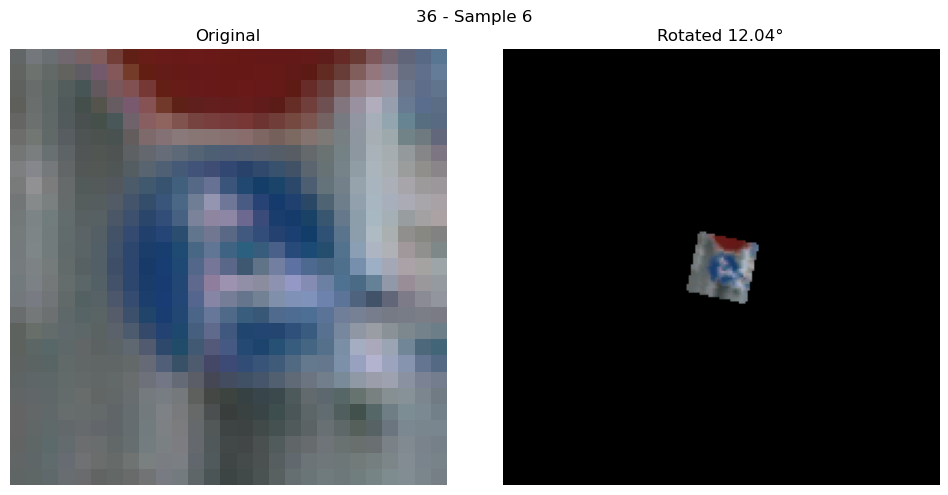

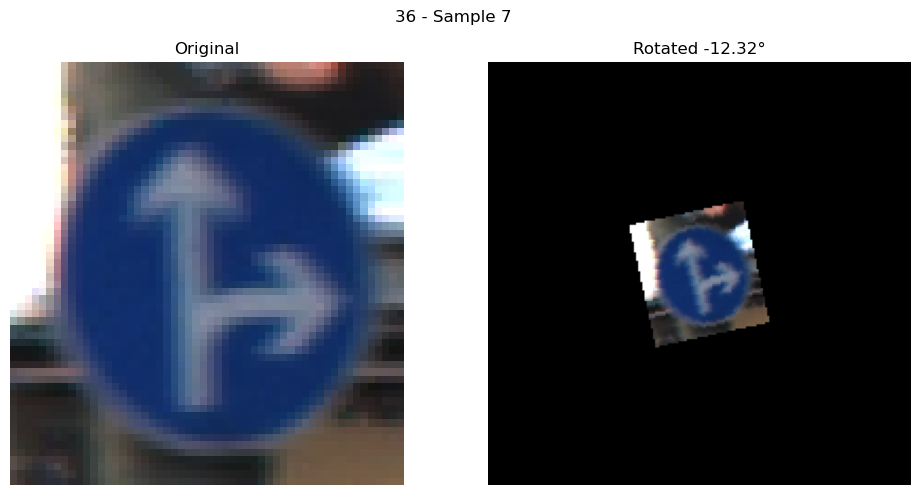

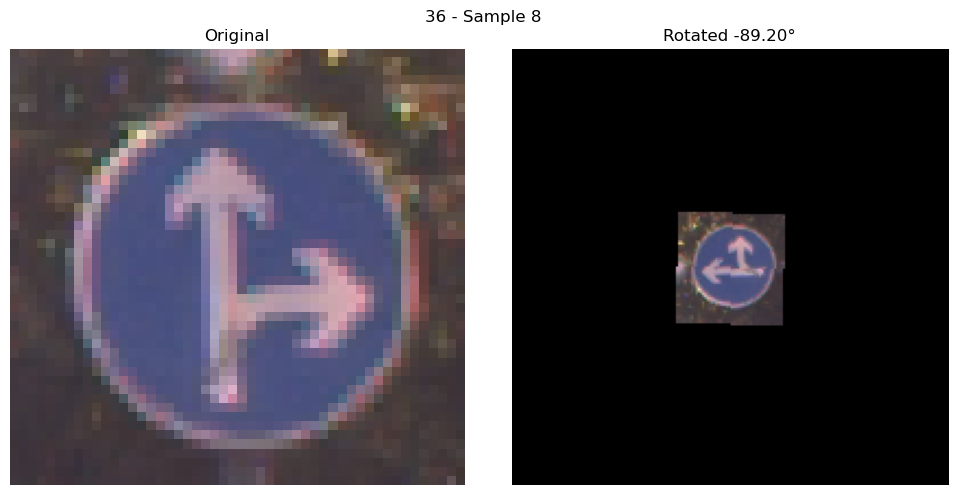

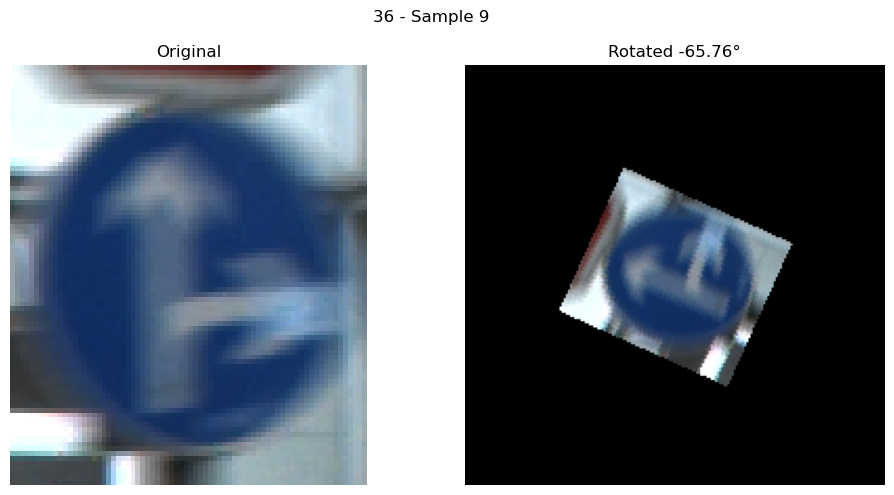

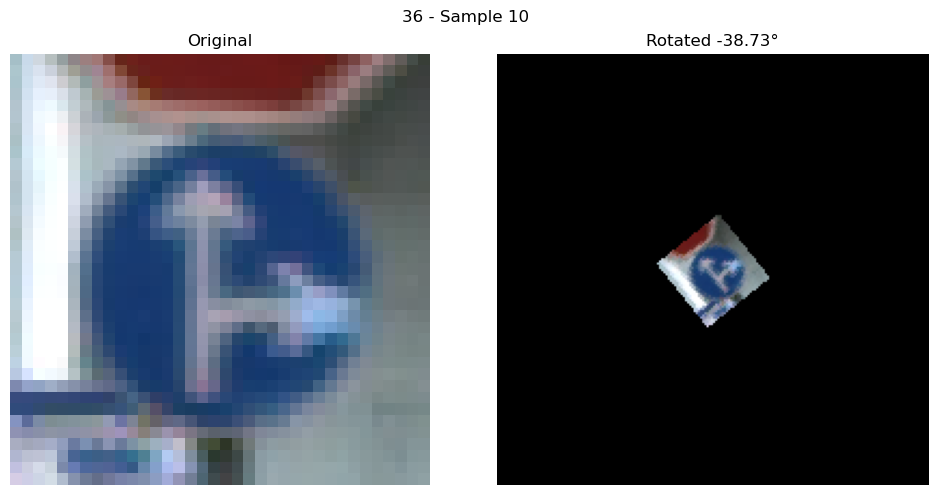

Class: 9


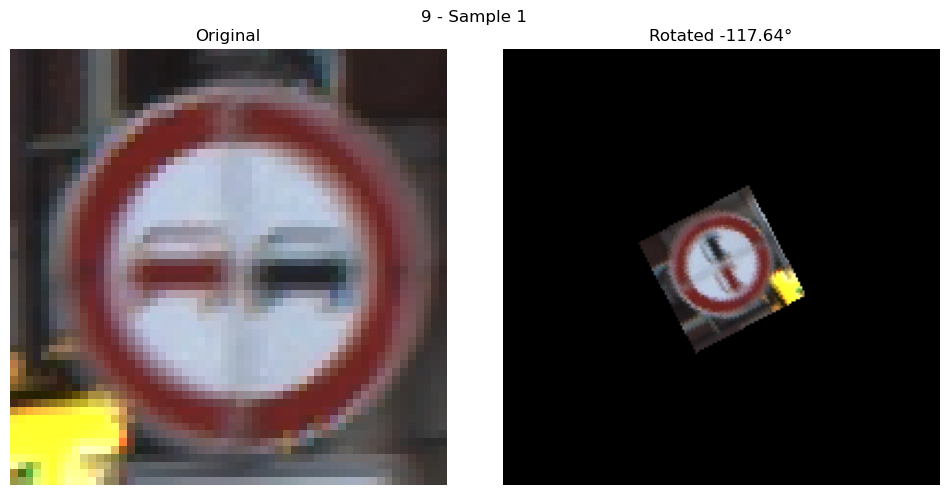

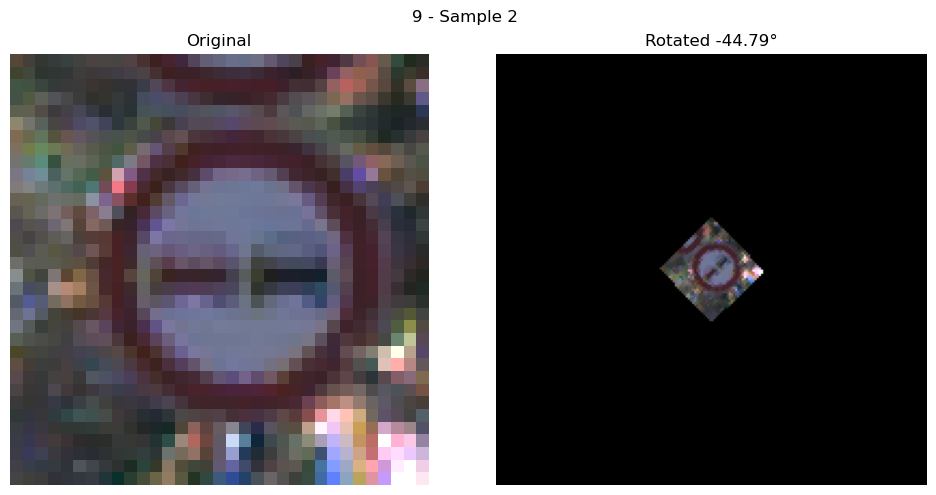

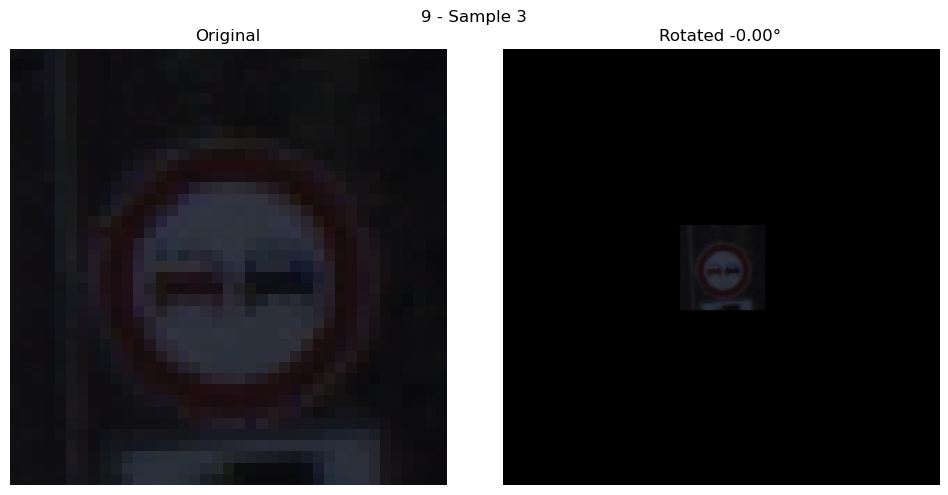

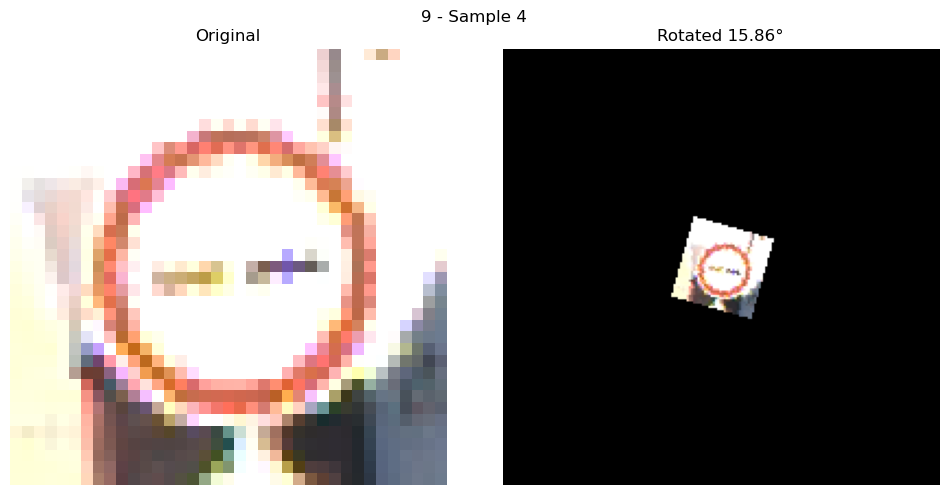

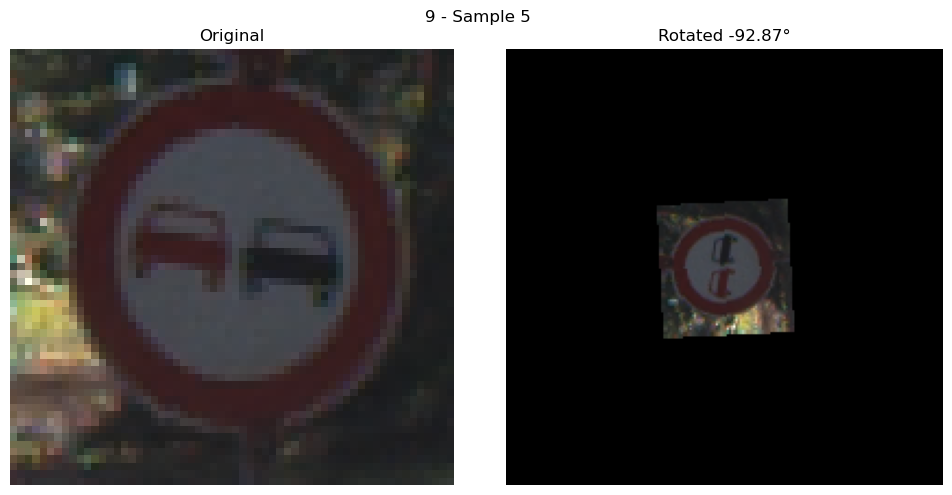

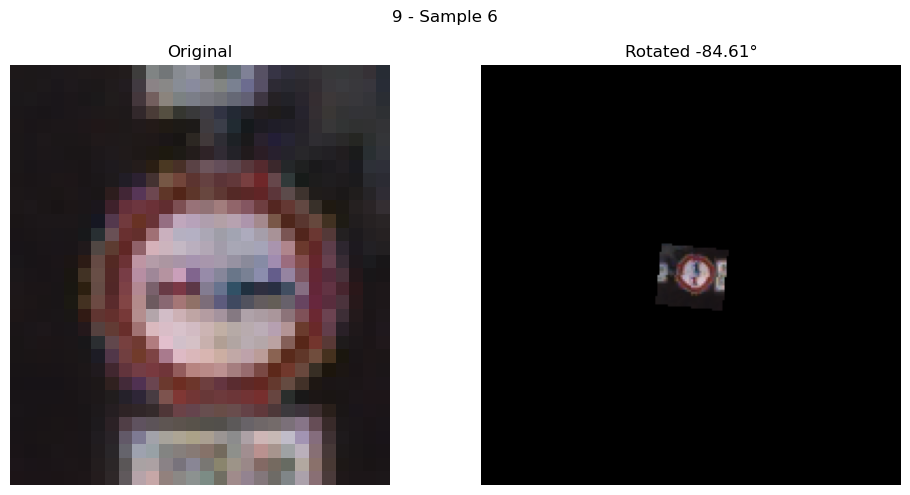

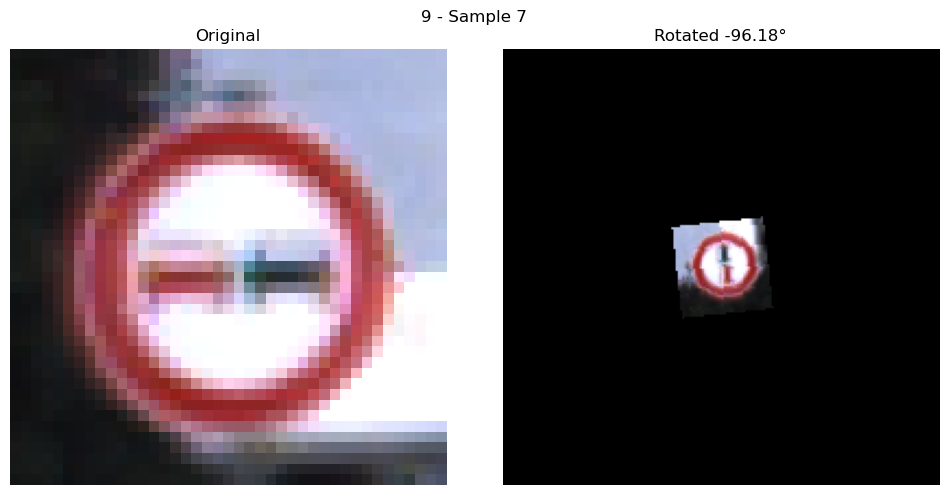

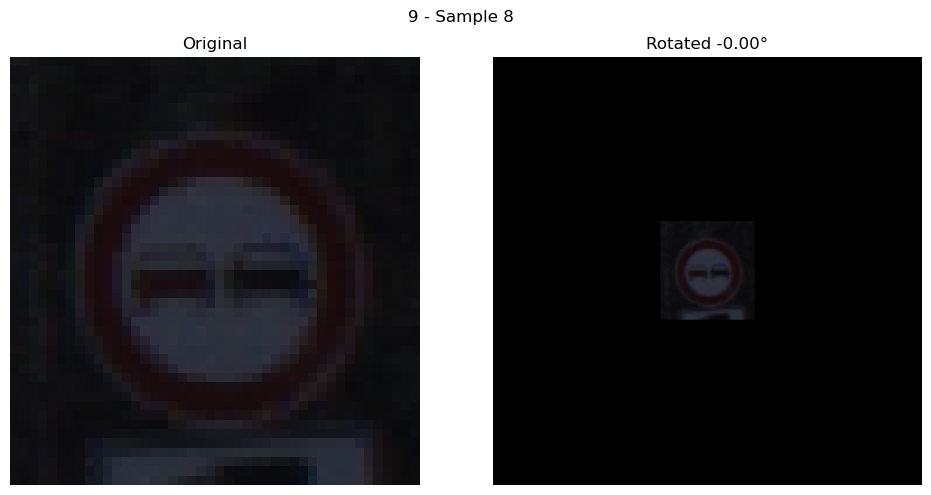

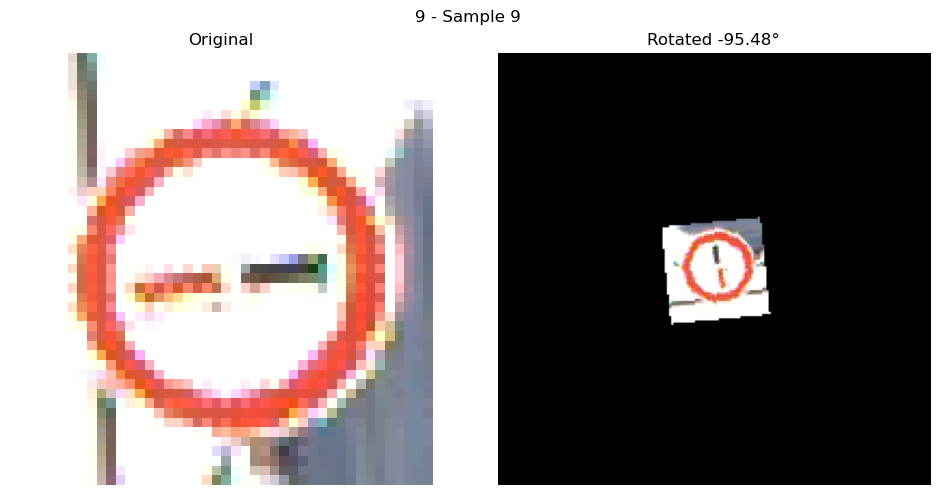

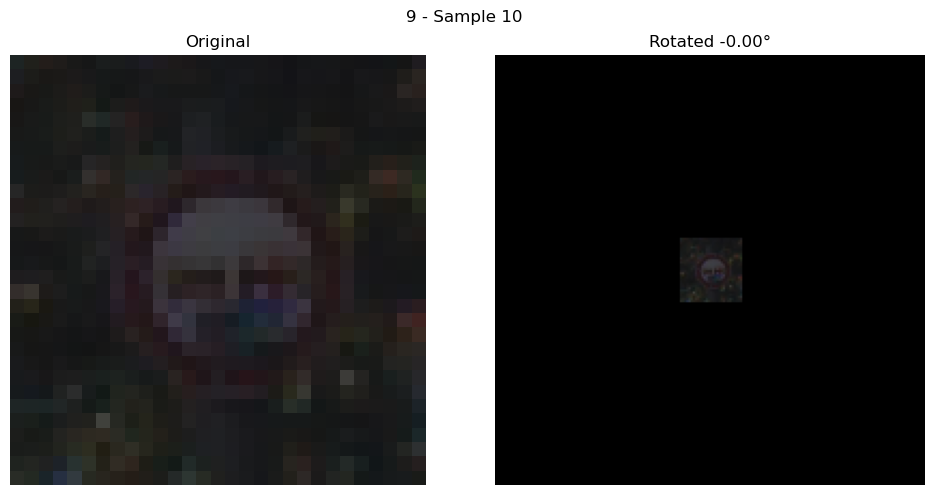

In [33]:
for cls, imgTuples in normalizedByClass.items():
    print(f"Class: {cls}")
    for i, (original, normalized, angle) in enumerate(imgTuples[:10]):
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(original)
        ax[0].set_title("Original")
        ax[1].imshow(normalized)
        ax[1].set_title(f"Rotated {angle:.2f}°")
        for a in ax:
            a.axis('off')
        plt.suptitle(f"{cls} - Sample {i+1}")
        plt.tight_layout()
        plt.show()


In [34]:
def harris_corner_count(gray_img, window_size=3, k=0.04, threshold=1e6):
    Ix = cv.Sobel(gray_img, cv.CV_64F, 1, 0, ksize=3)
    Iy = cv.Sobel(gray_img, cv.CV_64F, 0, 1, ksize=3)

    Ixx = Ix ** 2
    Iyy = Iy ** 2
    Ixy = Ix * Iy

    kernel = cv.getGaussianKernel(window_size, sigma=1)
    gauss = kernel @ kernel.T
    Sxx = cv.filter2D(Ixx, -1, gauss)
    Syy = cv.filter2D(Iyy, -1, gauss)
    Sxy = cv.filter2D(Ixy, -1, gauss)

    detM = Sxx * Syy - Sxy ** 2
    traceM = Sxx + Syy
    R = detM - k * (traceM ** 2)

    corners = (R > threshold).astype(np.uint8)
    count = np.sum(corners)
    return count

def compute_circularity(binary_mask):
    area = np.sum(binary_mask > 0)
    contours, _ = cv.findContours(binary_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return 0
    perimeter = cv.arcLength(contours[0], True)
    if perimeter == 0:
        return 0
    circularity = (4 * np.pi * area) / (perimeter ** 2)
    return circularity

def compute_shape_features(binary_mask):
    y_coords, x_coords = np.nonzero(binary_mask)
    if len(x_coords) == 0 or len(y_coords) == 0:
        return 0, 0

    x_min, x_max = np.min(x_coords), np.max(x_coords)
    y_min, y_max = np.min(y_coords), np.max(y_coords)

    width = x_max - x_min + 1
    height = y_max - y_min + 1

    aspect_ratio = width / height
    area = np.sum(binary_mask > 0)
    extent = area / (width * height)
    return aspect_ratio, extent

def compute_average_hue(rgb_img, binary_mask):
    hsv = cv.cvtColor(rgb_img, cv.COLOR_RGB2HSV)
    hue = hsv[:, :, 0]
    masked_hue = hue[binary_mask > 0]
    return np.mean(masked_hue) if masked_hue.size > 0 else 0

def extract_features(normalized_rgb, binary_mask):
    gray = cv.cvtColor(normalized_rgb, cv.COLOR_RGB2GRAY)
    
    corner_count = harris_corner_count(gray)
    circularity = compute_circularity(binary_mask)
    aspect_ratio, extent = compute_shape_features(binary_mask)
    avg_hue = compute_average_hue(normalized_rgb, binary_mask)

    return {
        "corner_count": corner_count,
        "circularity": circularity,
        "aspect_ratio": aspect_ratio,
        "extent": extent,
        "average_hue": avg_hue
    }


In [35]:
RedfeaturesByClass = {}

for class_name, images in imagesByClass.items():
    feat = []
    for i in range(len(images)):
        features = extract_features(imagesByClass[class_name][i], postprocessedMasksByClass[class_name]['red'][i])
        feat.append(features)
    RedfeaturesByClass[class_name] = feat


In [36]:
BluefeaturesByClass = {}

for class_name, images in imagesByClass.items():
    feat = []
    for i in range(len(images)):
        features = extract_features(imagesByClass[class_name][i], postprocessedMasksByClass[class_name]['blue'][i])
        feat.append(features)
    BluefeaturesByClass[class_name] = feat


In [37]:
averagedRedFeaturesByClass = {}

for cls, feature_list in RedfeaturesByClass.items():
    count = len(feature_list)
    avg_dict = {}
    
    for key in feature_list[0].keys():
        avg_dict[key] = sum(d[key] for d in feature_list) / count

    averagedRedFeaturesByClass[cls] = avg_dict


In [38]:
averagedBlueFeaturesByClass = {}

for cls, feature_list in BluefeaturesByClass.items():
    count = len(feature_list)
    avg_dict = {}
    
    for key in feature_list[0].keys():
        avg_dict[key] = sum(d[key] for d in feature_list) / count

    averagedBlueFeaturesByClass[cls] = avg_dict


In [39]:
feature_names = list(next(iter(averagedRedFeaturesByClass.values())).keys())

header = f"{'Class':<190}" + "".join([f"{feat:^25}" for feat in feature_names])
print(f"{'':<130}" + "".join([f"{'Red':^12}|{'Blue':^12}" for _ in feature_names]))
print("=" * (0 + len(feature_names) * 24))
print(header)
print("-" * (0 + len(feature_names) * 24))

for cls in averagedRedFeaturesByClass.keys():
    row = f"{cls:<130}"
    for feat in feature_names:
        red_val = averagedRedFeaturesByClass[cls][feat]
        blue_val = averagedBlueFeaturesByClass[cls][feat]
        row += f"{red_val:^12.2f}|{blue_val:^12.2f}"
    print(row)


                                                                                                                                      Red     |    Blue        Red     |    Blue        Red     |    Blue        Red     |    Blue        Red     |    Blue    
Class                                                                                                                                                                                               corner_count              circularity             aspect_ratio                extent                 average_hue       
------------------------------------------------------------------------------------------------------------------------
5                                                                                                                                    308.70   |   308.70       0.27    |    0.19        0.47    |    0.11        0.16    |    0.03       28.32    |    8.89    
12                                                 

READING TEST IMAGES

In [40]:
csv = pd.read_csv('Data/Test.csv')

In [41]:
filtered_df = csv[csv['ClassId'].isin(list(map(int,selectedClasses)))]
selected_paths = filtered_df['Path'].tolist()

In [42]:
base_path = 'Data'  
TestimagesByClass = {}

for path in selected_paths:
    class_id = csv[csv['Path'] == path]['ClassId'].values[0]

    full_path = os.path.join(base_path, path)

    if class_id not in TestimagesByClass:
        TestimagesByClass[class_id] = []

    img = cv.imread(full_path)
    if img is not None:
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        TestimagesByClass[class_id].append(img)

In [43]:
filtered_images_by_class = {}

for class_id, original_images in TestimagesByClass.items():
    print(class_id)
    filtered_images = []
    for img in original_images:
        filtered = highboost_filter_rgb(img)  
        filtered_images.append(filtered)
    filtered_images_by_class[class_id] = filtered_images


18
12
9
20
5
26
36


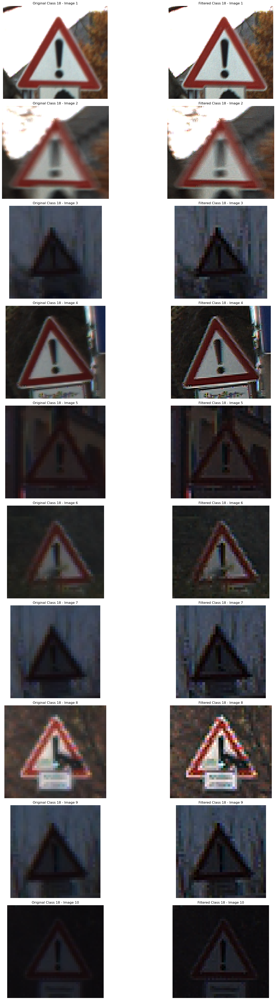

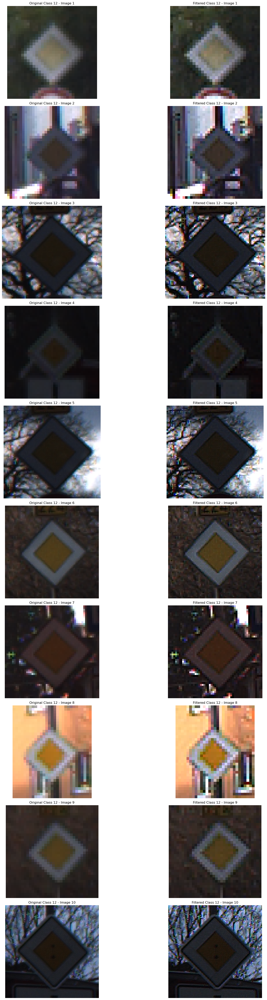

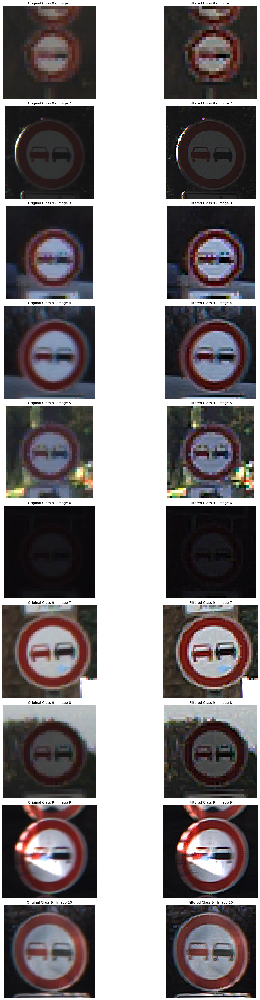

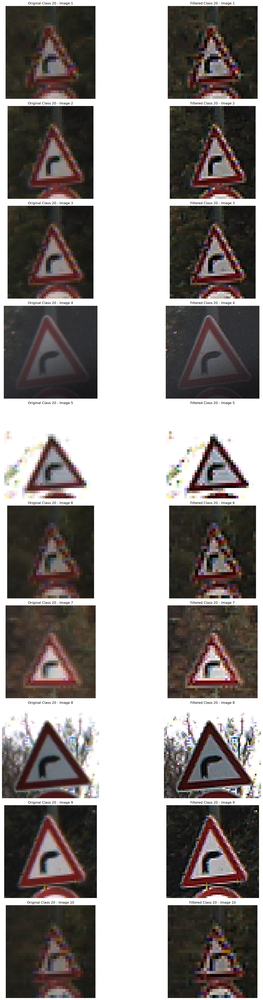

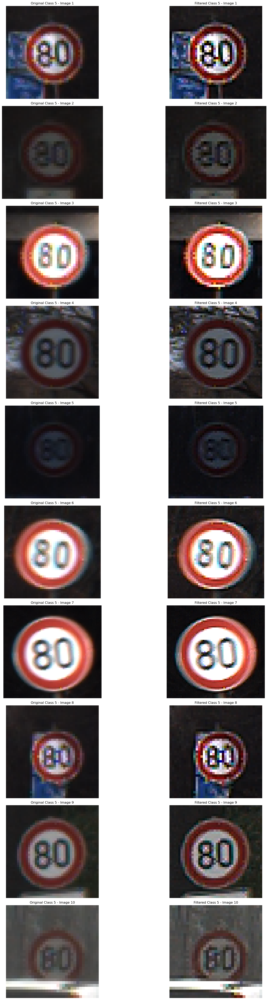

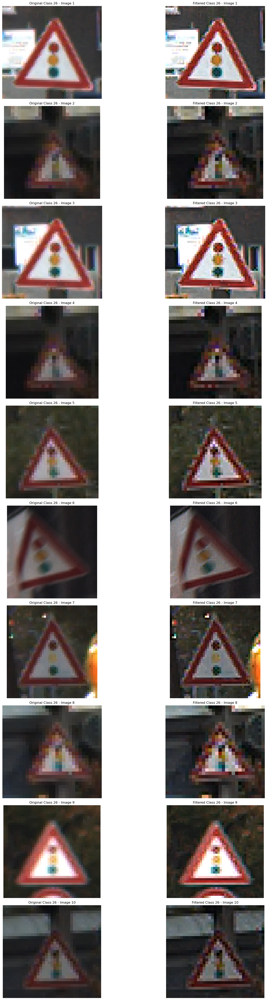

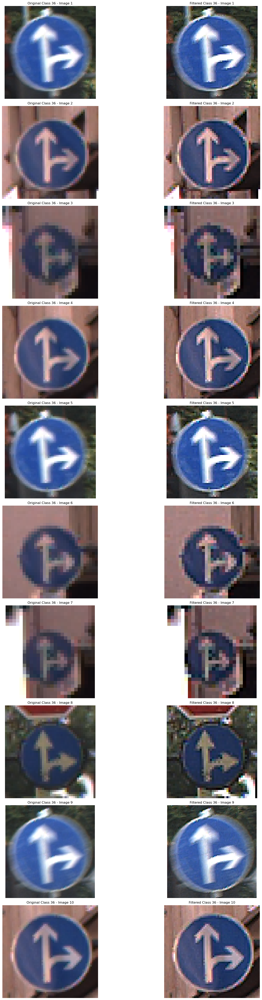

In [44]:
for class_id, original_images in TestimagesByClass.items():
    filtered_images = filtered_images_by_class[class_id]
    num_images_to_show = min(10, len(original_images))  

    fig, axes = plt.subplots(num_images_to_show, 2, figsize=(20, 5 * num_images_to_show))

    for i in range(num_images_to_show):
        axes[i, 0].imshow(original_images[i])
        axes[i, 0].set_title(f"Original Class {class_id} - Image {i+1}")
        axes[i, 0].axis('off') 

        axes[i, 1].imshow(filtered_images[i])
        axes[i, 1].set_title(f"Filtered Class {class_id} - Image {i+1}")
        axes[i, 1].axis('off') 
    
    plt.tight_layout()
    plt.show()

In [45]:
redBlueMasksByClass = {}

for class_name, images in filtered_images_by_class.items():
    red_masks = []
    blue_masks = []

    for img in images:
        hsv_img = rgb_to_hsv_simple(img)
        red_mask, blue_mask = segment_red_blue(hsv_img)
        red_masks.append(red_mask)
        blue_masks.append(blue_mask)

    redBlueMasksByClass[class_name] = {
        'original': images,
        'red': red_masks,
        'blue': blue_masks
    }


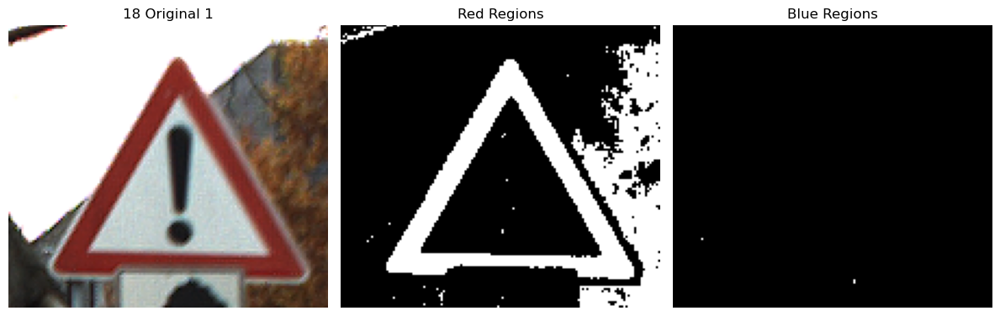

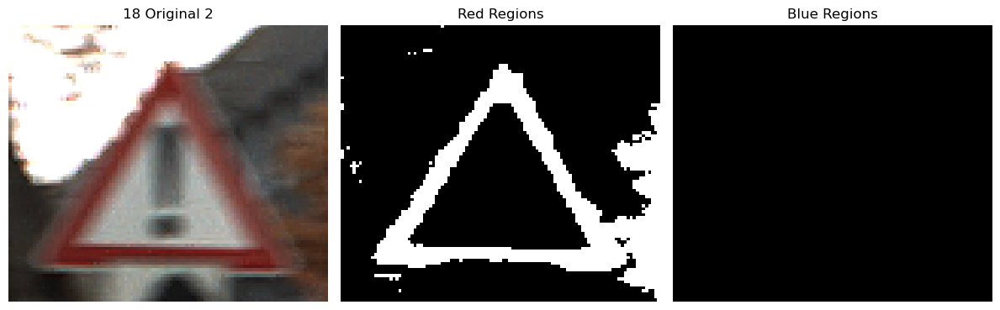

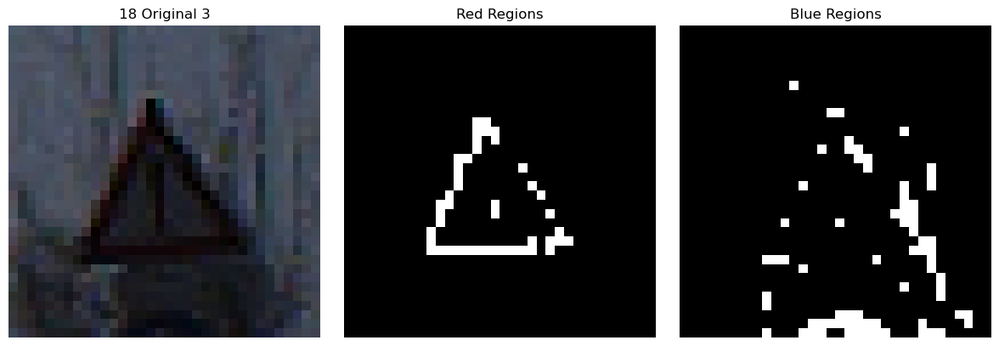

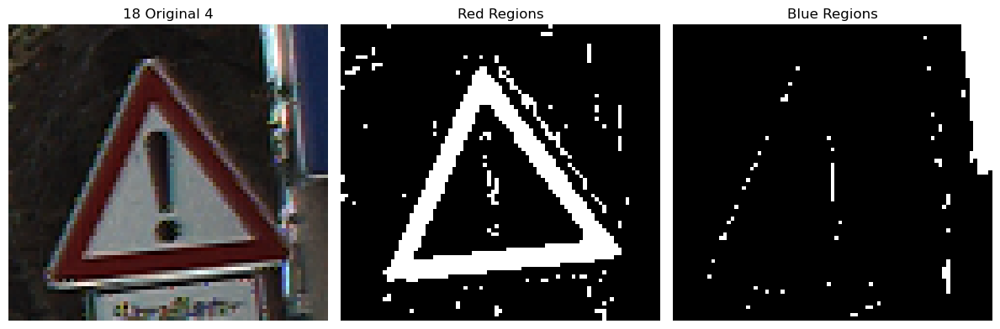

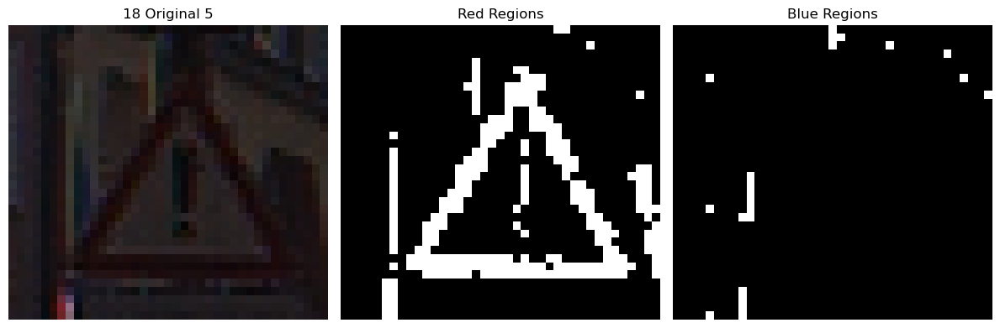

...

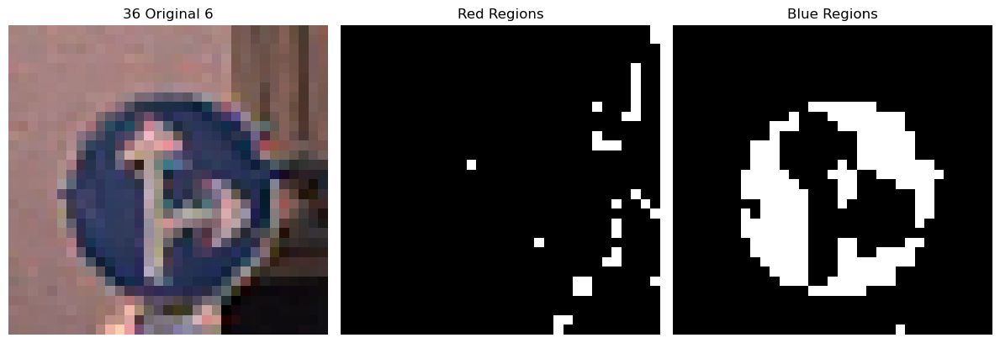

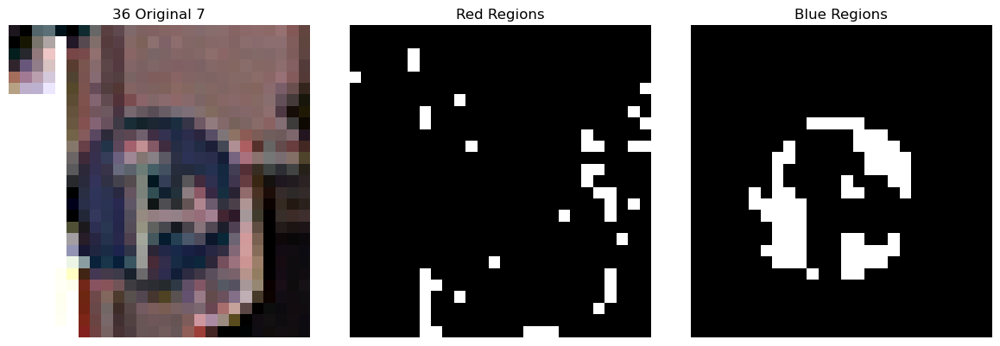

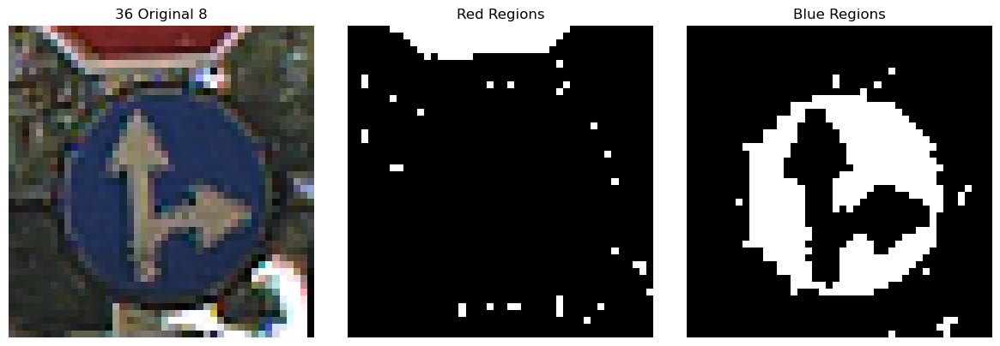

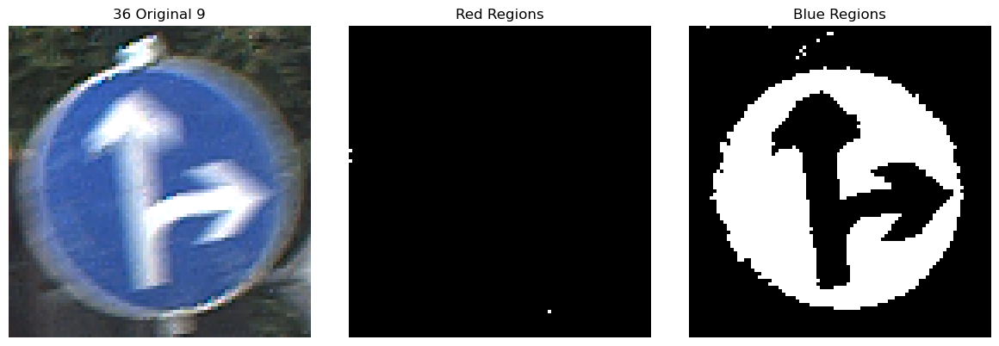

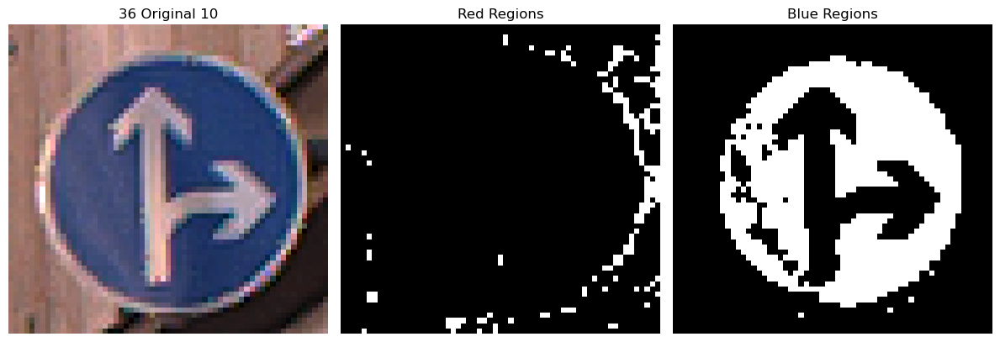

In [46]:
for class_name, data in redBlueMasksByClass.items():
    original_images = data['original']
    red_masks = data['red']
    blue_masks = data['blue']

    num_to_show = min(10, len(original_images))

    for i in range(num_to_show):
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))

        axes[0].imshow(original_images[i])
        axes[0].set_title(f"{class_name} Original {i+1}")
        axes[0].axis('off')

        axes[1].imshow(red_masks[i] * 255, cmap='gray')
        axes[1].set_title("Red Regions")
        axes[1].axis('off')

        axes[2].imshow(blue_masks[i] * 255, cmap='gray')
        axes[2].set_title("Blue Regions")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()


In [47]:
postprocessedMasksByClass = {}

for class_name, data in redBlueMasksByClass.items():
    print(class_name)
    red_post = []
    blue_post = []

    red_masks = data['red']
    blue_masks = data['blue']

    for red, blue in zip(red_masks, blue_masks):
        red_postprocessed = visualize_postprocessing_steps(red, area_thresh=30)
        blue_postprocessed = visualize_postprocessing_steps(blue, area_thresh=30)
        red_post.append(red_postprocessed)
        blue_post.append(blue_postprocessed)
    
    postprocessedMasksByClass[class_name] = {
        'original': data['original'],
        'red': red_post,
        'blue': blue_post
    }

18
12
9
20
5
26
36


In [48]:
testPredictions = []

for class_name, images in postprocessedMasksByClass.items(): 
    for i in range(len(images['original'])):
        original_img = images['original'][i]
        red_mask = postprocessedMasksByClass[class_name]['red'][i]
        blue_mask = postprocessedMasksByClass[class_name]['blue'][i]

        test_features_red = extract_features(original_img, red_mask)
        test_features_blue = extract_features(original_img, blue_mask)

        testPredictions.append({
            "original_class": class_name,
            "features_red": test_features_red,
            "features_blue": test_features_blue
        })

In [49]:
def compute_distance(test_feat, train_feat):
    return sum((test_feat[f] - train_feat[f])**2 for f in test_feat)**0.5


In [50]:
results = []

for test in testPredictions:
    test_red = test["features_red"]
    test_blue = test["features_blue"]
    
    min_dist = float('inf')
    predicted_class = None

    for train_class in averagedRedFeaturesByClass.keys():
        dist_red = compute_distance(test_red, averagedRedFeaturesByClass[train_class])
        dist_blue = compute_distance(test_blue, averagedBlueFeaturesByClass[train_class])
        
        total_dist = dist_red + dist_blue

        if total_dist < min_dist:
            min_dist = total_dist
            predicted_class = train_class

    results.append({
        "ground_truth": test["original_class"],
        "predicted": int(predicted_class),
        "correct": int(int(predicted_class) == test["original_class"])
    })


PLOTTING CONFUSION MATRIX

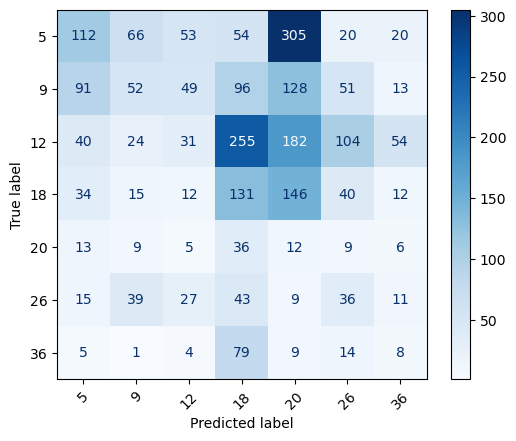

In [55]:
correct = sum(r['correct'] for r in results)
total = len(results)
accuracy = correct / total

# Extract true and predicted labels
y_true = [r['ground_truth'] for r in results]
y_pred = [r['predicted'] for r in results]

# Save predictions to CSV using pandas
df = pd.DataFrame({'Ground Truth': y_true, 'Predicted': y_pred})
df.to_csv('predictions.csv', index=False)

# Compute confusion matrix
labels = sorted(set(y_true))
cm = confusion_matrix(y_true, y_pred, labels=labels)

# Save accuracy and confusion matrix to a text file
with open('metrics.txt', 'w') as f:
    f.write(f"Accuracy: {correct}/{total} = {accuracy:.2%}\n")
    f.write("Confusion Matrix:\n")
    for row in cm:
        f.write(' '.join(str(x) for x in row) + '\n')

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.show()

In [52]:
feature_names = list(testPredictions[0]['features_red'].keys())

header = f"{'Class':<190}" + "".join([f"{feat:^25}" for feat in feature_names])
print(f"{'':<130}" + "".join([f"{'Red':^12}|{'Blue':^12}" for _ in feature_names]))
print("=" * (0 + len(feature_names) * 24))
print(header)
print("-" * (0 + len(feature_names) * 24))

for idx, pred in enumerate(testPredictions):
    row = f"{f'Test {idx+1}':<130}"
    for feat in feature_names:
        red_val = pred['features_red'][feat]
        blue_val = pred['features_blue'][feat]
        row += f"{red_val:^12.2f}|{blue_val:^12.2f}"
    print(row)


                                                                                                                                      Red     |    Blue        Red     |    Blue        Red     |    Blue        Red     |    Blue        Red     |    Blue    
Class                                                                                                                                                                                               corner_count              circularity             aspect_ratio                extent                 average_hue       
------------------------------------------------------------------------------------------------------------------------
Test 1                                                                                                                              1994.00   |  1994.00      21.08    |    0.00        1.04    |    0.00        0.29    |    0.00        8.01    |    0.00    
Test 2                                             